In [8]:
import pennylane as qml
from pennylane import numpy as np

from tqdm import tqdm
from IPython.display import clear_output

import torch
from torch.autograd import Variable
from torchvision import datasets, transforms
from functools import reduce
import random
import math
import matplotlib.pyplot as plt
import pickle
import pandas as pd

In [9]:
# 기본 세팅
name1 = "AAPL"
name2 = "TSLA"
cut_left = -0.1
cut_right = 0.1
num_bins = 16
num_dataset = 2000

## 금융 데이터를 yfinance로부터 받아오기

In [10]:
import yfinance as yf
import datetime

def get_stocks_datas(ticker_names: list[str], start_date, end_date):
    # WARN: returns는 prices보다 길이가 1 작다.
    prices = {}
    returns = {}
    for name in ticker_names:
        data = yf.Ticker(name)
        data = data.history(start=start_date, end=end_date, interval="1d")
        prices[name] = data['Close']
        returns[name] = data['Close'].pct_change()[1:]
    return prices, returns

start_date = datetime.datetime(2011, 1, 1)
end_date = datetime.datetime(2022, 12, 31)
stock_prices, stock_returns = get_stocks_datas([name1, name2], start_date, end_date)


AAPL: No price data found, symbol may be delisted (1d 2011-01-01 00:00:00 -> 2022-12-31 00:00:00)
TSLA: No price data found, symbol may be delisted (1d 2011-01-01 00:00:00 -> 2022-12-31 00:00:00)


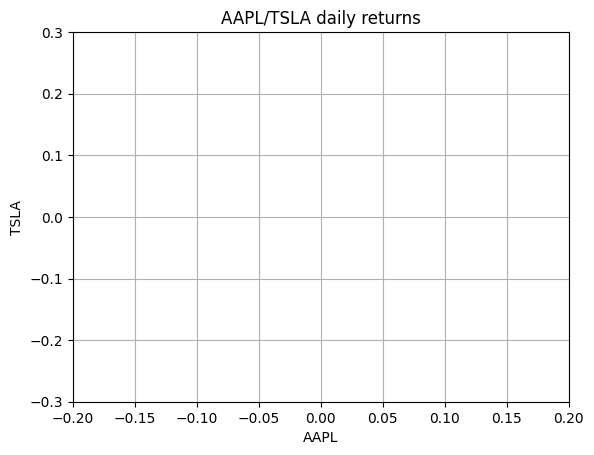

In [4]:
# 산점도 그리기
plt.scatter(stock_returns[name1].values, stock_returns[name2].values, alpha=0.5)
plt.title(f'{name1}/{name2} daily returns')
plt.xlabel(name1)
plt.ylabel(name2)
plt.xlim(-0.2, 0.2)
plt.ylim(-0.3, 0.3)
plt.grid(True)
plt.show()

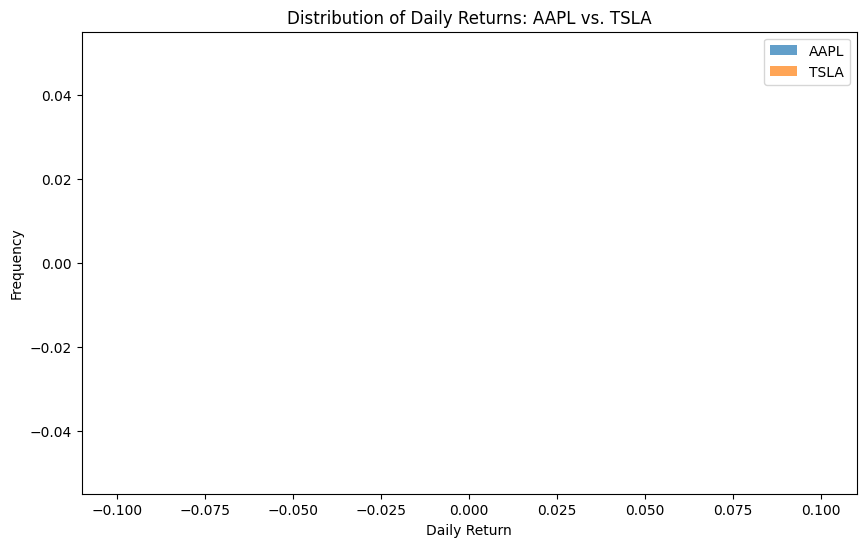

Mean of AAPL: nan
Mean of TSLA: nan


In [5]:
import matplotlib.pyplot as plt
import numpy as np

bin_edges = np.linspace(cut_left, cut_right, num_bins+1)

plt.figure(figsize=(10, 6))

plt.hist(stock_returns[name1].values, bins=bin_edges, alpha=0.7, label=name1)
plt.hist(stock_returns[name2].values, bins=bin_edges, alpha=0.7, label=name2)

plt.title(f'Distribution of Daily Returns: {name1} vs. {name2}')
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.legend()
plt.show()

print(f"Mean of {name1}: {stock_returns[name1].mean():.4f}")
print(f"Mean of {name2}: {stock_returns[name2].mean():.4f}")


## risk-return space에 그려보자
앞으로 우리가 뽑을 최종 결과물이다

/var/folders/km/kx6t6bss6fv41w9lz6kc8ddc0000gn/T/ipykernel_915/3790082969.py:7: RuntimeWarning: Mean of empty slice.
  y.append(merged_returns.mean())


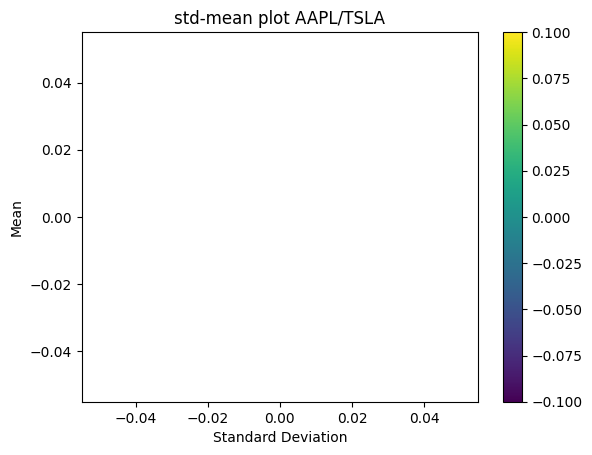

In [7]:
x = []
y = []
c = []
for k in np.linspace(-1, 2, 100):
    merged_returns = k * stock_returns[name1].values + (1 - k) * stock_returns[name2].values
    x.append(merged_returns.std())
    y.append(merged_returns.mean())
    c.append(k)

plt.scatter(x, y, c=c, cmap='viridis')
plt.xlabel('Standard Deviation')
plt.ylabel('Mean')
plt.title(f'std-mean plot {name1}/{name2}')
plt.colorbar()
plt.show()

## Dataset 생성

linespace로 균일하게 내분해서 절반, uniform으로 절반 생성한다

In [37]:
dataset = []
def add_dataset(alpha):
    # 첫번째 주식을 alpha, 두번째 주식을 1-alpha만큼.
    bins = np.linspace(-0.1, 0.1, num_bins + 1)
    returns = alpha * stock_returns[name1].values + (1 - alpha) * stock_returns[name2].values
    hist, _ = np.histogram(returns, bins=bins)
    dataset.append(hist/sum(hist))

for t in np.linspace(0, 1, num_dataset//2): # 절반은 직접 내분
    add_dataset(t)
for t in np.random.uniform(0, 1, num_dataset//2): # 절반은 랜덤
    add_dataset(t)

dataset = np.array(dataset)
print(dataset.shape)

(2000, 16)


In [38]:
# setting torch device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [39]:
noise_qubits = 4
code_qubits = 1
output_qubits = 4 # 실제로 출력 상태를 만드는데 쓰이는 개수
n_qubits = noise_qubits
assert(output_qubits <= n_qubits)

n_layers = 50
BATCH_SIZE = 16

print("n_qubits = {} n_layers = {}".format(n_qubits, n_layers))
dev = qml.device("default.qubit", wires=n_qubits) # 제너레이터 돌려서 값 뽑아내는데 쓰임. 이중 몇개 골라서 판별자도 학습함.

n_qubits = 4 n_layers = 50


In [40]:
coeff = 0.05

def generator_init(generator_input):
    for i in range(n_qubits):
        qml.RY((generator_input[i]-0.5) * np.pi/4, wires=i) # TODO: *a 해서 값 범위 맞추기

def generator_layer(params):
    for i in range(n_qubits):
        qml.RY(params[i][0], wires=i)
    
    for i in range(n_qubits):
        qml.CZ(wires=[i, (i+1)%n_qubits])

@qml.qnode(dev, interface="torch")
def generator_circuit(params, generator_input):
    generator_init(generator_input)
    for param in params:
        generator_layer(param)
    return qml.probs(wires=range(output_qubits))


def generator_forward(params, generator_input):
    generator_output = [generator_circuit(params, single_in) for single_in in generator_input] # (BATCH_SIZE, 2**output_qubits) 차원
    generator_output = torch.stack(generator_output) # (BATCH_SIZE, 2**output_qubits) 차원
    return generator_output


def generator_train_step(params, generator_input, use_mine = False, _qmine = False):
    code_input = generator_input[:, -code_qubits:]

    generator_output = generator_forward(params, generator_input)
    generator_output = generator_output.to(torch.float32) # (BATCH_SIZE, output_qubits)
    
    disc_output = discriminator(generator_output) # 밑에 코드에서 정의됨
    gan_loss = torch.log(1-disc_output).mean()
    

    if use_mine:
        pred_xy = mine(code_input, generator_output)
        code_input_shuffle = code_input[torch.randperm(BATCH_SIZE)]
        pred_x_y = mine(code_input_shuffle, generator_output)
        mi = torch.mean(pred_xy) - torch.log(torch.mean(torch.exp(pred_x_y)))
        gan_loss -= coeff * mi


    return generator_output, gan_loss

In [41]:
import torch.nn as nn
from torch.nn import functional as F

class LinearDiscriminator(nn.Module):
    def __init__(self, input_dim=num_bins):
        super().__init__()
        self.hidden_size = 100
        self.input_dim = input_dim
        self.layers = nn.Sequential(
            nn.Linear(num_bins, self.hidden_size),
            nn.BatchNorm1d(self.hidden_size), 
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.BatchNorm1d(self.hidden_size), 
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.BatchNorm1d(self.hidden_size), 
            nn.LeakyReLU(),
            nn.Linear(self.hidden_size, 1),
            nn.Sigmoid())


    def forward(self, x):
        return self.layers(x)


class LinearMine(nn.Module):
    def __init__(self):
        super(LinearMine, self).__init__()
        H = 200
        self.fc1 = nn.Linear(code_qubits, H)
        self.fc2 = nn.Linear(2**output_qubits, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2


disc_loss_fn = nn.BCELoss()
def disc_cost_fn(real_input, fake_input, smoothing=False):
    batch_num = real_input.shape[0]

    disc_real = discriminator(real_input)
    disc_fake = discriminator(fake_input)

    real_label = torch.ones((batch_num, 1)).to(device)
    fake_label = torch.zeros((batch_num, 1)).to(device)
    
    if smoothing:
        real_label = real_label - 0.2*torch.rand(real_label.shape).to(device)
    
    loss = 0.5 * (disc_loss_fn(disc_real, real_label) + disc_loss_fn(disc_fake, fake_label))
    
    return loss

In [42]:
generator_params = Variable(torch.tensor(np.random.normal(-np.pi, np.pi, (n_layers, n_qubits, 1))), requires_grad=True)
print("parameter shape: ", generator_params.shape)
discriminator = LinearDiscriminator()
mine = LinearMine()

G_lr = 1e-3
D_lr = 1e-4
M_lr = 1e-3
use_mine = True
use_qmine = False
G_opt = torch.optim.Adam([generator_params], lr=G_lr)
D_opt = torch.optim.Adam(discriminator.parameters(), lr=D_lr)
M_opt = torch.optim.Adam(mine.parameters(), lr=M_lr)

G_scheduler = torch.optim.lr_scheduler.StepLR(G_opt, step_size=30, gamma=0.7)
D_scheduler = torch.optim.lr_scheduler.StepLR(D_opt, step_size=30, gamma=0.85)
M_scheduler = torch.optim.lr_scheduler.StepLR(M_opt, step_size=30, gamma=0.7)

parameter shape:  torch.Size([50, 4, 1])


In [43]:
import os
############# 가장 최신 버전 폴더로 저장한다 #############
file_num = 1
title = f'mine={use_mine}_try={file_num}_small'
if not os.path.exists(f'result/'):
    os.makedirs(f'result/')
if not os.path.exists(f'result/{title}'):
    os.makedirs(f'result/{title}')
else:
    while os.path.exists(f'result/{title}'):
        file_num += 1
        title = f'mine={use_mine}_try={file_num}'
        if not os.path.exists(f'result/{title}'):
            os.makedirs(f'result/{title}')
            break
###################################################

with open(f'result/{title}/param.txt', 'w') as f:
    f.write('사용주식1 = {} 사용주식2 = {}\n'.format(name1,name2))
    f.write('G_lr = {}\n'.format(G_lr))
    f.write('D_lr = {}\n'.format(D_lr))
    f.write('M_lr = {}\n'.format(M_lr))
    f.write('G_scheduler: step={}, gamma={}\n'.format(G_scheduler.step_size, G_scheduler.gamma))
    f.write('D_scheduler: step={}, gamma={}\n'.format(D_scheduler.step_size, D_scheduler.gamma))
    f.write('M_scheduler: step={}, gamma={}\n'.format(M_scheduler.step_size, M_scheduler.gamma))
    f.write('coeff = {}\n'.format(coeff))
    f.write('use_mine = {}\n'.format(use_mine))
    f.write('use_qmine = {}\n'.format(use_qmine))
    f.write('n_qubits = {}\n'.format(n_qubits))
    f.write('noise_qubits = {}\n'.format(noise_qubits))
    f.write('code_qubits = {}\n'.format(code_qubits))
    f.write('n_layers = {}\n'.format(n_layers))
    f.write('param shape = {}\n'.format(generator_params.shape))

In [44]:
import warnings
import numpy as np
import matplotlib.pyplot as plt

def visualize_output(gen_outputs, gen_codes, means, stds, title, rep, recorder):
    warnings.simplefilter("ignore")


    random_indices = np.random.choice(gen_outputs.shape[0], size=9, replace=False)
    selected_samples = [gen_outputs[i] for i in random_indices]
    selected_codes = [gen_codes[i][0] for i in random_indices]

    sorted_indices = np.argsort(selected_codes)
    sorted_selected_codes = [selected_codes[i] for i in sorted_indices]
    sorted_selected_samples = [selected_samples[i] for i in sorted_indices]

    plt.figure(figsize=(12, 8))

    for i, sample in enumerate(sorted_selected_samples):
        plt.subplot(3, 3, i + 1)
        plt.bar(np.linspace(-0.1, 0.1, num_bins), sample, width=0.2*(num_bins+1)/num_bins**2)
        plt.title(f'{sorted_selected_codes[i]:.3f}')
        plt.ylim(0, 0.3)
        plt.xlabel('Return')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.suptitle(f"Epoch {rep}, random imgs")
    plt.savefig(f'result/{title}/samples_{rep}.png')
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()
    
    plt.figure(figsize=(10, 4))
    plt.title('Epoch {0} recorder'.format(rep))
    plt.plot(recorder['mi'], label='mi', marker='o')
    plt.plot(recorder['d_loss'], label='d_loss', marker='o')
    plt.plot(recorder['g_loss'], label='g_loss', marker='o')

    for i in range(code_qubits):
        plt.plot(recorder[f'c{i}-mean'], label=f'c{i}-mean', marker='o')
        plt.plot(recorder[f'c{i}-std'], label=f'c{i}-std', marker='o')

    plt.xlabel('epoch')
    plt.ylabel('values')
    plt.ylim(-1, 1)
    plt.title(f'record (rep={rep})')
    plt.legend()
    plt.savefig(f'result/{title}/record_{rep}.png', dpi=100)
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()

    plt.figure(figsize=(6 + 4 * code_qubits, 4))  # 전체 그림의 크기 지정
    for i in range(code_qubits):
        plt.subplot(1, code_qubits, i+1)
        plt.title('Epoch {0} code {1}'.format(rep, i))
        plt.scatter(stds, means, s=15, c=gen_codes[:, i], cmap='RdYlBu', alpha=0.6)
        plt.colorbar()  # 색상 막대 추가
        plt.grid()
    
    plt.savefig(f'result/{title}/mean_std_{rep}.png', dpi=100)
    if rep % 5 == 0:
        plt.show()
    plt.clf()
    plt.close()

def calculate_mean_std(probs):
    d = (cut_right - cut_left) / num_bins * (num_bins // 2 - 0.5) # 히스토그램 오른쪽 끝 중심값
    vals = np.linspace(-d, d, num_bins)
    mean = np.sum(probs * vals) # 평균 계산
    std = np.sqrt(np.sum(probs * (vals - mean)**2)) # 표준편차 계산
    return mean, std

def calculate_corr(gen_outputs, code_inputs):
    # gen_outputs: (B, bin_num), code_inputs: (B, code_qubits)
    means = []
    stds = []
    for i in range(len(gen_outputs)):
        mean, std = calculate_mean_std(gen_outputs[i])
        means.append(mean)
        stds.append(std)
    mean_corrs = []
    std_corrs = []
    for i in range(code_qubits):
        mean_corrs.append(np.corrcoef(means, code_inputs[:,i])[0,1])
        std_corrs.append(np.corrcoef(stds, code_inputs[:,i])[0,1])
    
    return mean_corrs, std_corrs, means, stds

100%|██████████| 31/31 [00:42<00:00,  1.38s/it, G_loss=-.698, D_loss=0.701, MI=0.00193] 


epoch: 1, D_loss: 0.701143080188382, G_loss: -0.6976086266579167, MI = 0.0019300632899807346


100%|██████████| 31/31 [00:42<00:00,  1.36s/it, G_loss=-.696, D_loss=0.677, MI=0.00386]


epoch: 2, D_loss: 0.6767422979877841, G_loss: -0.696458020517903, MI = 0.0038585042761218164


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.682, D_loss=0.661, MI=0.00778]


epoch: 3, D_loss: 0.6606719051637957, G_loss: -0.6820784499568324, MI = 0.007779696295338292


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.668, D_loss=0.652, MI=0.0151]


epoch: 4, D_loss: 0.6520287606023973, G_loss: -0.6678426880990306, MI = 0.015136294066905975


100%|██████████| 31/31 [00:41<00:00,  1.35s/it, G_loss=-.646, D_loss=0.64, MI=0.024]  


epoch: 5, D_loss: 0.6398726970918717, G_loss: -0.6464449801752644, MI = 0.02397308017938368


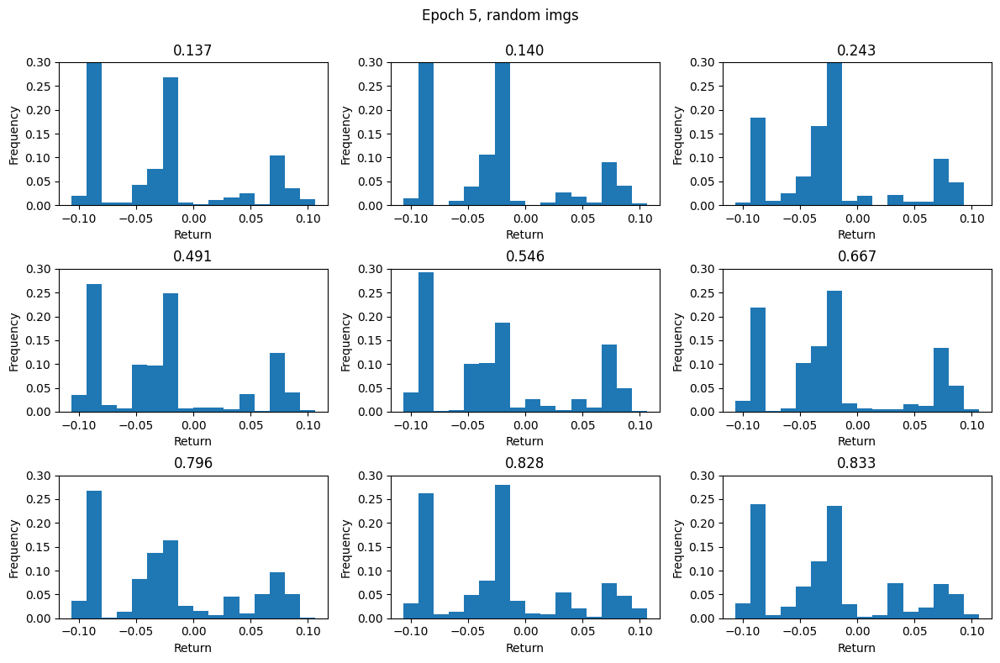

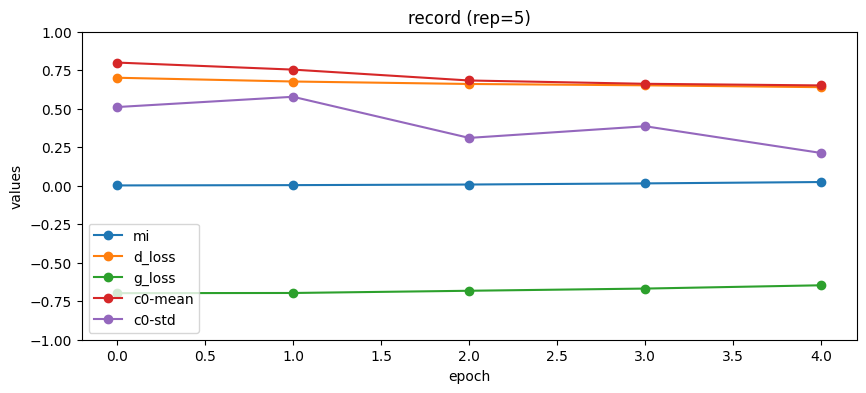

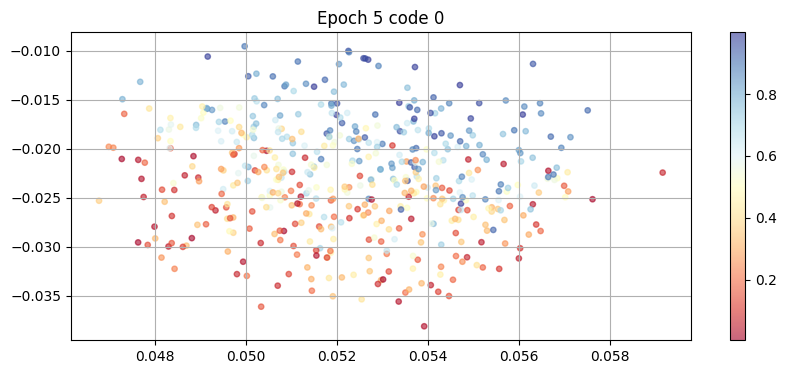

100%|██████████| 31/31 [00:41<00:00,  1.33s/it, G_loss=-.642, D_loss=0.64, MI=0.0391] 


epoch: 6, D_loss: 0.6400897368308036, G_loss: -0.6419761373150733, MI = 0.03909912657353186


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.64, D_loss=0.623, MI=0.0773] 


epoch: 7, D_loss: 0.6227688308685057, G_loss: -0.6396008287706683, MI = 0.07727605488992506


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.633, D_loss=0.615, MI=0.14] 


epoch: 8, D_loss: 0.6152161186741244, G_loss: -0.6333134904984505, MI = 0.1397020826416631


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.626, D_loss=0.612, MI=0.17] 


epoch: 9, D_loss: 0.6116213798522949, G_loss: -0.6257064380953389, MI = 0.1703580216534676


100%|██████████| 31/31 [00:41<00:00,  1.33s/it, G_loss=-.63, D_loss=0.61, MI=0.223]  


epoch: 10, D_loss: 0.6102649588738719, G_loss: -0.6299360432932454, MI = 0.2225432232502968


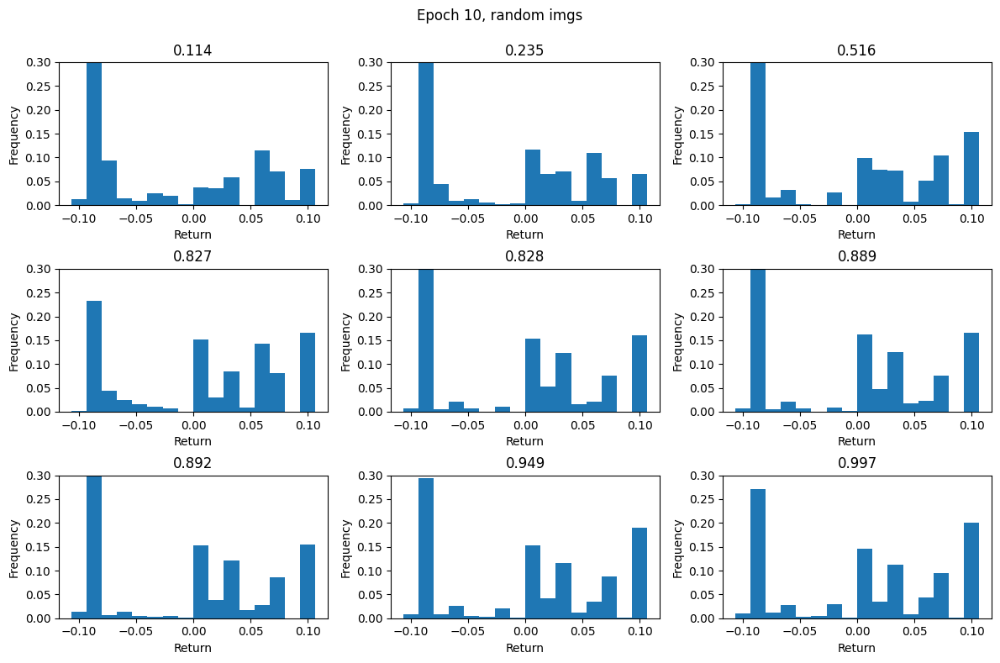

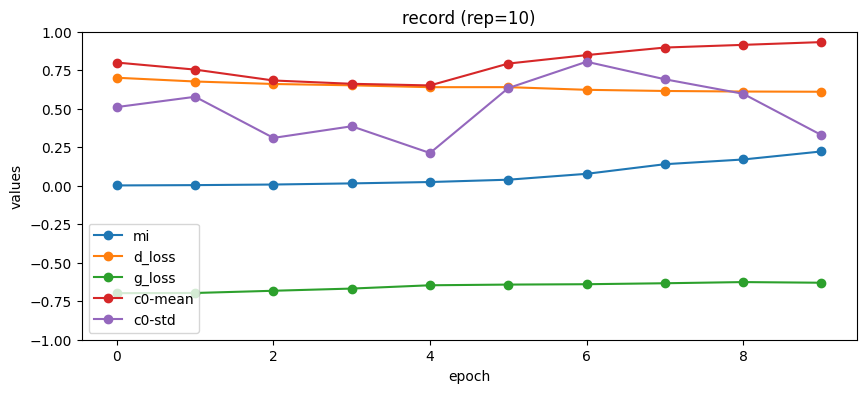

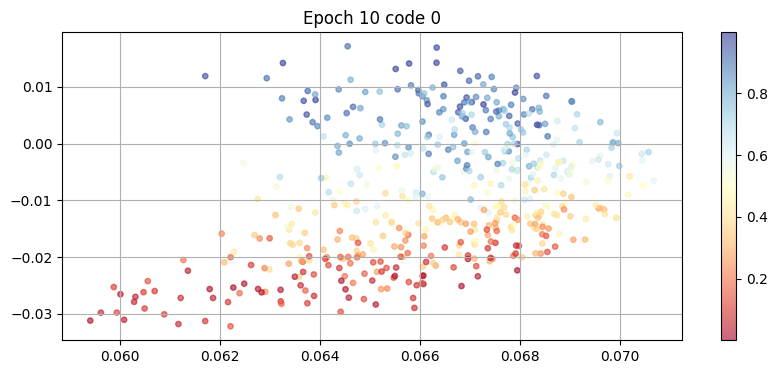

100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.625, D_loss=0.598, MI=0.281]


epoch: 11, D_loss: 0.5978668832009838, G_loss: -0.6246531336538254, MI = 0.28055251798322123


100%|██████████| 31/31 [00:41<00:00,  1.33s/it, G_loss=-.617, D_loss=0.592, MI=0.306]


epoch: 12, D_loss: 0.5919924801395785, G_loss: -0.6174675495393814, MI = 0.30596899842062303


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.617, D_loss=0.591, MI=0.315]


epoch: 13, D_loss: 0.5909901684330355, G_loss: -0.6173109873648612, MI = 0.3154124290712418


100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.613, D_loss=0.587, MI=0.396]


epoch: 14, D_loss: 0.5874600314324901, G_loss: -0.6128429655105837, MI = 0.3955147799945647


100%|██████████| 31/31 [00:41<00:00,  1.33s/it, G_loss=-.611, D_loss=0.58, MI=0.364] 


epoch: 15, D_loss: 0.5799123298737311, G_loss: -0.6110594195704306, MI = 0.3638243362788231


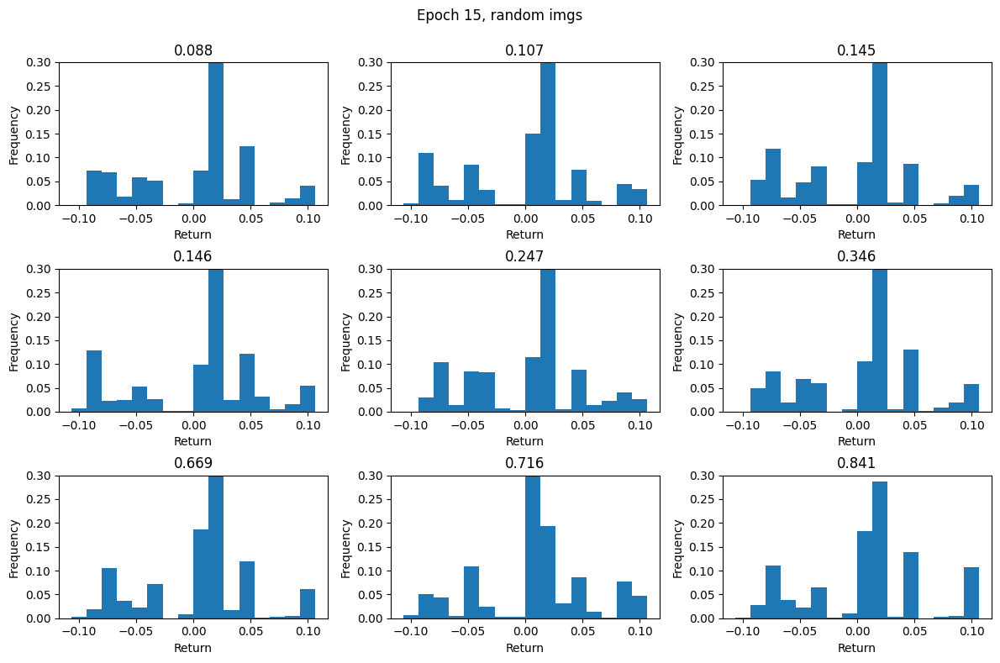

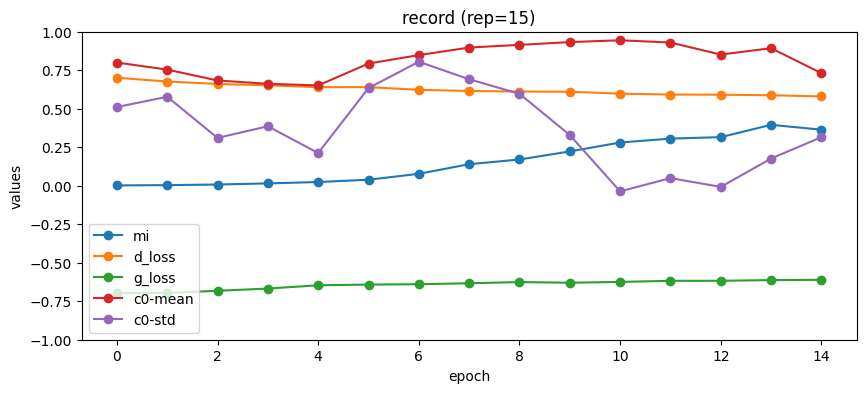

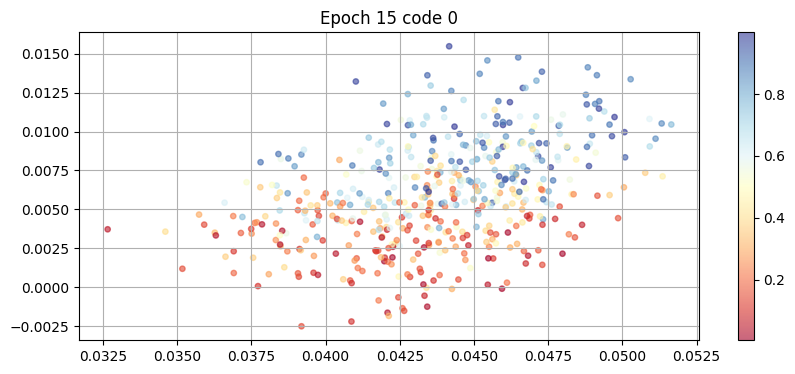

100%|██████████| 31/31 [00:41<00:00,  1.34s/it, G_loss=-.6, D_loss=0.577, MI=0.329]  


epoch: 16, D_loss: 0.5773587707550295, G_loss: -0.5998119269647906, MI = 0.3293521788812453


100%|██████████| 31/31 [00:43<00:00,  1.39s/it, G_loss=-.592, D_loss=0.564, MI=0.341]


epoch: 17, D_loss: 0.5642493078785558, G_loss: -0.591955388745954, MI = 0.3411200983870414


100%|██████████| 31/31 [00:45<00:00,  1.48s/it, G_loss=-.584, D_loss=0.552, MI=0.368]


epoch: 18, D_loss: 0.5518087648576305, G_loss: -0.5840671504697492, MI = 0.3680643275860817


100%|██████████| 31/31 [00:49<00:00,  1.59s/it, G_loss=-.593, D_loss=0.559, MI=0.526]


epoch: 19, D_loss: 0.5590219997590588, G_loss: -0.5925528214823815, MI = 0.5257804009222216


100%|██████████| 31/31 [00:52<00:00,  1.71s/it, G_loss=-.58, D_loss=0.545, MI=0.558] 


epoch: 20, D_loss: 0.545457370819584, G_loss: -0.5795384087870198, MI = 0.5583244196830257


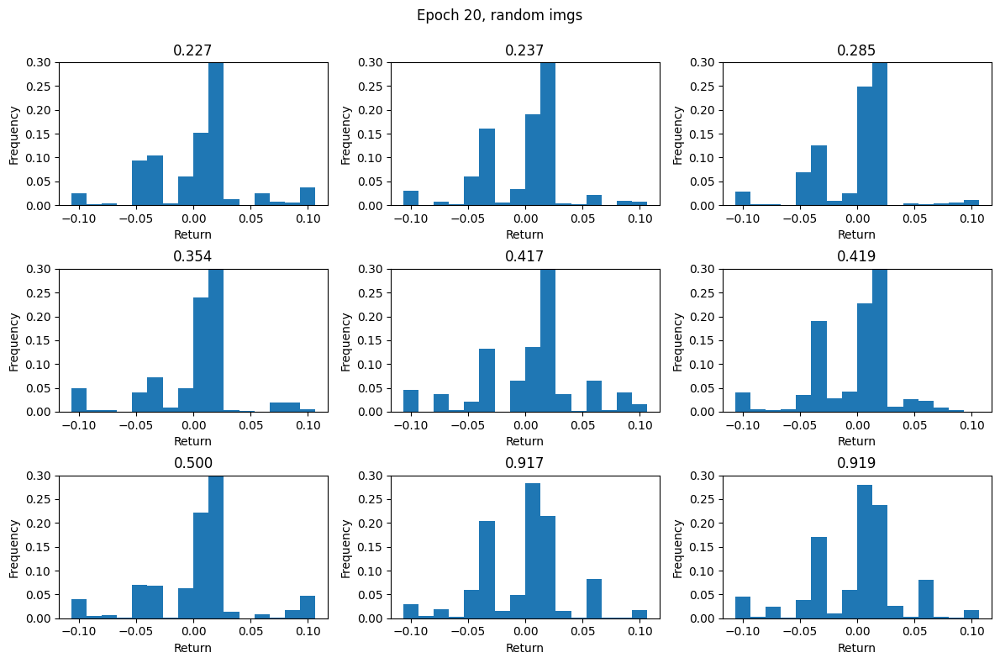

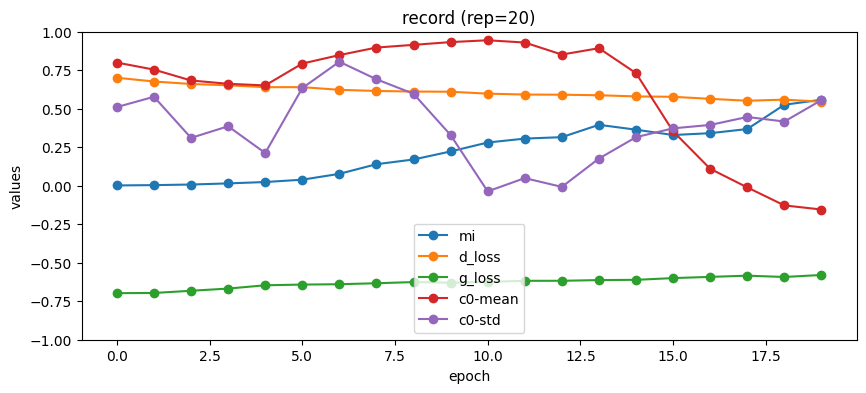

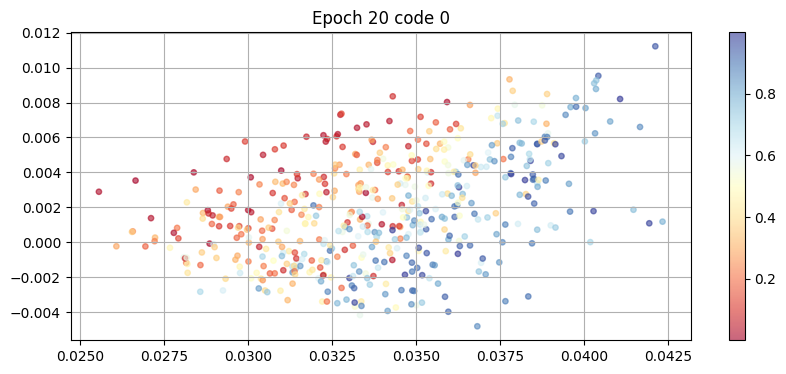

100%|██████████| 31/31 [00:56<00:00,  1.84s/it, G_loss=-.583, D_loss=0.546, MI=0.536]


epoch: 21, D_loss: 0.5459008755222443, G_loss: -0.5833275568100714, MI = 0.5362916372476085


100%|██████████| 31/31 [01:00<00:00,  1.96s/it, G_loss=-.573, D_loss=0.542, MI=0.539]


epoch: 22, D_loss: 0.54196277933736, G_loss: -0.5732557100634421, MI = 0.5389764813646194


100%|██████████| 31/31 [01:05<00:00,  2.11s/it, G_loss=-.577, D_loss=0.545, MI=0.4]  


epoch: 23, D_loss: 0.5450144265928576, G_loss: -0.5773171474856715, MI = 0.39975654718375975


100%|██████████| 31/31 [01:09<00:00,  2.25s/it, G_loss=-.558, D_loss=0.541, MI=0.398]


epoch: 24, D_loss: 0.5407798011456767, G_loss: -0.5581173916016856, MI = 0.3979234714661875


100%|██████████| 31/31 [01:10<00:00,  2.27s/it, G_loss=-.561, D_loss=0.519, MI=0.536]


epoch: 25, D_loss: 0.5185300582839597, G_loss: -0.5606074102463261, MI = 0.5364668532725303


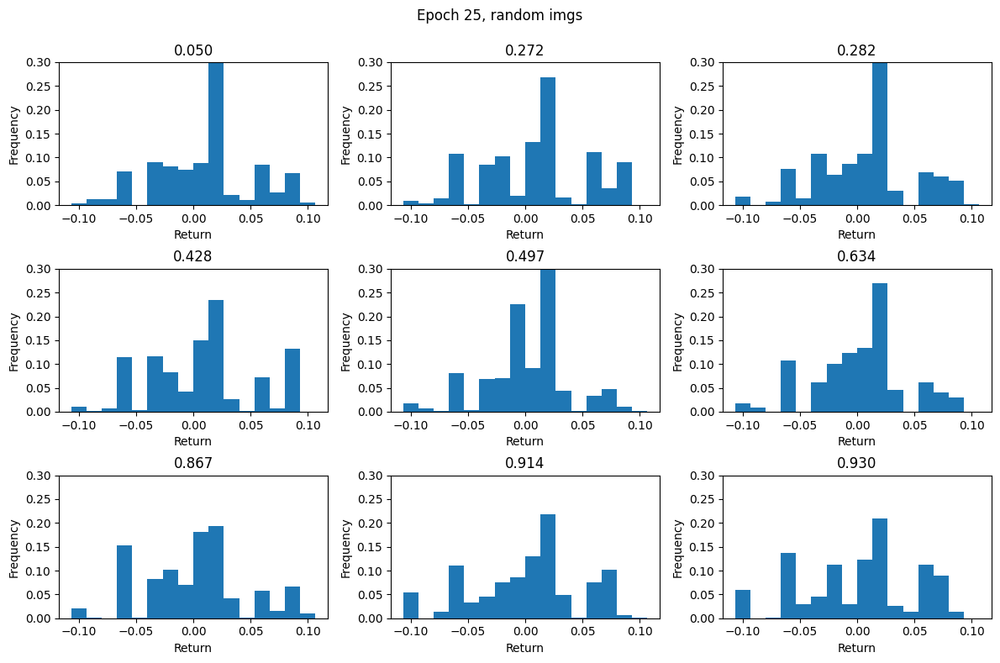

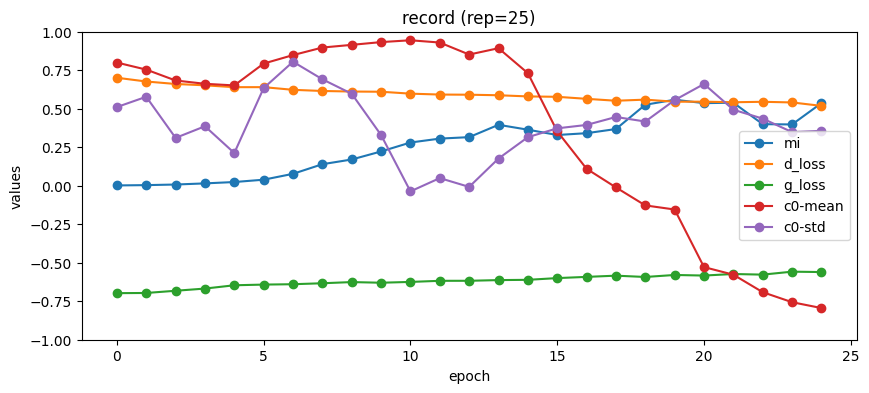

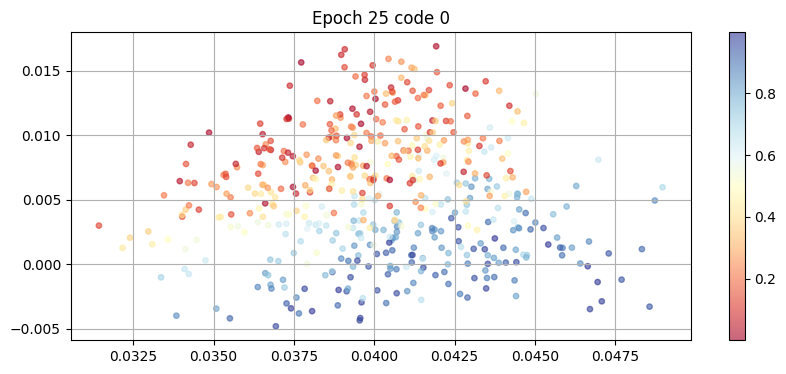

100%|██████████| 31/31 [01:07<00:00,  2.17s/it, G_loss=-.553, D_loss=0.516, MI=0.396]


epoch: 26, D_loss: 0.5162297150781078, G_loss: -0.5526095821011451, MI = 0.39602043720022323


100%|██████████| 31/31 [00:59<00:00,  1.93s/it, G_loss=-.545, D_loss=0.505, MI=0.421] 


epoch: 27, D_loss: 0.5053539026168085, G_loss: -0.5448717686437792, MI = 0.4205808069917463


100%|██████████| 31/31 [01:00<00:00,  1.96s/it, G_loss=-.535, D_loss=0.498, MI=0.416]


epoch: 28, D_loss: 0.4984931965028086, G_loss: -0.535051901494303, MI = 0.4158710587409235


100%|██████████| 31/31 [01:00<00:00,  1.95s/it, G_loss=-.522, D_loss=0.511, MI=0.492]


epoch: 29, D_loss: 0.5109083402541376, G_loss: -0.5224849504809226, MI = 0.49205287137339193


100%|██████████| 31/31 [00:59<00:00,  1.92s/it, G_loss=-.532, D_loss=0.5, MI=0.476]  


epoch: 30, D_loss: 0.4995020204974759, G_loss: -0.5316700147044274, MI = 0.4764787811906107


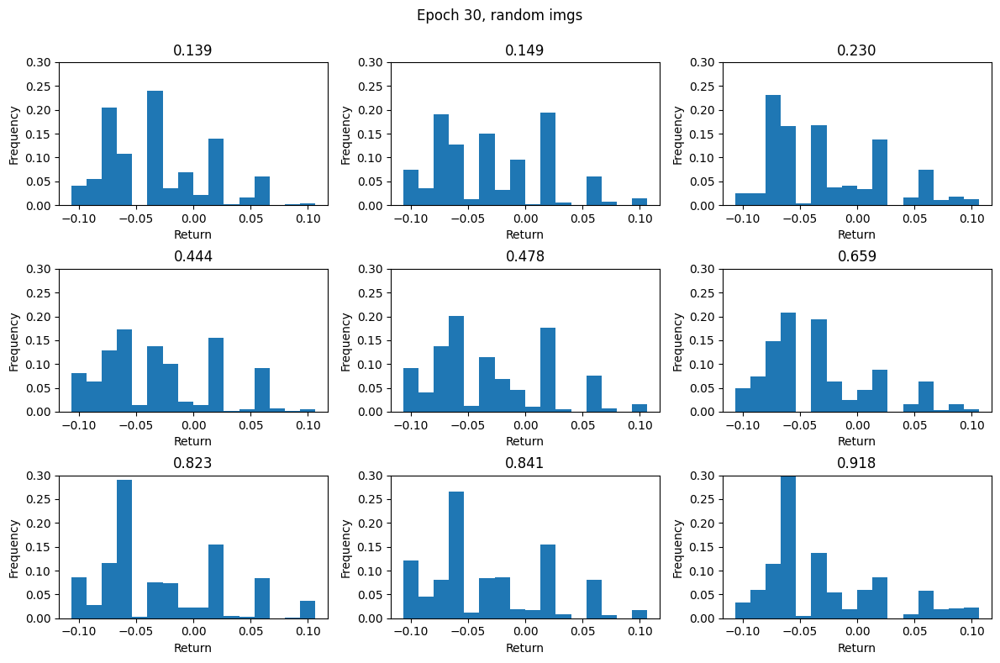

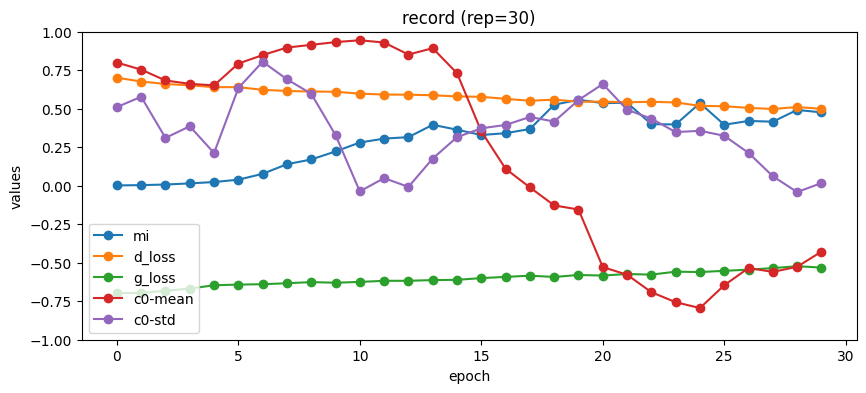

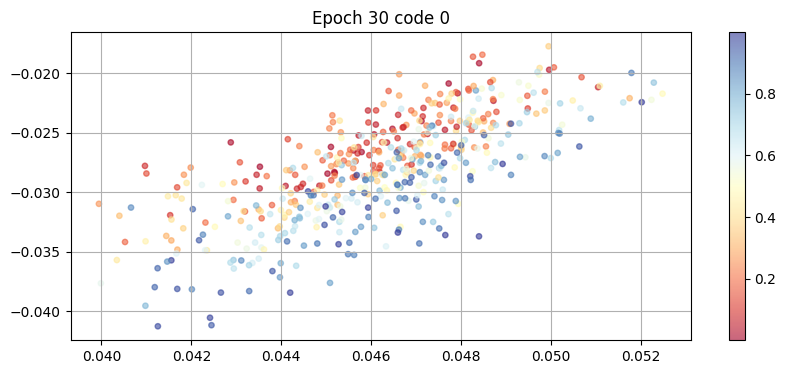

100%|██████████| 31/31 [00:57<00:00,  1.84s/it, G_loss=-.529, D_loss=0.48, MI=0.556] 


epoch: 31, D_loss: 0.4795914263494553, G_loss: -0.5289237681896456, MI = 0.5560272768620522


100%|██████████| 31/31 [00:56<00:00,  1.82s/it, G_loss=-.522, D_loss=0.489, MI=0.587]


epoch: 32, D_loss: 0.4885547439898214, G_loss: -0.522472188357384, MI = 0.5872293172344085


100%|██████████| 31/31 [00:56<00:00,  1.83s/it, G_loss=-.525, D_loss=0.473, MI=0.681]


epoch: 33, D_loss: 0.4731428421312763, G_loss: -0.524844765663147, MI = 0.6805642122222532


100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.51, D_loss=0.472, MI=0.707] 


epoch: 34, D_loss: 0.47248787745352716, G_loss: -0.50997005066564, MI = 0.7068295526889062


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.508, D_loss=0.466, MI=0.697]


epoch: 35, D_loss: 0.46646779967892554, G_loss: -0.5082719037609715, MI = 0.6971739828586578


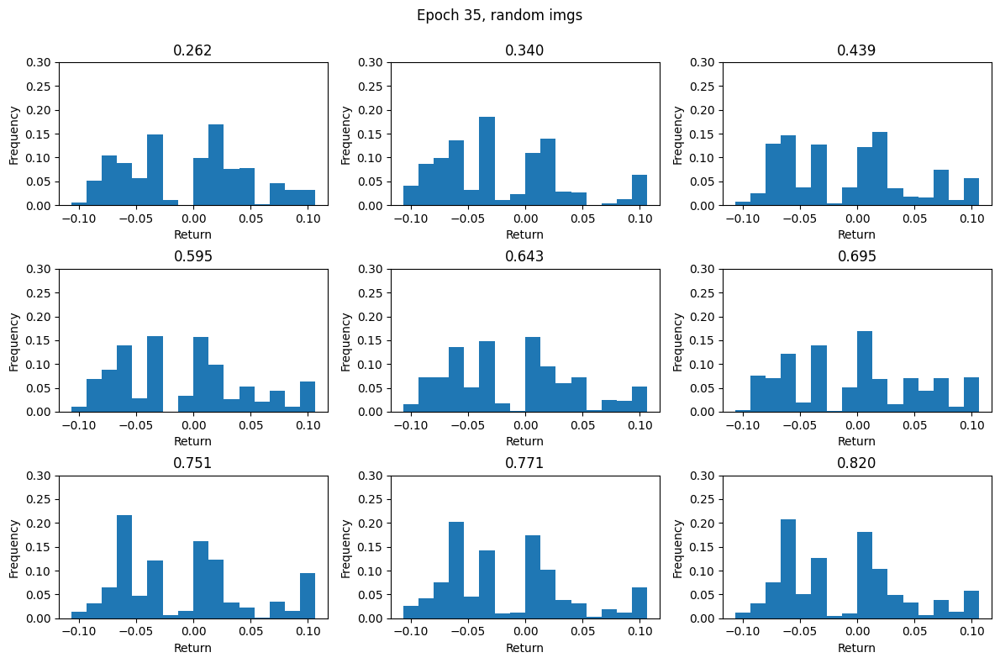

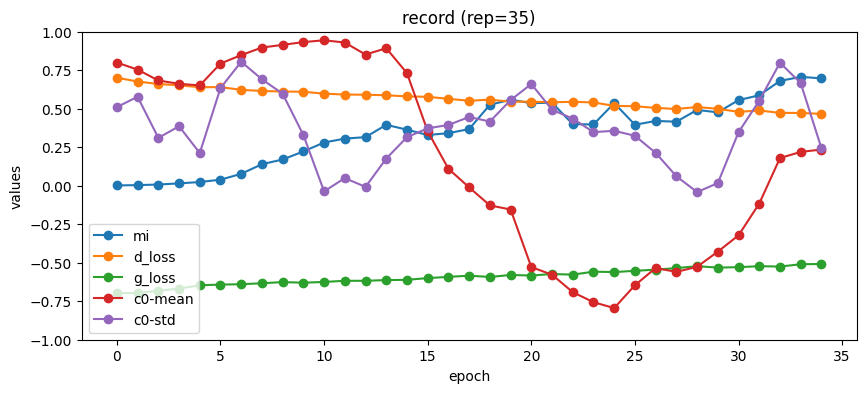

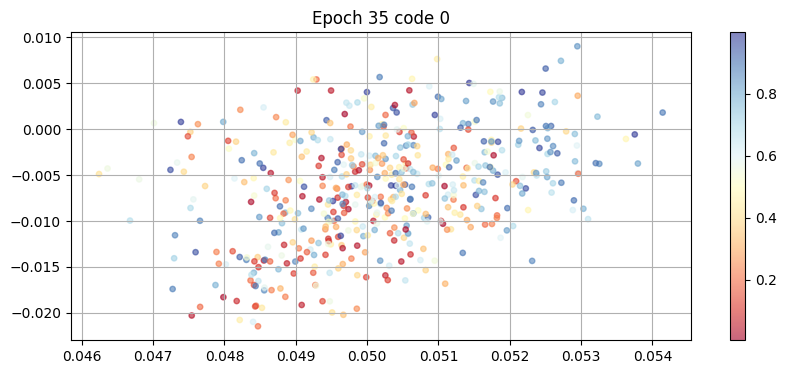

100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.507, D_loss=0.474, MI=0.727]


epoch: 36, D_loss: 0.4744807577902271, G_loss: -0.5067871501368861, MI = 0.7271495922919242


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.508, D_loss=0.455, MI=0.748]


epoch: 37, D_loss: 0.45511862827885535, G_loss: -0.5083673404109094, MI = 0.7484521885072032


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.508, D_loss=0.457, MI=0.667]


epoch: 38, D_loss: 0.45717527501044736, G_loss: -0.5081528232943627, MI = 0.6671477027477757


100%|██████████| 31/31 [00:37<00:00,  1.23s/it, G_loss=-.499, D_loss=0.457, MI=0.647]


epoch: 39, D_loss: 0.4568811183975589, G_loss: -0.4992282102184911, MI = 0.6468731780206004


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.493, D_loss=0.435, MI=0.655]


epoch: 40, D_loss: 0.43466875630040325, G_loss: -0.4931207808756059, MI = 0.6549925486887654


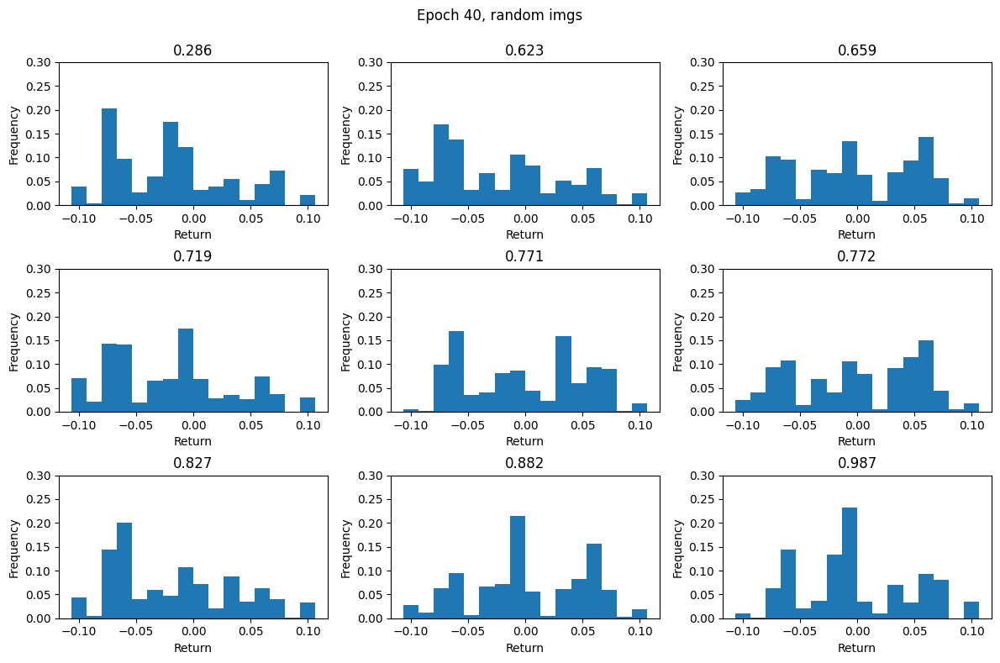

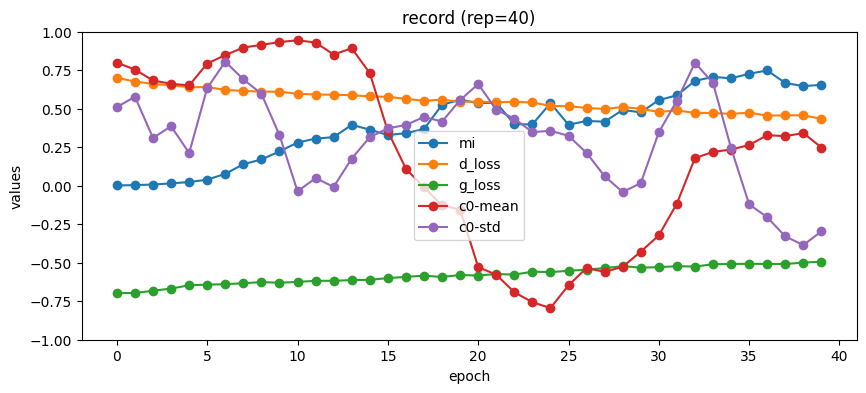

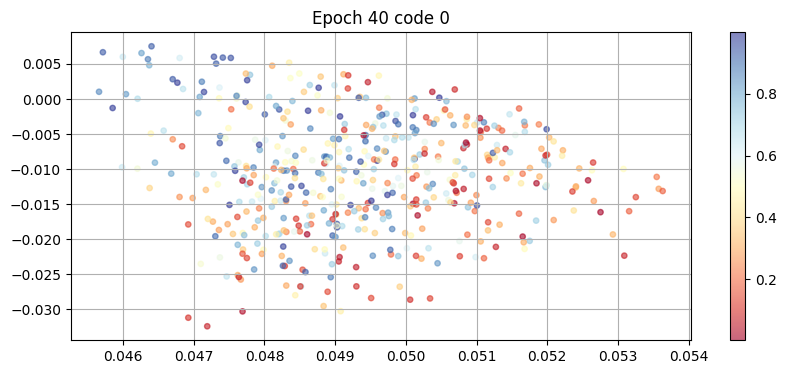

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.478, D_loss=0.445, MI=0.558]


epoch: 41, D_loss: 0.44519305133050485, G_loss: -0.47798214131785977, MI = 0.5576654235201497


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.464, D_loss=0.429, MI=0.565]


epoch: 42, D_loss: 0.42893721595887213, G_loss: -0.4644222701749494, MI = 0.5646872001309549


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.457, D_loss=0.416, MI=0.545]


epoch: 43, D_loss: 0.416235557486934, G_loss: -0.45710576157416066, MI = 0.5450284817526417


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.452, D_loss=0.434, MI=0.42] 


epoch: 44, D_loss: 0.4336549889656805, G_loss: -0.4521117498797755, MI = 0.4197791093780148


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.453, D_loss=0.421, MI=0.34] 


epoch: 45, D_loss: 0.42100767166383807, G_loss: -0.45323849205047856, MI = 0.34031136189737626


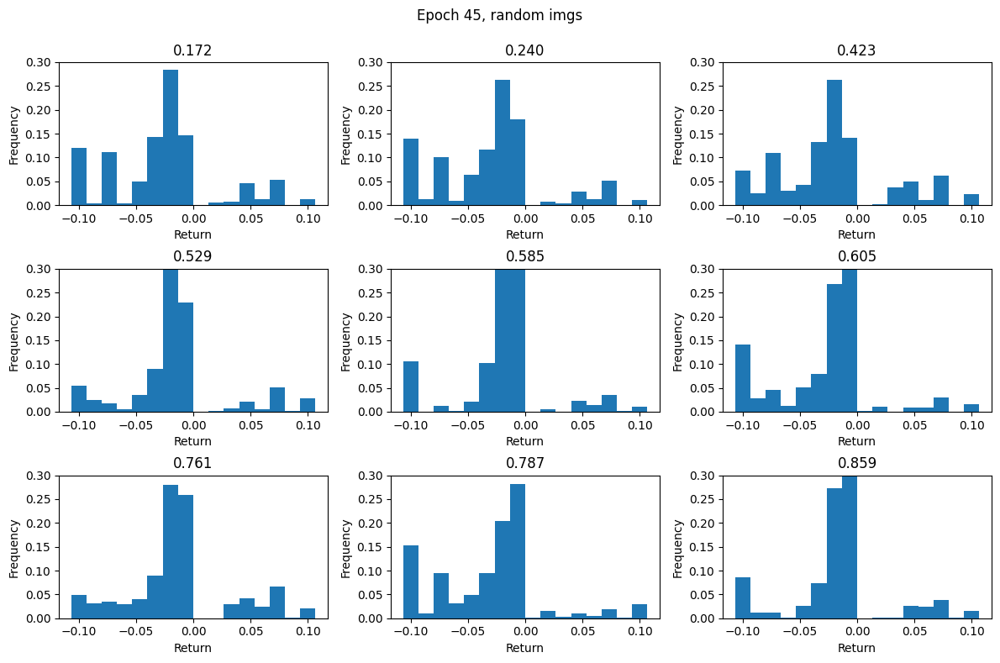

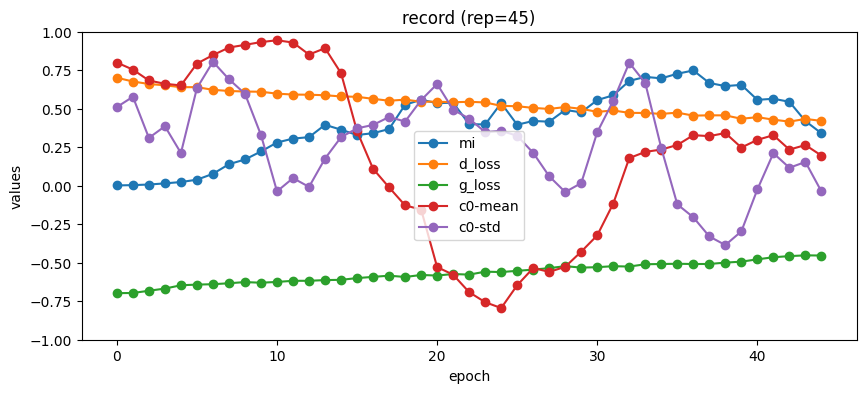

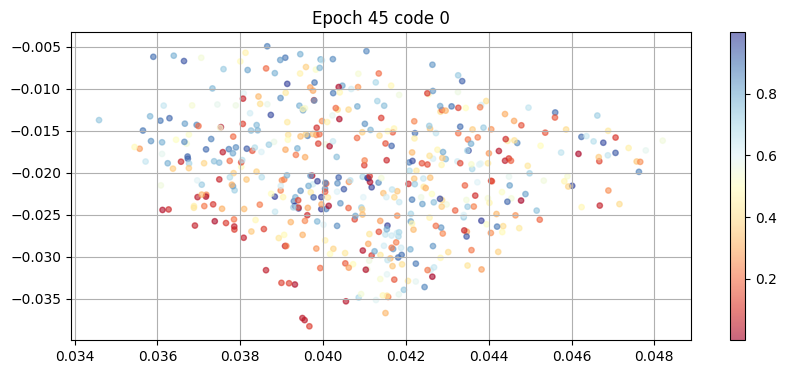

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.456, D_loss=0.421, MI=0.446]


epoch: 46, D_loss: 0.42073670894868914, G_loss: -0.4557975838261266, MI = 0.44572344999159536


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.449, D_loss=0.402, MI=0.559]


epoch: 47, D_loss: 0.4018401215153356, G_loss: -0.4489519769145596, MI = 0.5591103761426864


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.436, D_loss=0.414, MI=0.611]


epoch: 48, D_loss: 0.4138233200196297, G_loss: -0.43641993884117375, MI = 0.6108515445263155


100%|██████████| 31/31 [00:37<00:00,  1.23s/it, G_loss=-.451, D_loss=0.413, MI=0.688]


epoch: 49, D_loss: 0.4126823784843568, G_loss: -0.4508069417169017, MI = 0.6882091597203286


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.46, D_loss=0.41, MI=0.675]  


epoch: 50, D_loss: 0.41039004345094005, G_loss: -0.4595996266411197, MI = 0.6746355045226312


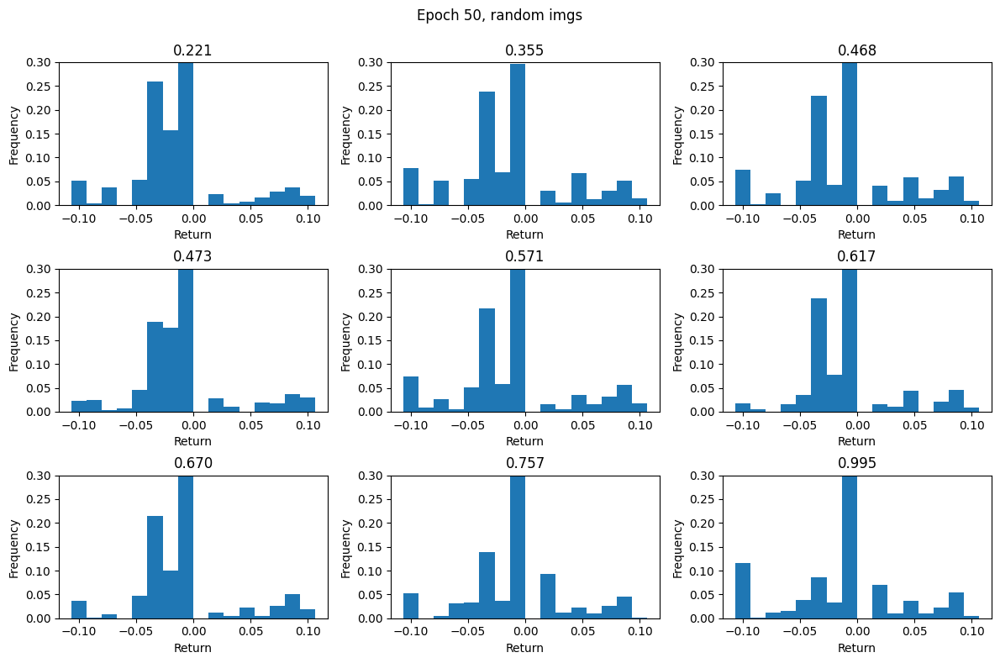

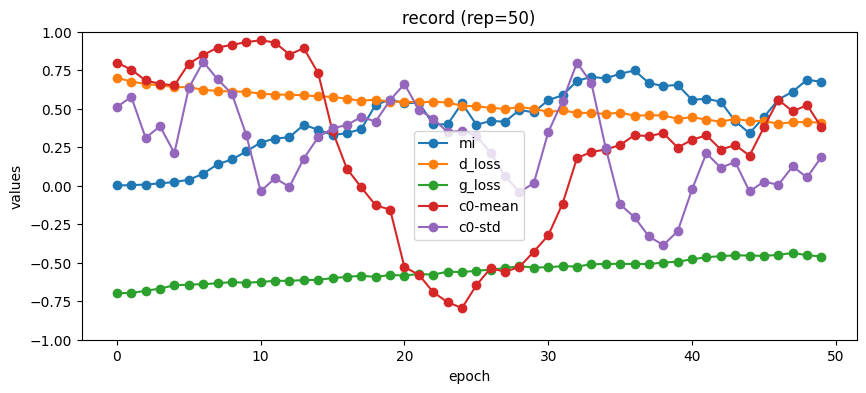

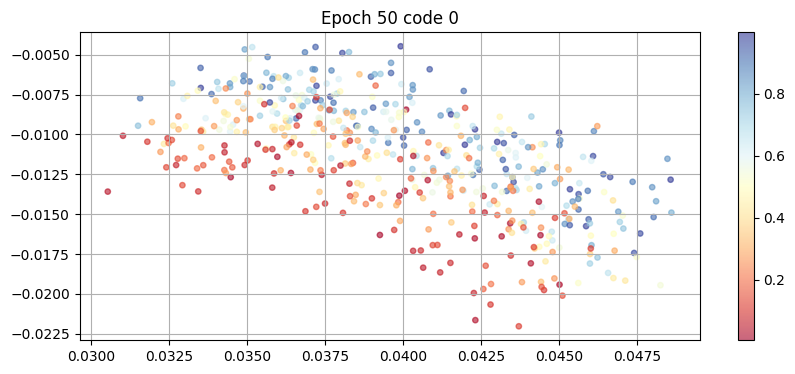

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.442, D_loss=0.389, MI=0.684]


epoch: 51, D_loss: 0.3888391938901717, G_loss: -0.4416812898651246, MI = 0.6841375467277342


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.432, D_loss=0.394, MI=0.669]


epoch: 52, D_loss: 0.3943698896515754, G_loss: -0.431547200487506, MI = 0.6686148374311386


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.425, D_loss=0.382, MI=0.738]


epoch: 53, D_loss: 0.38155973630566753, G_loss: -0.42514664511526784, MI = 0.738223813233837


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.42, D_loss=0.38, MI=0.683]  


epoch: 54, D_loss: 0.3804303349987153, G_loss: -0.41968172019527805, MI = 0.6825386083895161


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.405, D_loss=0.367, MI=0.783]


epoch: 55, D_loss: 0.3671621891760057, G_loss: -0.40543632930324924, MI = 0.7830372923804868


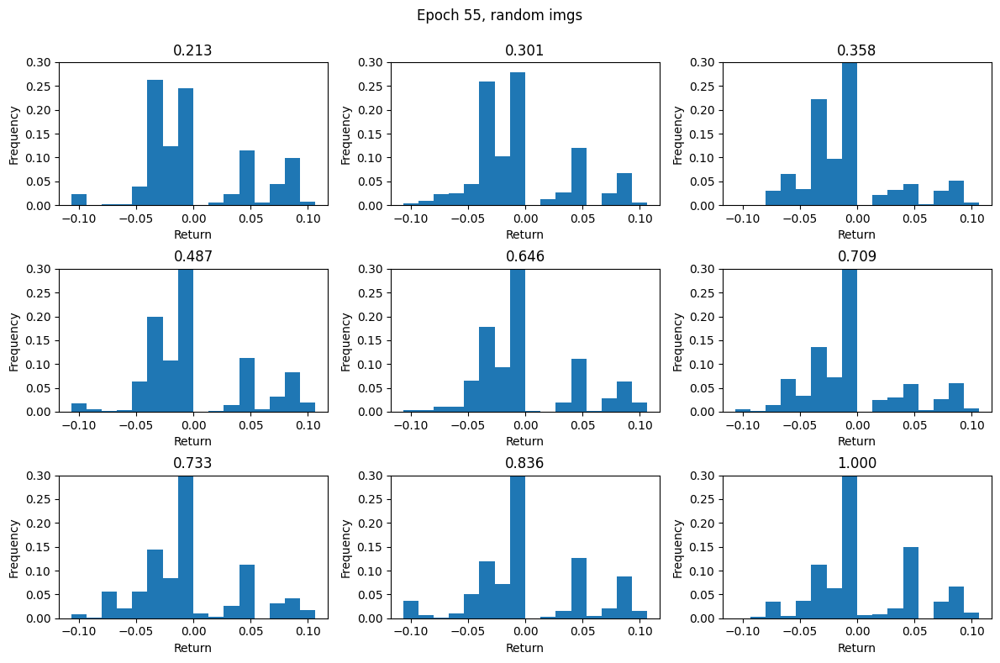

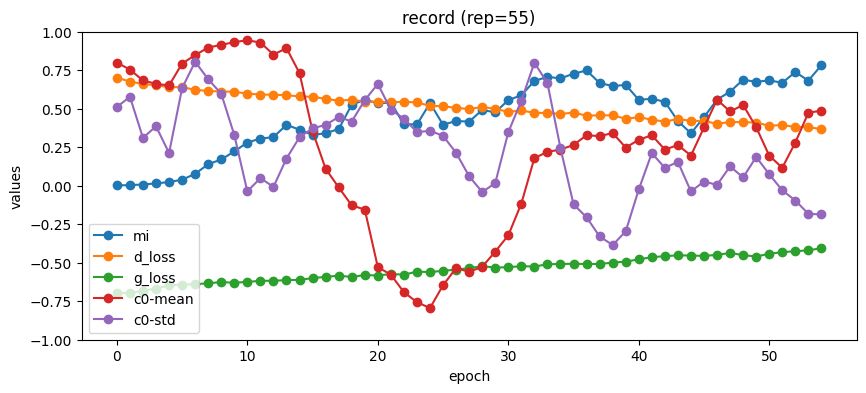

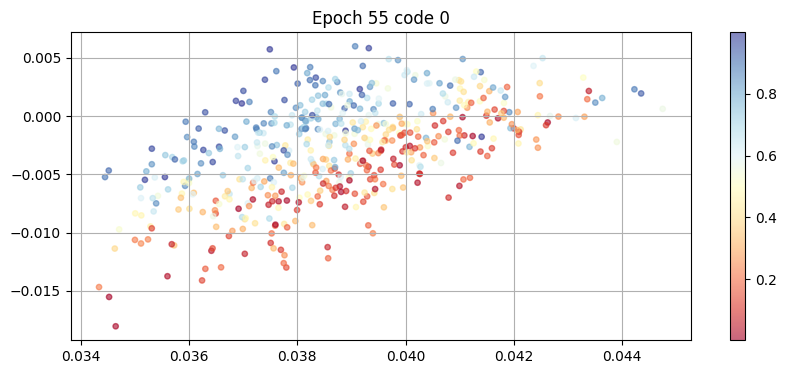

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.402, D_loss=0.386, MI=0.692]


epoch: 56, D_loss: 0.38601803395055956, G_loss: -0.40241468529547414, MI = 0.6918740570545197


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.406, D_loss=0.349, MI=0.718]


epoch: 57, D_loss: 0.3493888483893487, G_loss: -0.4058166040528205, MI = 0.7182008383735534


100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.405, D_loss=0.373, MI=0.774]


epoch: 58, D_loss: 0.3733981443989661, G_loss: -0.4050087390407439, MI = 0.7740006687179688


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.419, D_loss=0.388, MI=0.757]


epoch: 59, D_loss: 0.3876711062846645, G_loss: -0.4190364672291663, MI = 0.7567004369151208


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.45, D_loss=0.378, MI=0.698] 


epoch: 60, D_loss: 0.3779172320519724, G_loss: -0.4502501968414553, MI = 0.6979653566114364


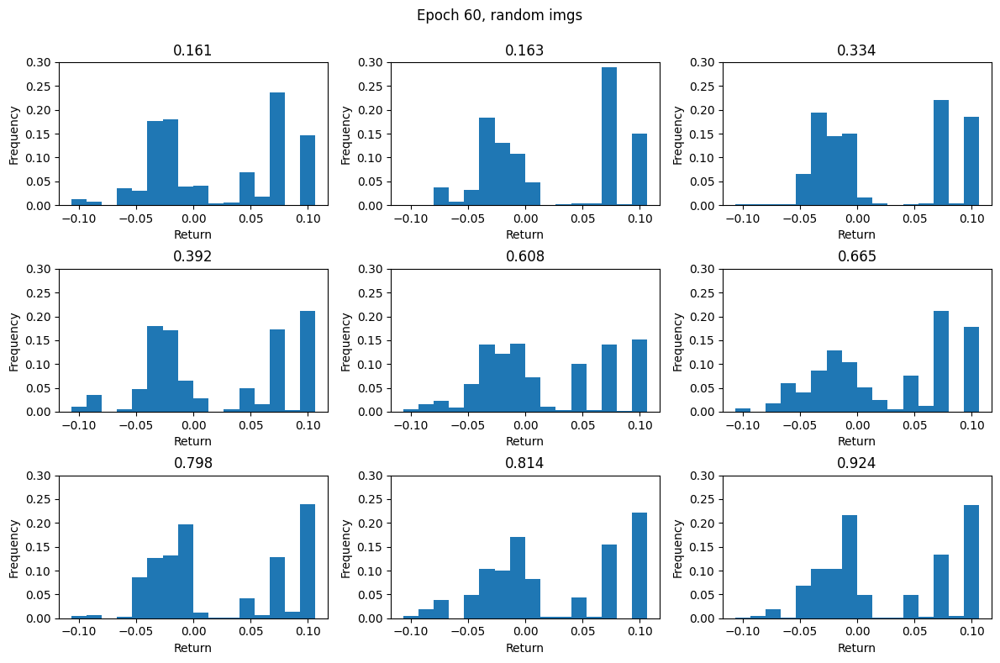

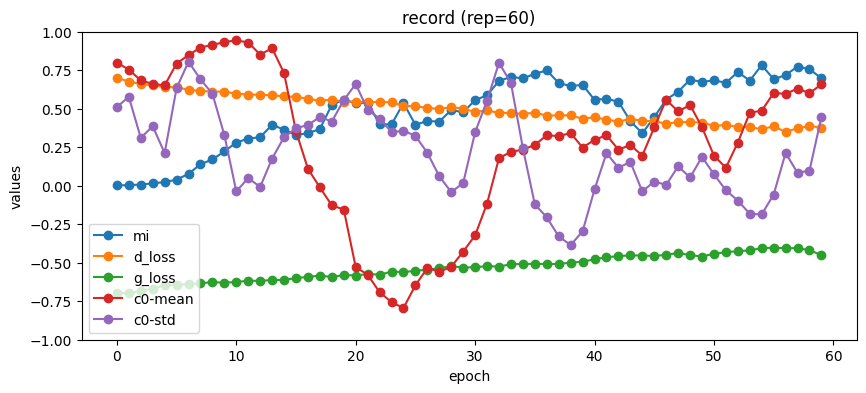

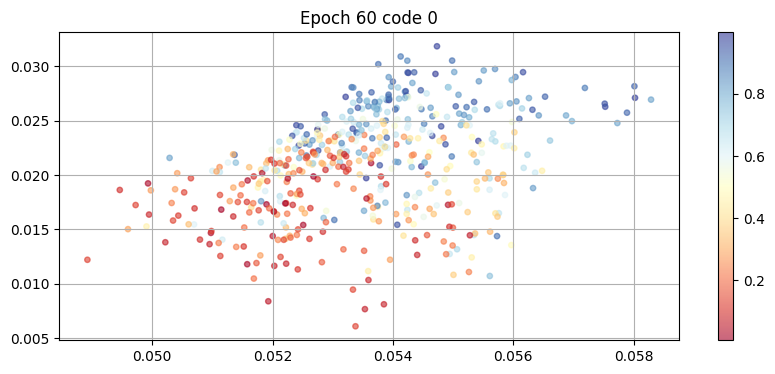

100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.411, D_loss=0.35, MI=0.728] 


epoch: 61, D_loss: 0.35031456332052907, G_loss: -0.410886243466408, MI = 0.7277505657365245


100%|██████████| 31/31 [00:37<00:00,  1.20s/it, G_loss=-.397, D_loss=0.356, MI=0.676]


epoch: 62, D_loss: 0.35647143760035116, G_loss: -0.3973148119065069, MI = 0.6757620356736644


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.389, D_loss=0.36, MI=0.787] 


epoch: 63, D_loss: 0.36000286283031585, G_loss: -0.3886125808761966, MI = 0.786811662297095


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.391, D_loss=0.341, MI=0.734]


epoch: 64, D_loss: 0.34109310180910174, G_loss: -0.39053274066217486, MI = 0.7335704661184742


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.38, D_loss=0.345, MI=0.803] 


epoch: 65, D_loss: 0.3454813063144684, G_loss: -0.37982134184529703, MI = 0.802912300632846


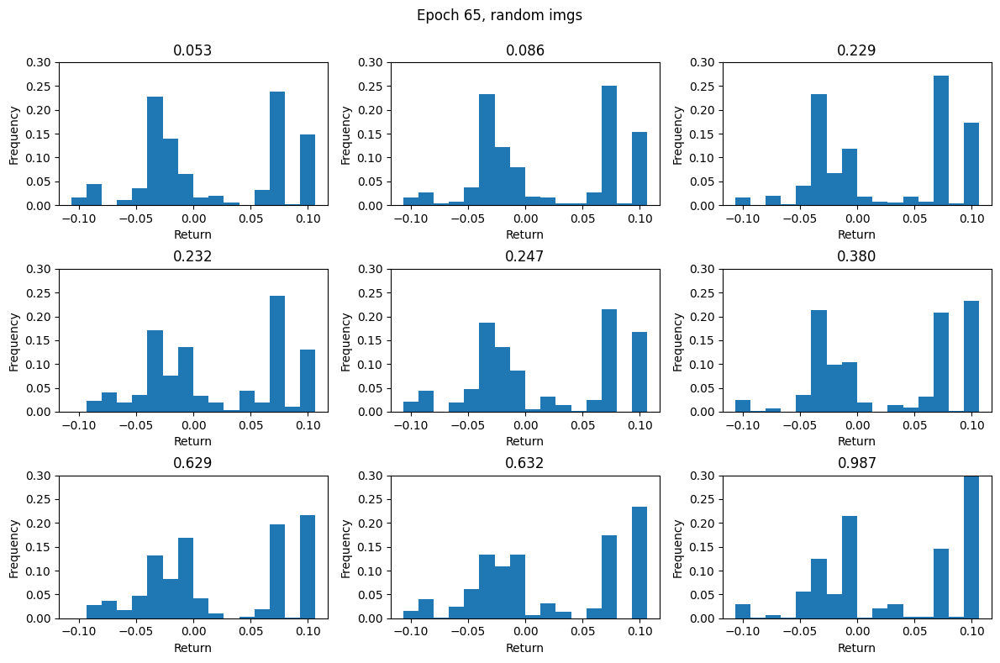

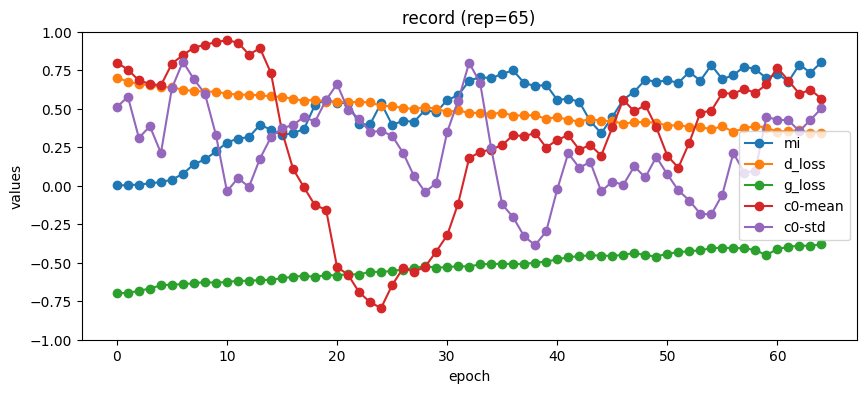

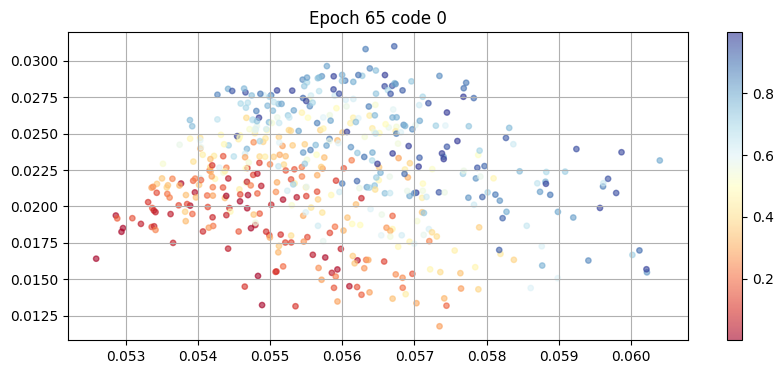

100%|██████████| 31/31 [00:37<00:00,  1.23s/it, G_loss=-.385, D_loss=0.336, MI=0.855]


epoch: 66, D_loss: 0.33588741239040126, G_loss: -0.3853733443444775, MI = 0.8549650888289174


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.379, D_loss=0.321, MI=0.836]


epoch: 67, D_loss: 0.3210655585412056, G_loss: -0.379174594917605, MI = 0.8358375237834069


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.368, D_loss=0.33, MI=0.942] 


epoch: 68, D_loss: 0.330160012168269, G_loss: -0.3684876714983294, MI = 0.941863214777362


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.377, D_loss=0.331, MI=0.855]


epoch: 69, D_loss: 0.3313091704922338, G_loss: -0.37667592398581967, MI = 0.854871021163079


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.385, D_loss=0.331, MI=0.832]


epoch: 70, D_loss: 0.33054022202568667, G_loss: -0.38487288644236906, MI = 0.8315177007067588


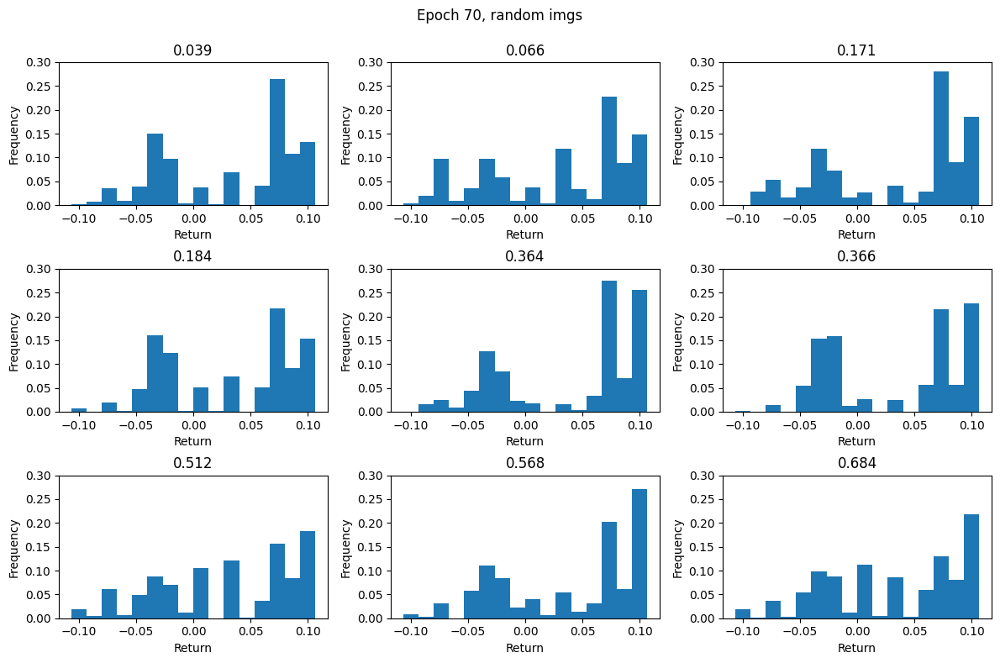

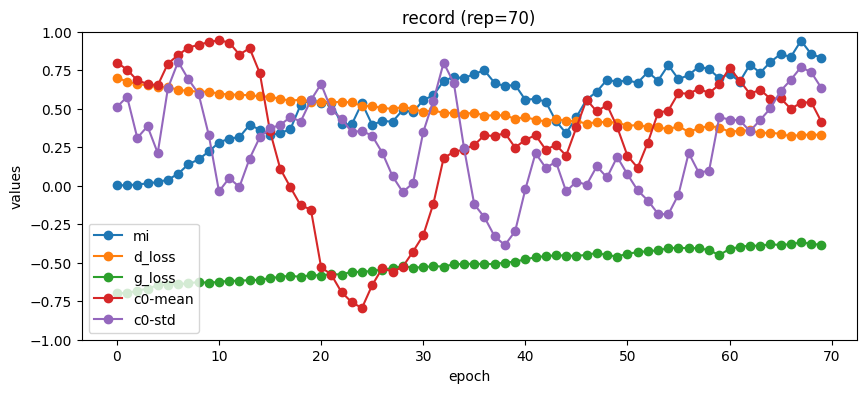

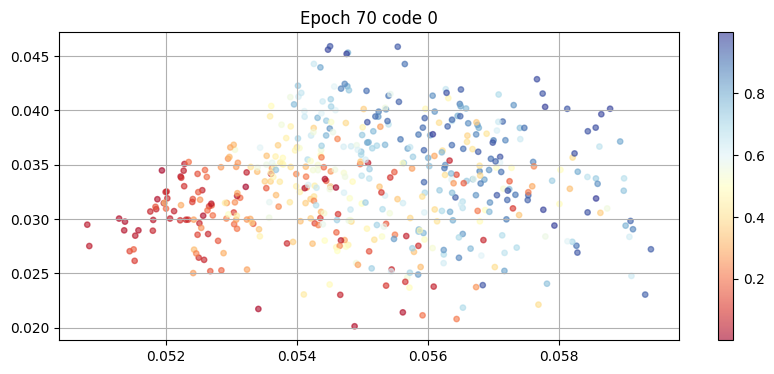

100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.372, D_loss=0.317, MI=0.869]


epoch: 71, D_loss: 0.3167751570863108, G_loss: -0.37152941092368097, MI = 0.8690447307402088


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.356, D_loss=0.327, MI=0.777]


epoch: 72, D_loss: 0.3272570486991636, G_loss: -0.3564945488206802, MI = 0.7767867465173045


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.356, D_loss=0.308, MI=0.868]


epoch: 73, D_loss: 0.3075149020841045, G_loss: -0.3564119165943515, MI = 0.8677879216209534


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.349, D_loss=0.302, MI=0.793]


epoch: 74, D_loss: 0.30197415717186465, G_loss: -0.3493549285396453, MI = 0.793286096665167


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.349, D_loss=0.322, MI=0.812]


epoch: 75, D_loss: 0.3222497740099507, G_loss: -0.34851631618315176, MI = 0.8121293292891595


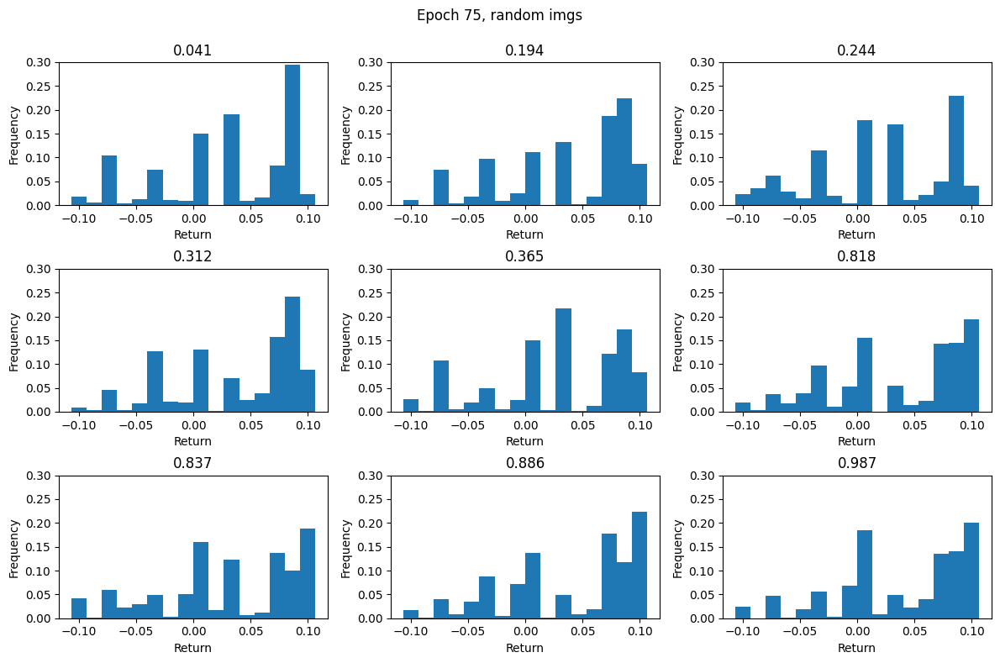

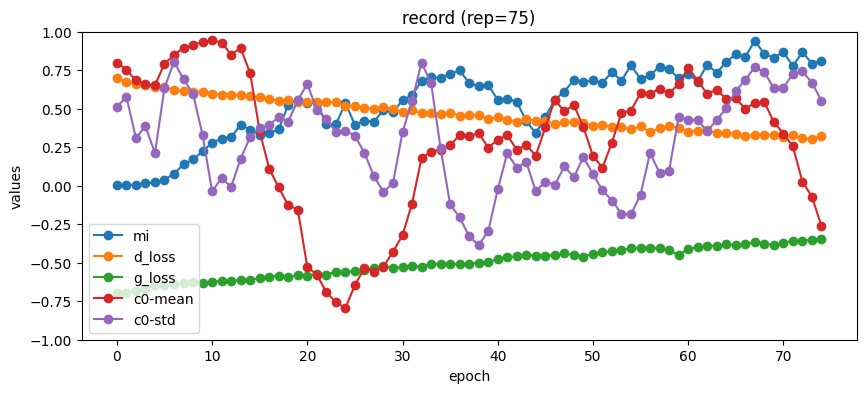

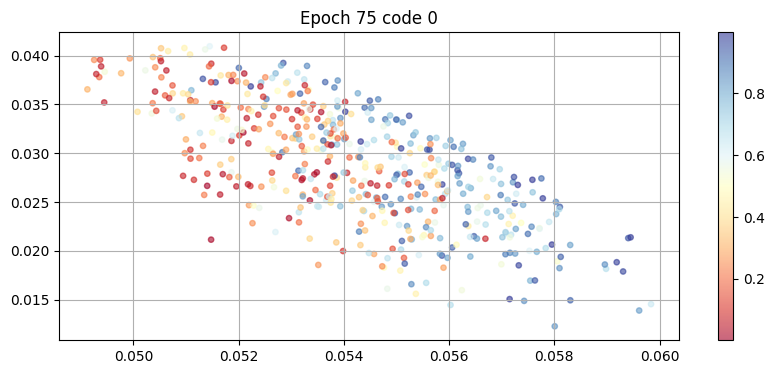

100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.367, D_loss=0.311, MI=0.796]


epoch: 76, D_loss: 0.31092882588986426, G_loss: -0.3666226065927936, MI = 0.7955690814602759


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.367, D_loss=0.31, MI=0.918] 


epoch: 77, D_loss: 0.31021928787231445, G_loss: -0.36742119154622477, MI = 0.9175634807155978


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.367, D_loss=0.31, MI=0.826] 


epoch: 78, D_loss: 0.3098686606653275, G_loss: -0.3669854210269067, MI = 0.826347230903564


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.361, D_loss=0.308, MI=0.923]


epoch: 79, D_loss: 0.3079395265348496, G_loss: -0.3614042603200482, MI = 0.9234006433717666


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.352, D_loss=0.294, MI=0.935]


epoch: 80, D_loss: 0.29386502023666133, G_loss: -0.3516706612802321, MI = 0.9345222423153539


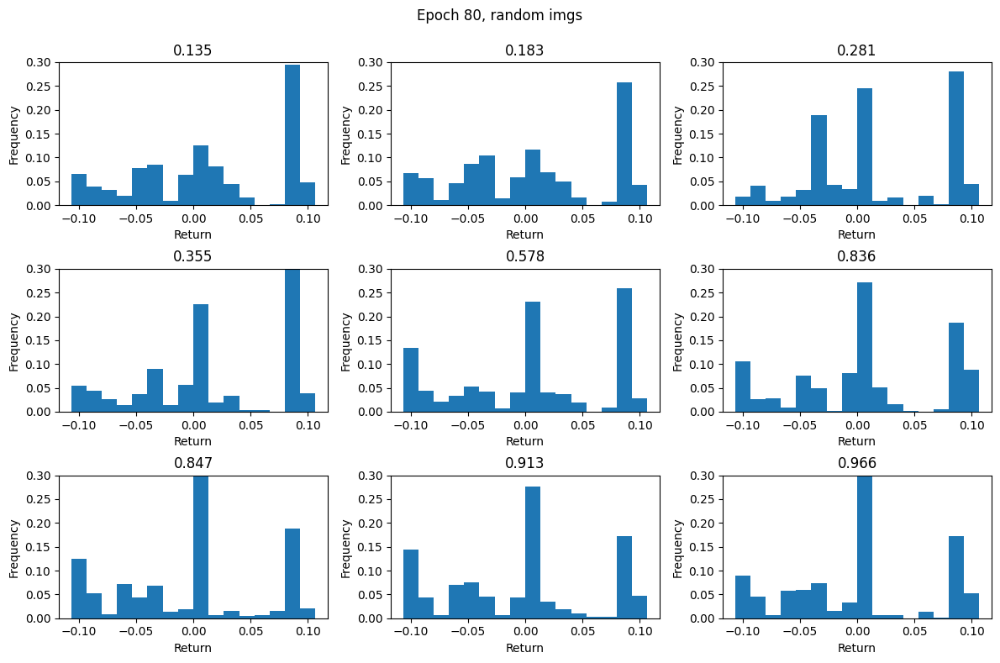

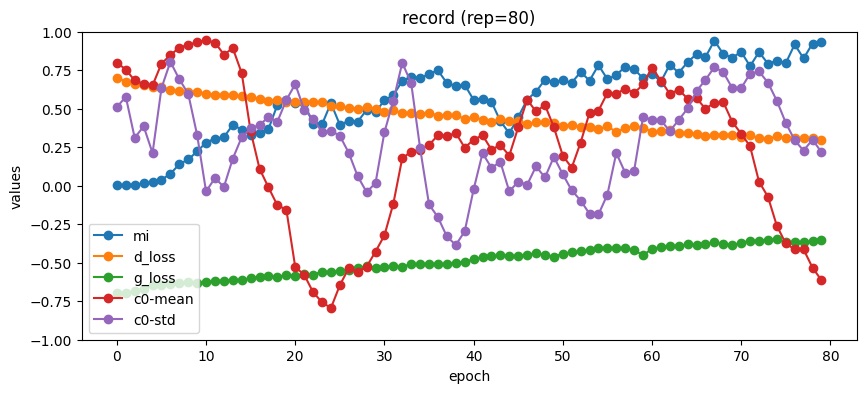

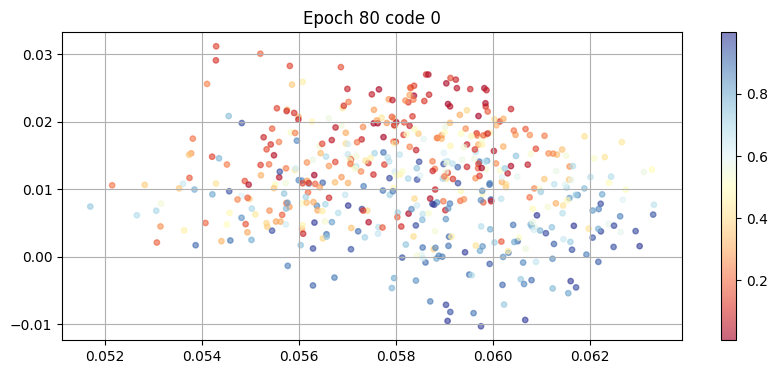

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.343, D_loss=0.325, MI=0.801]


epoch: 81, D_loss: 0.3248500713417607, G_loss: -0.3429455651390937, MI = 0.8010572425780758


100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.356, D_loss=0.294, MI=1.04]


epoch: 82, D_loss: 0.29426131277315076, G_loss: -0.35596086709730085, MI = 1.0350875835264883


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.349, D_loss=0.3, MI=0.98]   


epoch: 83, D_loss: 0.30042949222749277, G_loss: -0.3492034250690091, MI = 0.9795919445253187


100%|██████████| 31/31 [00:39<00:00,  1.26s/it, G_loss=-.341, D_loss=0.289, MI=0.961]


epoch: 84, D_loss: 0.28911118641976385, G_loss: -0.34120093814788327, MI = 0.9611129280059568


100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.345, D_loss=0.297, MI=1.02]


epoch: 85, D_loss: 0.2974708609042629, G_loss: -0.3451655747429017, MI = 1.0213092969309898


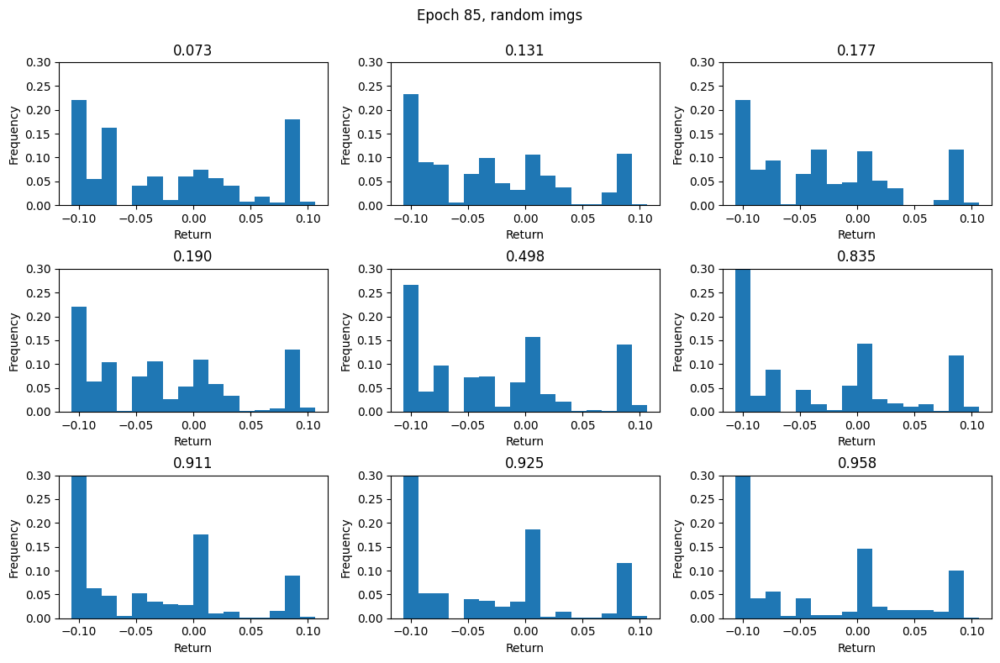

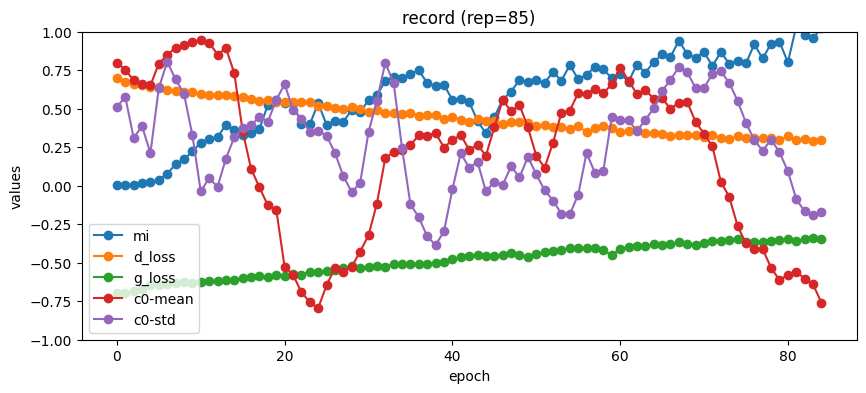

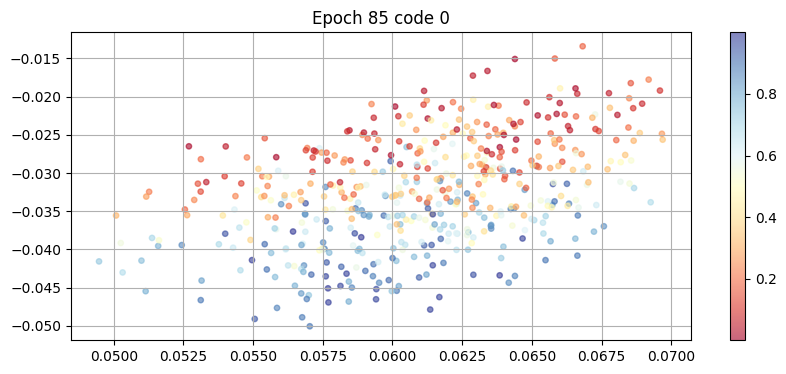

100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.342, D_loss=0.273, MI=1.01] 


epoch: 86, D_loss: 0.27349029769820554, G_loss: -0.34249449545337307, MI = 1.0102144566274458


100%|██████████| 31/31 [00:39<00:00,  1.26s/it, G_loss=-.331, D_loss=0.284, MI=1.09]


epoch: 87, D_loss: 0.2839001210466508, G_loss: -0.3312254836482386, MI = 1.0904008861510985


100%|██████████| 31/31 [00:39<00:00,  1.26s/it, G_loss=-.33, D_loss=0.278, MI=1.05]  


epoch: 88, D_loss: 0.27807907664006754, G_loss: -0.33035219965442536, MI = 1.0495375183320814


100%|██████████| 31/31 [00:39<00:00,  1.27s/it, G_loss=-.343, D_loss=0.276, MI=0.973]


epoch: 89, D_loss: 0.2756020345034138, G_loss: -0.3426122184722654, MI = 0.9734249095762929


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.321, D_loss=0.277, MI=0.894]


epoch: 90, D_loss: 0.27664799267245876, G_loss: -0.3205409636420588, MI = 0.8943301420057973


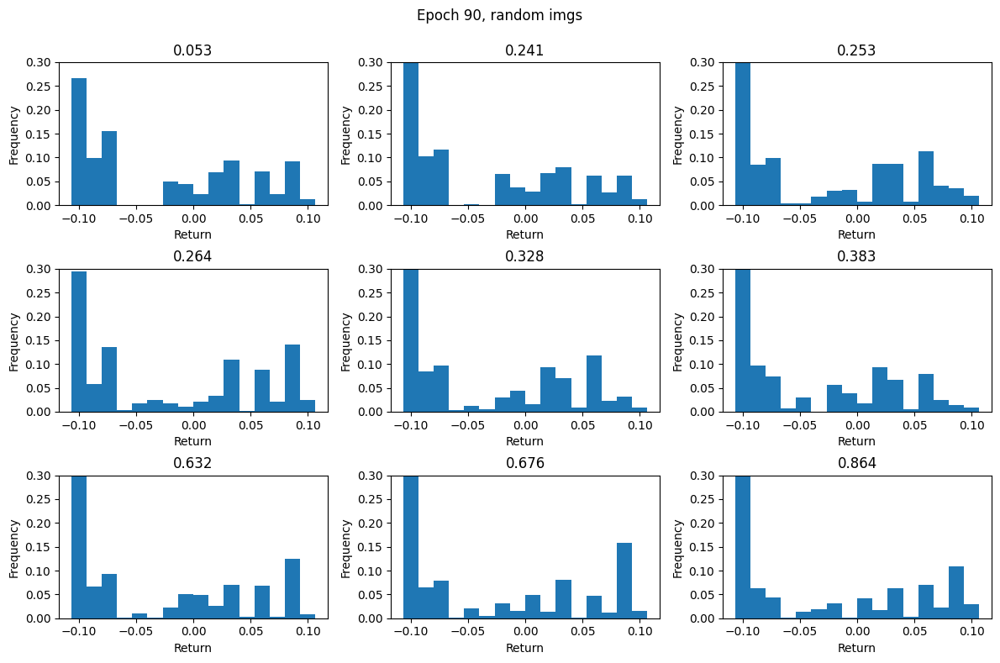

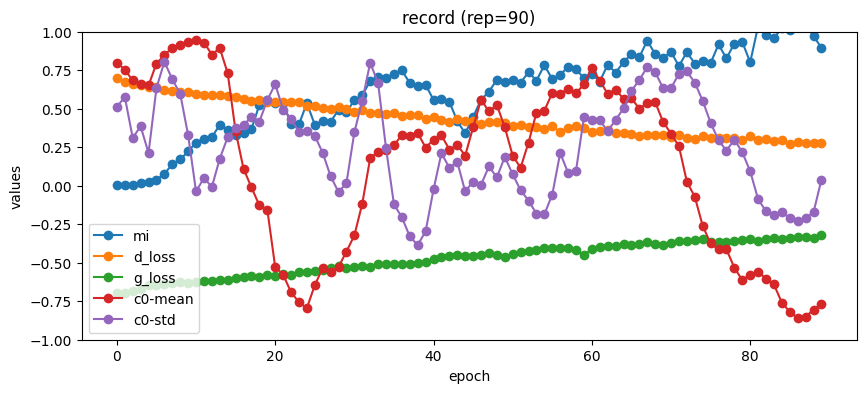

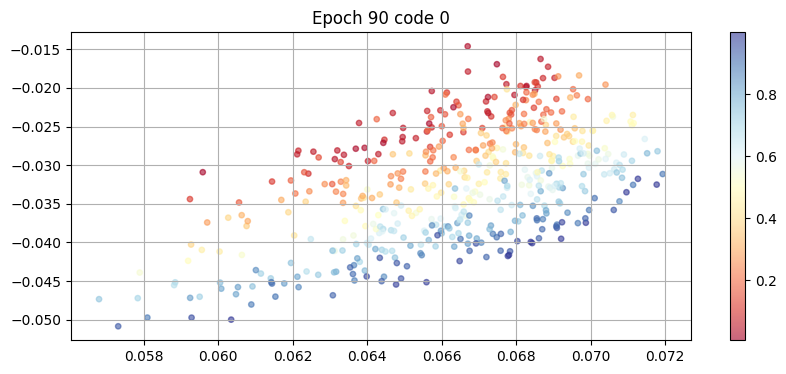

100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.315, D_loss=0.288, MI=0.88] 


epoch: 91, D_loss: 0.2880941268897826, G_loss: -0.3152465801085195, MI = 0.8797924826222081


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.31, D_loss=0.276, MI=0.866] 


epoch: 92, D_loss: 0.27594608116534447, G_loss: -0.3096720566672663, MI = 0.865923483525553


100%|██████████| 31/31 [00:38<00:00,  1.25s/it, G_loss=-.314, D_loss=0.254, MI=0.945]


epoch: 93, D_loss: 0.2539232959670405, G_loss: -0.31359334434232405, MI = 0.9449542337848295


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.31, D_loss=0.268, MI=0.96]  


epoch: 94, D_loss: 0.26786952778216333, G_loss: -0.3104673037605901, MI = 0.9599505662918091


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.308, D_loss=0.264, MI=1.02]


epoch: 95, D_loss: 0.2644121834347325, G_loss: -0.30800265025707985, MI = 1.0196868902252567


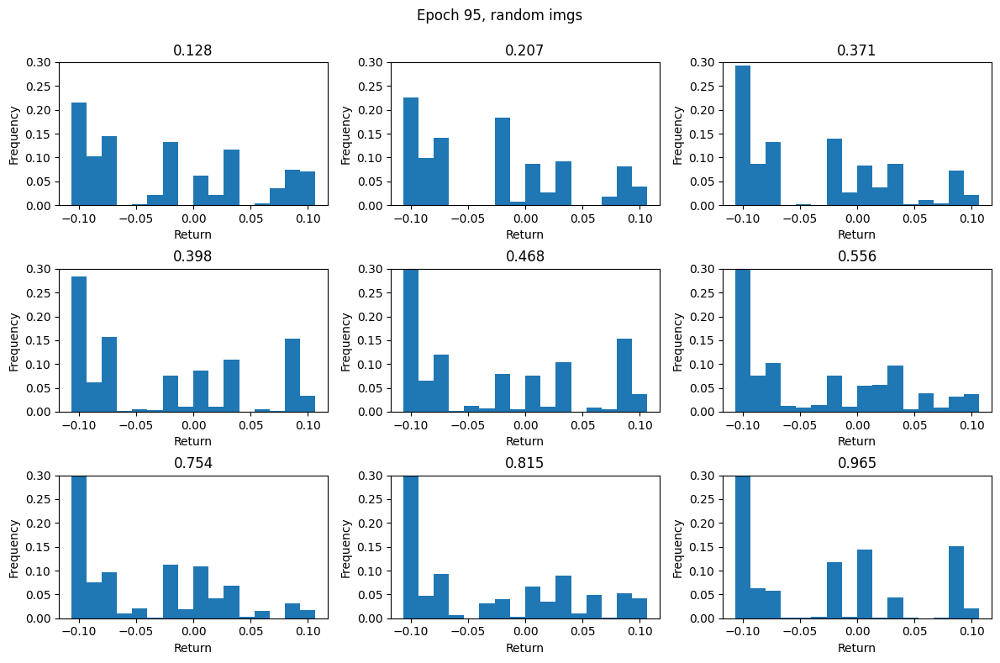

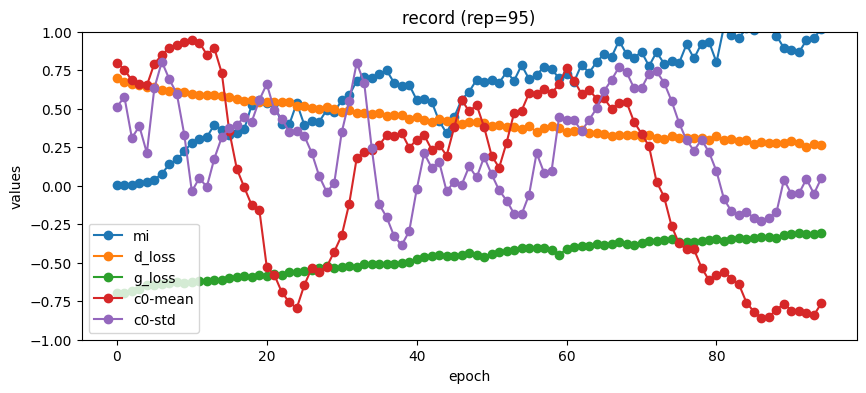

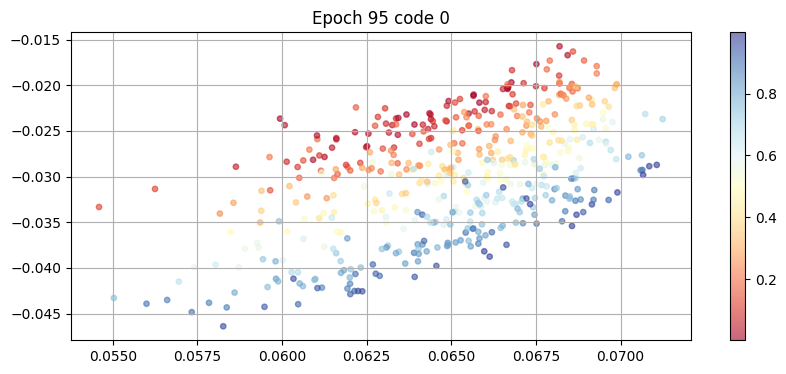

100%|██████████| 31/31 [00:38<00:00,  1.26s/it, G_loss=-.31, D_loss=0.266, MI=1.02]  


epoch: 96, D_loss: 0.2661533269190019, G_loss: -0.3102782589773978, MI = 1.0246529617617208


100%|██████████| 31/31 [00:38<00:00,  1.23s/it, G_loss=-.316, D_loss=0.257, MI=0.981]


epoch: 97, D_loss: 0.25704099093714067, G_loss: -0.31578703176590706, MI = 0.9807331033291355


100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.312, D_loss=0.256, MI=0.952]


epoch: 98, D_loss: 0.2555580456410685, G_loss: -0.31200002758733686, MI = 0.952082444583216


100%|██████████| 31/31 [00:39<00:00,  1.28s/it, G_loss=-.301, D_loss=0.243, MI=0.976]


epoch: 99, D_loss: 0.24281775182293308, G_loss: -0.3013211546405669, MI = 0.9756978846365406


100%|██████████| 31/31 [00:40<00:00,  1.30s/it, G_loss=-.299, D_loss=0.252, MI=1.02]


epoch: 100, D_loss: 0.25244086836614915, G_loss: -0.2991242427979746, MI = 1.0219291986957673


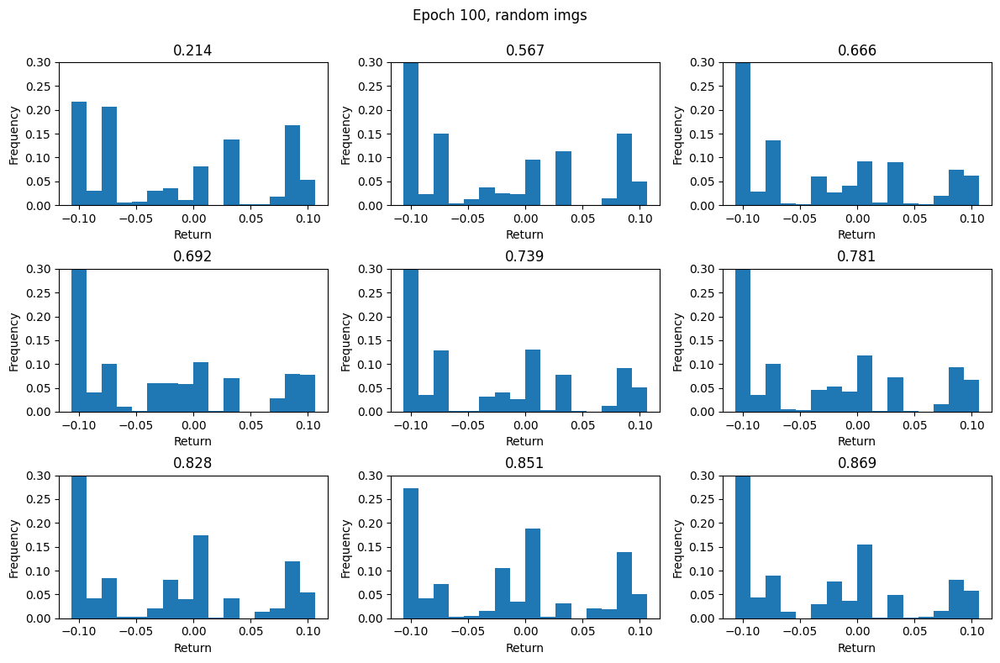

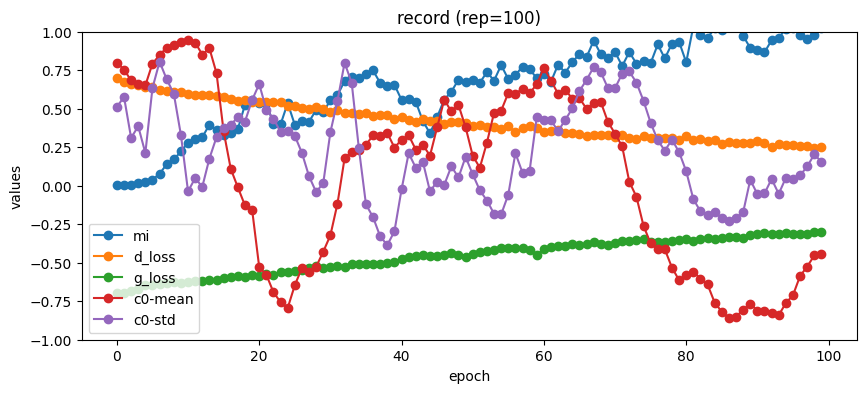

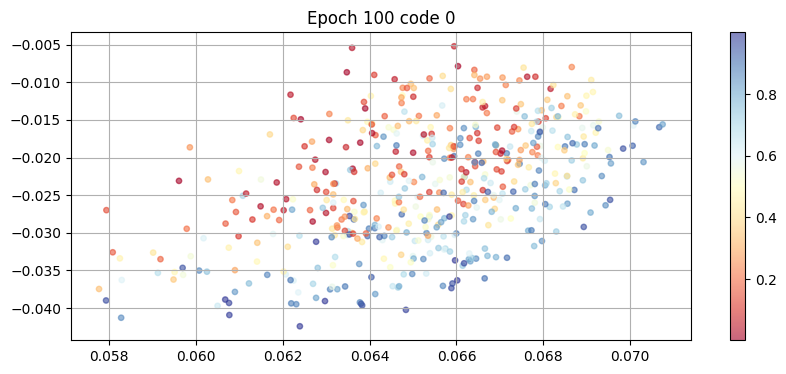

100%|██████████| 31/31 [00:37<00:00,  1.20s/it, G_loss=-.298, D_loss=0.231, MI=0.95] 


epoch: 101, D_loss: 0.2313881444354211, G_loss: -0.29769867562478586, MI = 0.9498457831721152


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.286, D_loss=0.233, MI=1.03] 


epoch: 102, D_loss: 0.2332427203655243, G_loss: -0.28605080323834575, MI = 1.0264925245315797


100%|██████████| 31/31 [00:37<00:00,  1.21s/it, G_loss=-.3, D_loss=0.232, MI=0.864]  


epoch: 103, D_loss: 0.2315509093384589, G_loss: -0.30042901442896935, MI = 0.8641792901100651


100%|██████████| 31/31 [00:37<00:00,  1.22s/it, G_loss=-.318, D_loss=0.267, MI=0.867]


epoch: 104, D_loss: 0.2672630048567249, G_loss: -0.3177624950485845, MI = 0.866566160032826


100%|██████████| 31/31 [00:37<00:00,  1.20s/it, G_loss=-.33, D_loss=0.265, MI=0.796] 


epoch: 105, D_loss: 0.264503296344511, G_loss: -0.32965879671035275, MI = 0.795937922693068


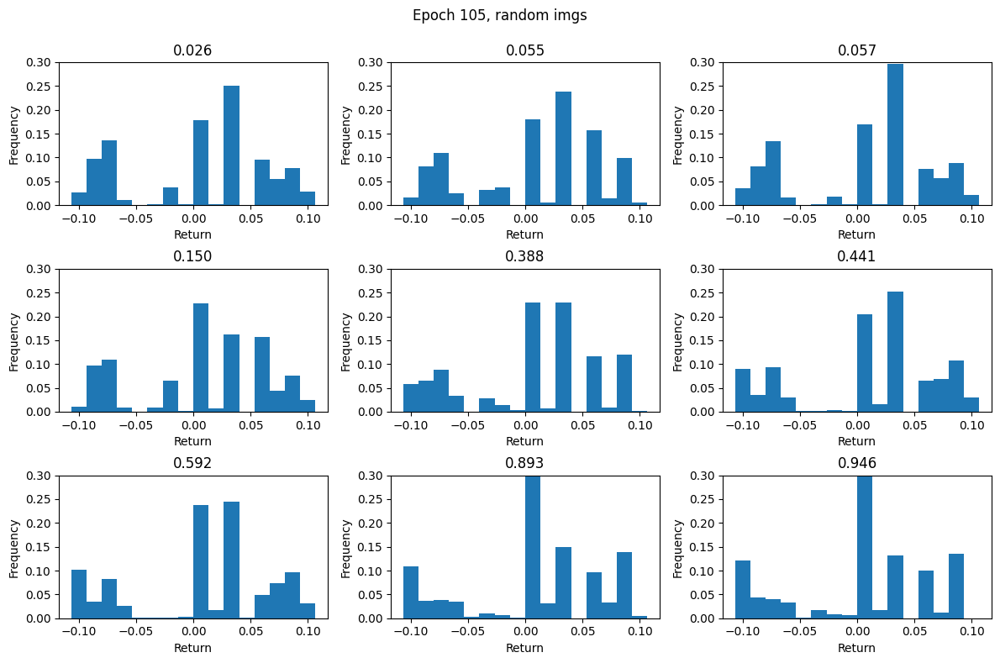

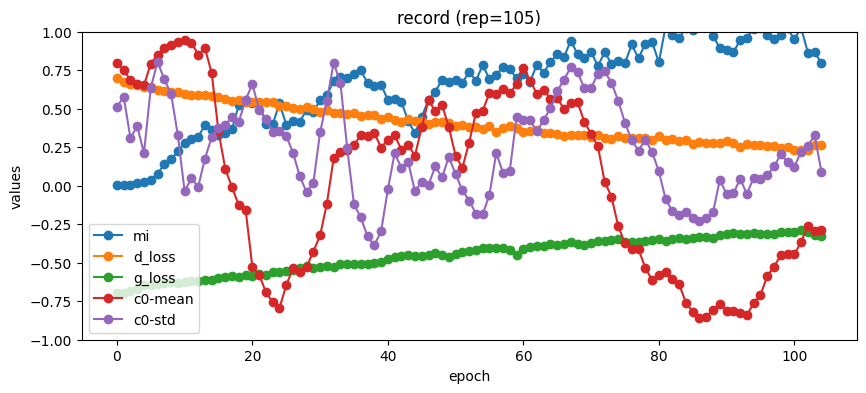

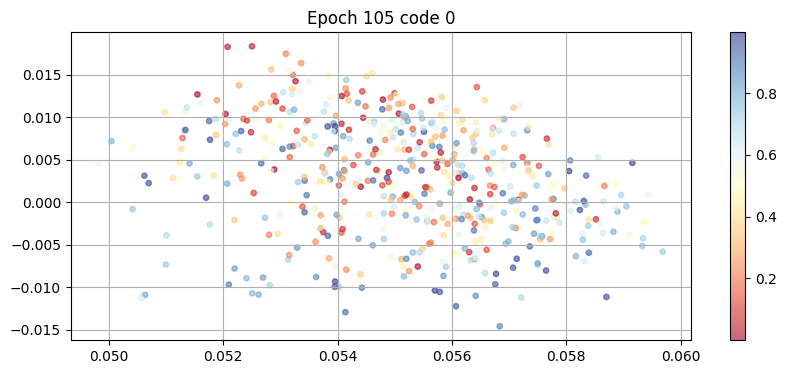

100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.311, D_loss=0.237, MI=0.927]


epoch: 106, D_loss: 0.23740162580244004, G_loss: -0.31123999337996205, MI = 0.9268344890686774


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.308, D_loss=0.255, MI=0.91] 


epoch: 107, D_loss: 0.25486272861880643, G_loss: -0.3081793044843981, MI = 0.910042824283723


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.287, D_loss=0.261, MI=0.95] 


epoch: 108, D_loss: 0.26068923790608683, G_loss: -0.2874909874893004, MI = 0.9504197797467632


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.282, D_loss=0.23, MI=0.986] 


epoch: 109, D_loss: 0.23021758275647317, G_loss: -0.28159319969915575, MI = 0.9857209622859955


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.281, D_loss=0.25, MI=0.943] 


epoch: 110, D_loss: 0.25031460725492044, G_loss: -0.2805749495183268, MI = 0.9425108961520656


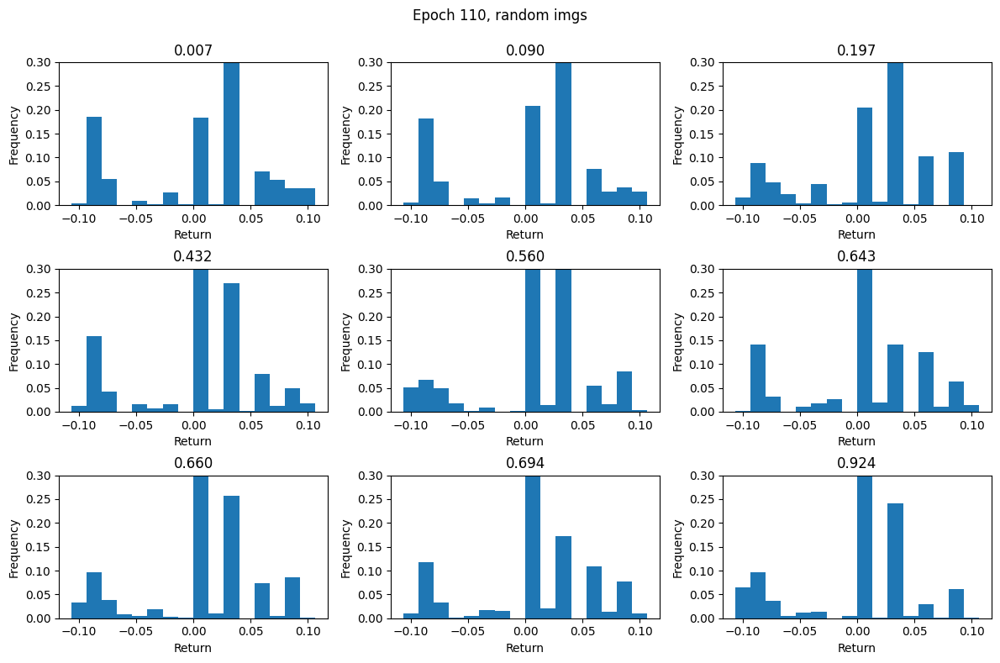

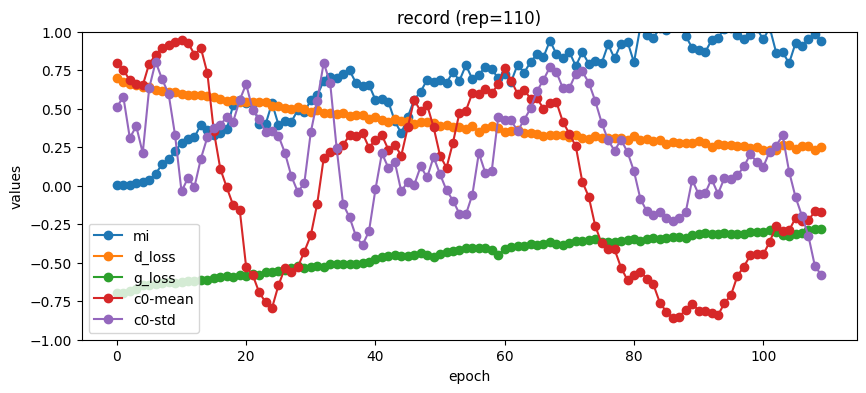

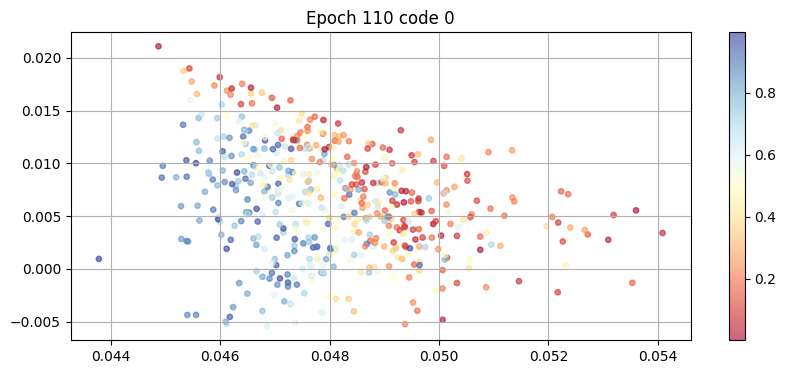

100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.286, D_loss=0.219, MI=1.02] 


epoch: 111, D_loss: 0.2191003599474507, G_loss: -0.2857229204908494, MI = 1.0192898781068864


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.28, D_loss=0.244, MI=0.991] 


epoch: 112, D_loss: 0.2437813248365156, G_loss: -0.2798734946597007, MI = 0.9911782289704969


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.271, D_loss=0.21, MI=0.943] 


epoch: 113, D_loss: 0.21013076555344365, G_loss: -0.2707258650372105, MI = 0.9425785820330342


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.267, D_loss=0.222, MI=0.998]


epoch: 114, D_loss: 0.22211974138213741, G_loss: -0.26676964375280565, MI = 0.9984122956952741


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.27, D_loss=0.215, MI=1.03]  


epoch: 115, D_loss: 0.21540511663882964, G_loss: -0.2697744076290438, MI = 1.026643189691728


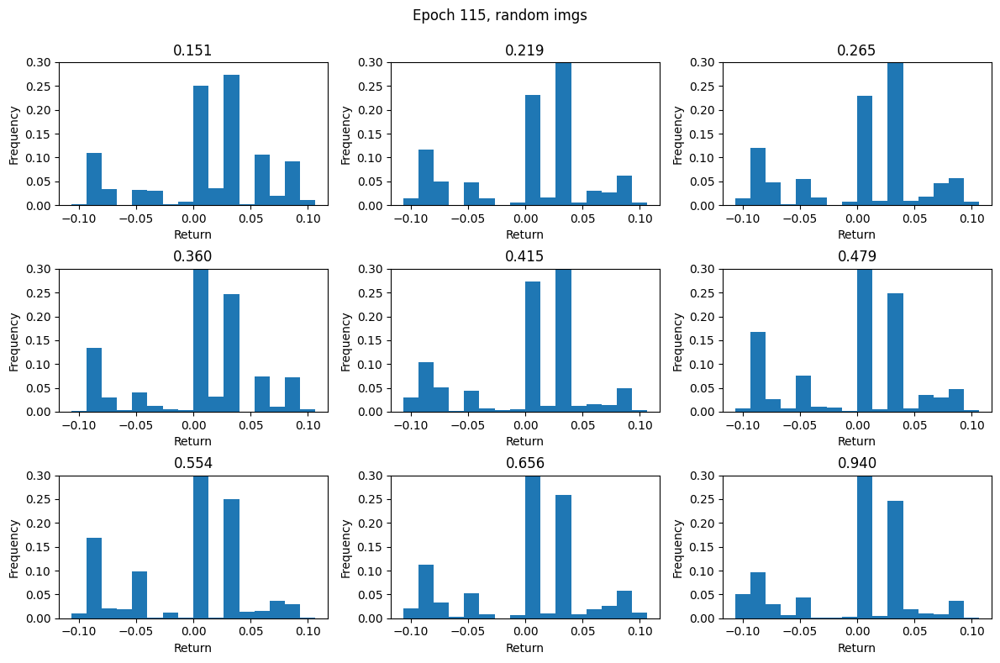

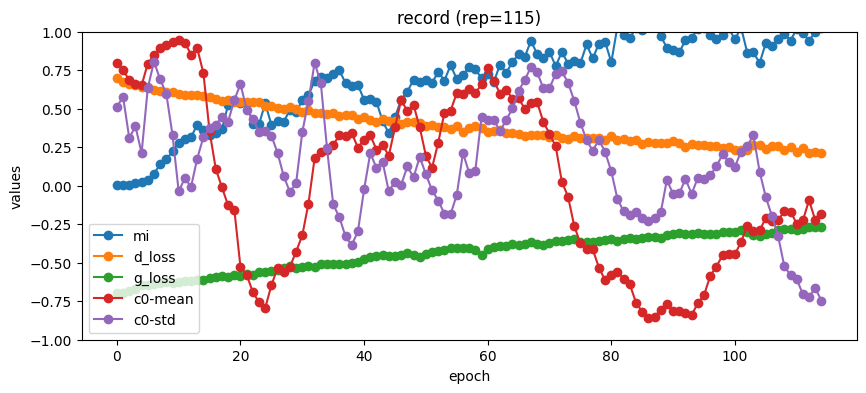

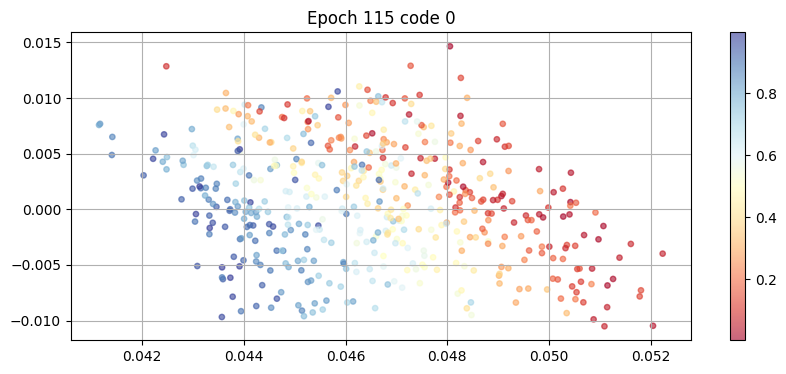

100%|██████████| 31/31 [00:36<00:00,  1.19s/it, G_loss=-.265, D_loss=0.231, MI=1.04] 


epoch: 116, D_loss: 0.2310988922272959, G_loss: -0.26525259787036526, MI = 1.04042007846217


100%|██████████| 31/31 [00:36<00:00,  1.19s/it, G_loss=-.266, D_loss=0.203, MI=1.09]


epoch: 117, D_loss: 0.20290888172964897, G_loss: -0.26611360378803744, MI = 1.0925314061103328


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.274, D_loss=0.204, MI=1.08] 


epoch: 118, D_loss: 0.2036323994398117, G_loss: -0.27433770029775556, MI = 1.081683196367756


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.261, D_loss=0.223, MI=1.1] 


epoch: 119, D_loss: 0.22325835545216838, G_loss: -0.26054696402242106, MI = 1.0985088598343633


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.267, D_loss=0.224, MI=1.04] 


epoch: 120, D_loss: 0.22415546399931754, G_loss: -0.26725002402259457, MI = 1.0395743616165654


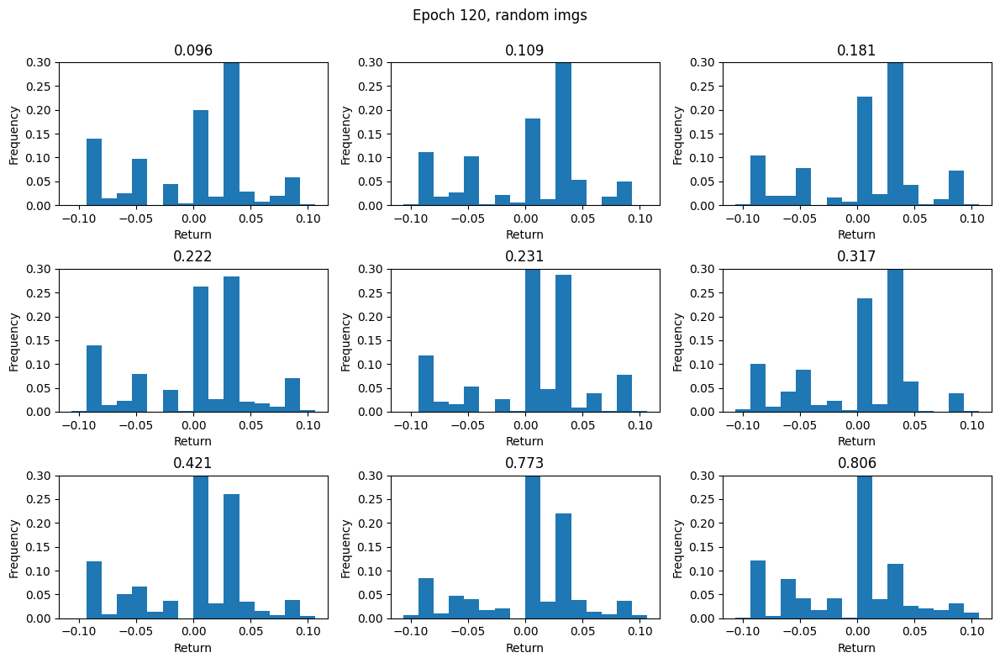

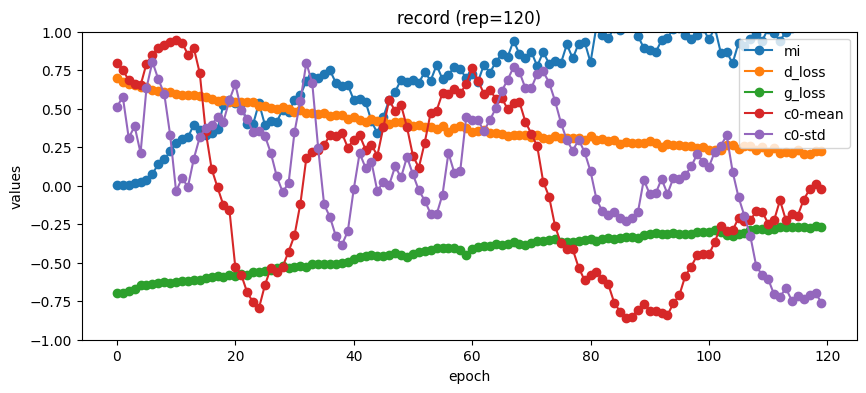

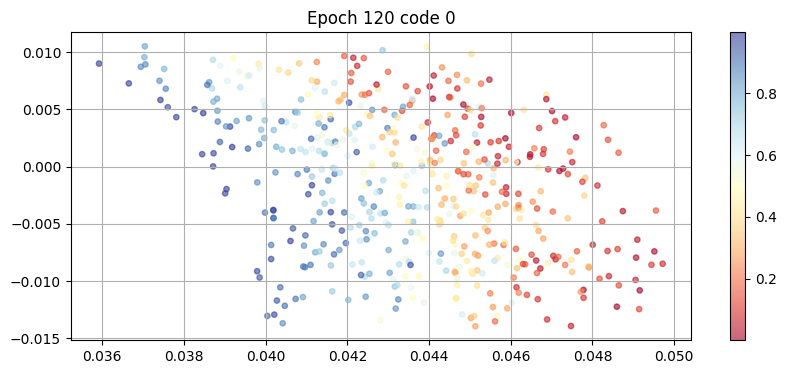

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.275, D_loss=0.235, MI=1.09]


epoch: 121, D_loss: 0.23473007063711843, G_loss: -0.27512137784111884, MI = 1.0890955924987793


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.263, D_loss=0.21, MI=1.03] 


epoch: 122, D_loss: 0.21012544824231055, G_loss: -0.2629210223113337, MI = 1.026709291242784


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.264, D_loss=0.213, MI=1.1]  


epoch: 123, D_loss: 0.21254900097846985, G_loss: -0.2642665851500727, MI = 1.1013510496385637


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.264, D_loss=0.209, MI=1.12]


epoch: 124, D_loss: 0.2091485603201774, G_loss: -0.26415119151915273, MI = 1.1168476823837525


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.262, D_loss=0.212, MI=0.978]


epoch: 125, D_loss: 0.21227134475784917, G_loss: -0.26186846292787985, MI = 0.9780460596084595


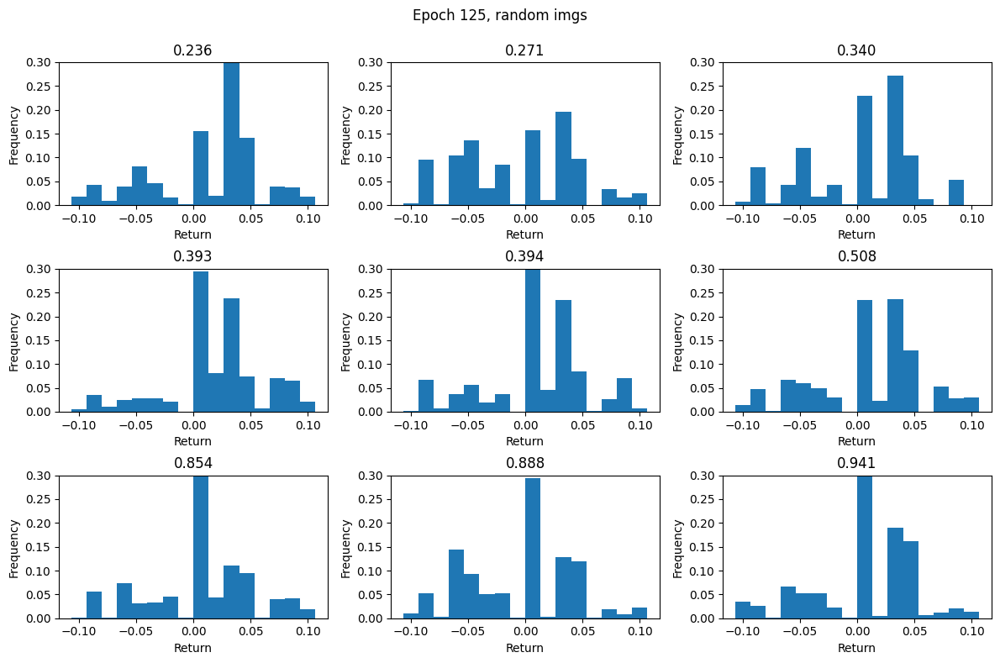

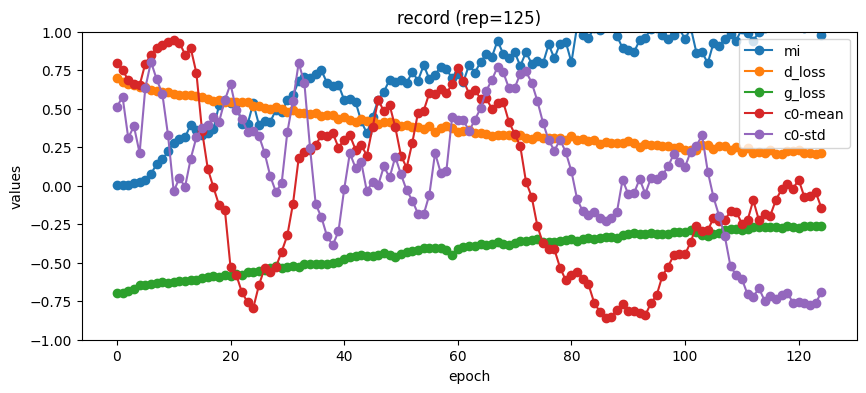

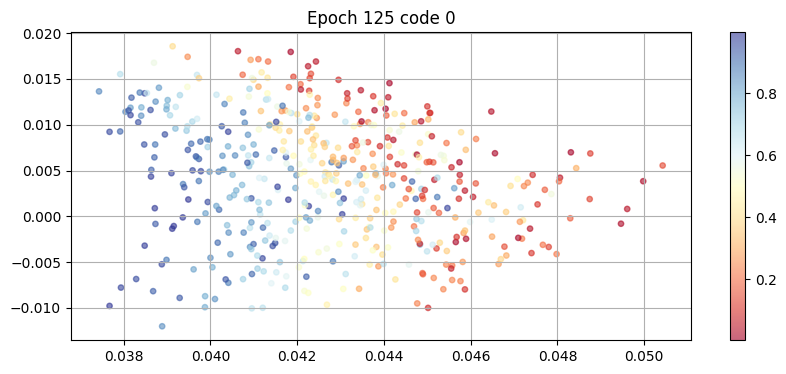

100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.26, D_loss=0.196, MI=1.02]  


epoch: 126, D_loss: 0.19580692485455545, G_loss: -0.26012558706345096, MI = 1.024481702235437


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.274, D_loss=0.227, MI=0.986]


epoch: 127, D_loss: 0.22733565299741684, G_loss: -0.27423345417745654, MI = 0.9861996635313957


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.258, D_loss=0.196, MI=1.06]


epoch: 128, D_loss: 0.19633214464110713, G_loss: -0.2578345753492848, MI = 1.0550368255184543


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.253, D_loss=0.198, MI=0.848]


epoch: 129, D_loss: 0.1983471219578097, G_loss: -0.2531255656673062, MI = 0.8480720827656407


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.249, D_loss=0.205, MI=0.926]


epoch: 130, D_loss: 0.20517534642450272, G_loss: -0.24876316516630112, MI = 0.9262934961626607


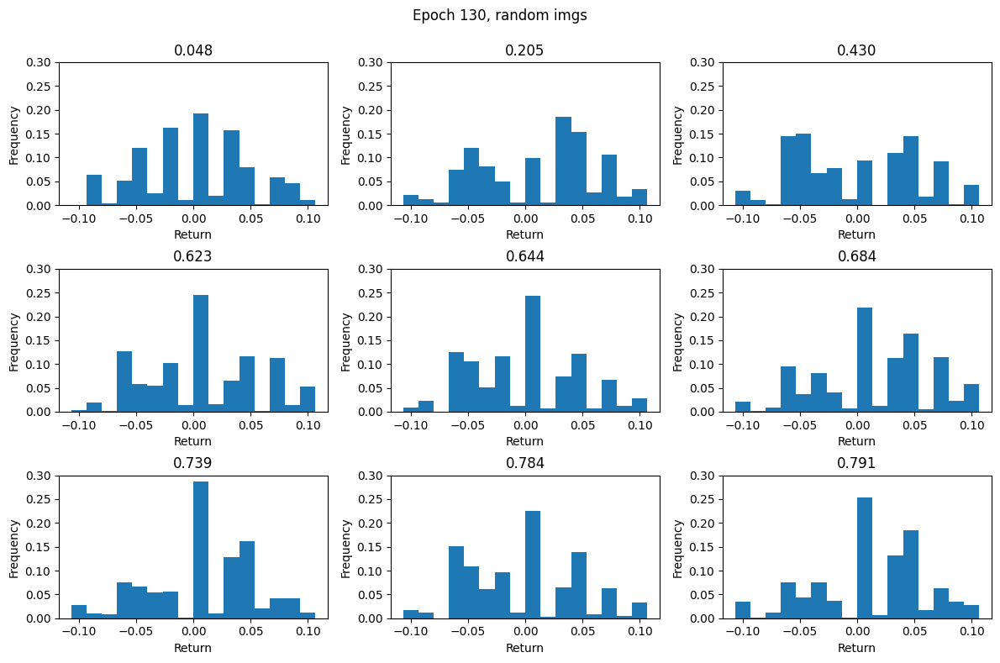

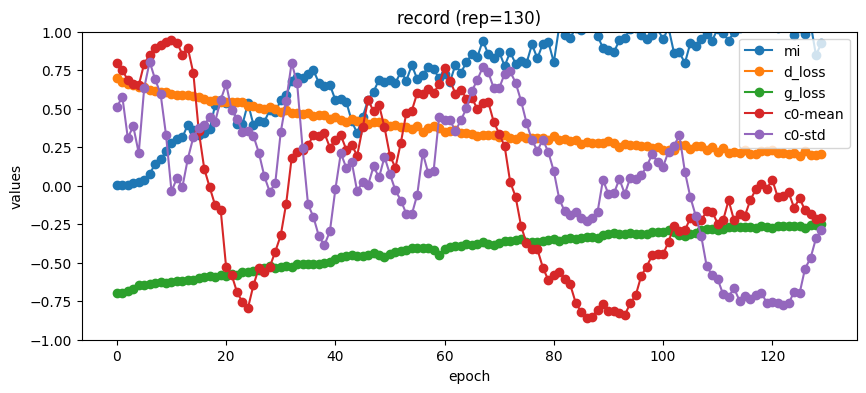

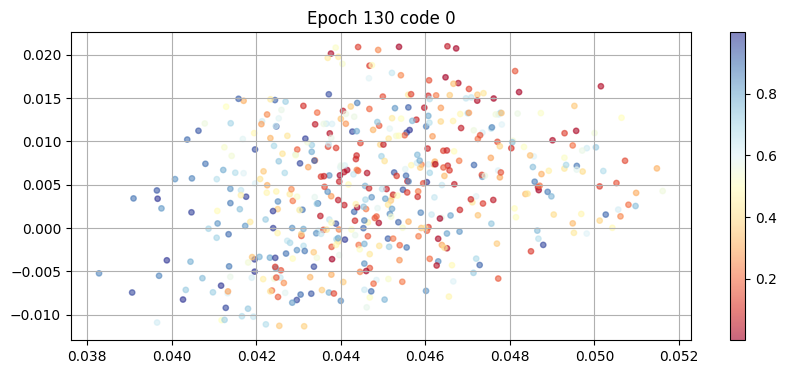

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.244, D_loss=0.201, MI=0.946]


epoch: 131, D_loss: 0.20071578410363966, G_loss: -0.24415841938987856, MI = 0.9459787991739088


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.245, D_loss=0.195, MI=1.02] 


epoch: 132, D_loss: 0.19540662054092653, G_loss: -0.2452701474389722, MI = 1.015424257324588


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.237, D_loss=0.199, MI=0.985]


epoch: 133, D_loss: 0.19948765250944323, G_loss: -0.23734768311823567, MI = 0.9846246415568937


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.237, D_loss=0.188, MI=1.07] 


epoch: 134, D_loss: 0.1880307481173546, G_loss: -0.23740286067608865, MI = 1.0676127018467072


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.232, D_loss=0.187, MI=0.997]


epoch: 135, D_loss: 0.18735405562385435, G_loss: -0.23221997484084098, MI = 0.9969783771422601


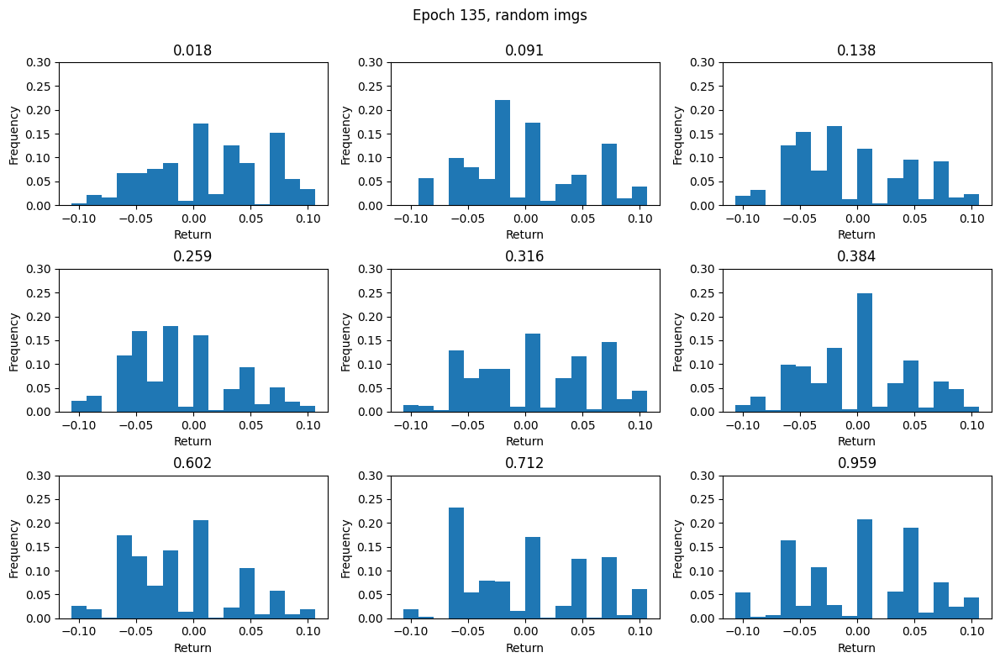

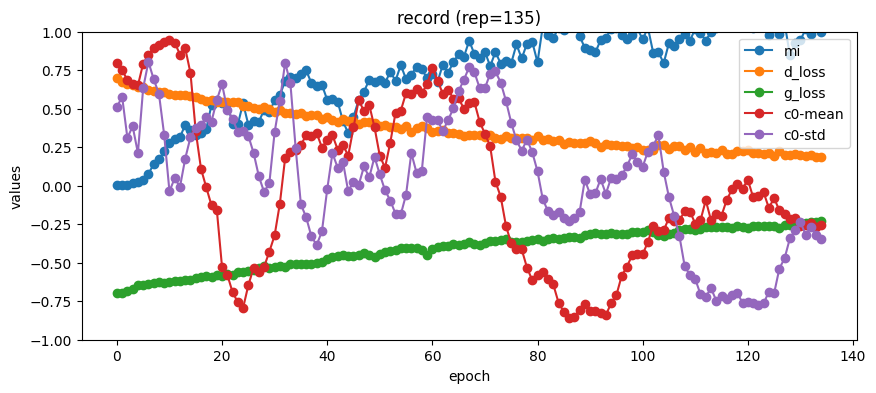

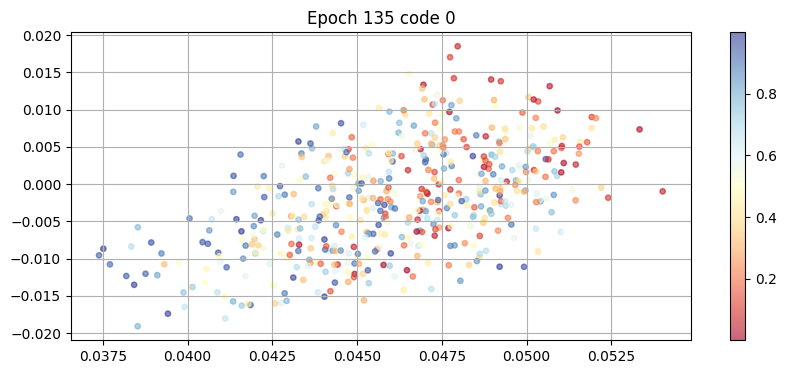

100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.238, D_loss=0.192, MI=0.984]


epoch: 136, D_loss: 0.19244566127177207, G_loss: -0.2380877358298148, MI = 0.9835457590318495


100%|██████████| 31/31 [00:35<00:00,  1.14s/it, G_loss=-.235, D_loss=0.188, MI=1.09]


epoch: 137, D_loss: 0.1880073170027425, G_loss: -0.23479282567577978, MI = 1.0948569870764209


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.232, D_loss=0.192, MI=1.12] 


epoch: 138, D_loss: 0.1916408231181483, G_loss: -0.23222703991397733, MI = 1.122834626705416


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.224, D_loss=0.181, MI=0.99] 


epoch: 139, D_loss: 0.18103389057420916, G_loss: -0.22380448012582718, MI = 0.9902511066006076


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.229, D_loss=0.187, MI=1.07]


epoch: 140, D_loss: 0.18736433478132372, G_loss: -0.22891986946905812, MI = 1.0659652621515336


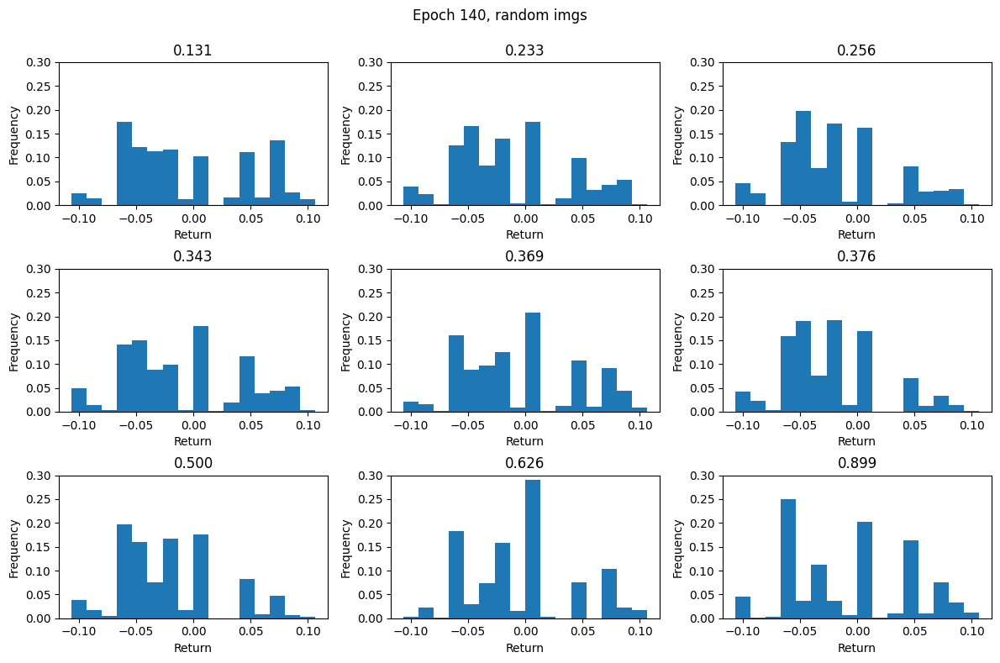

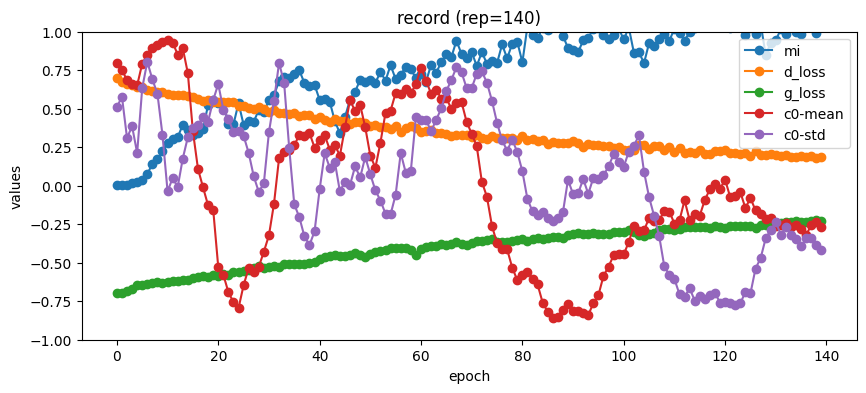

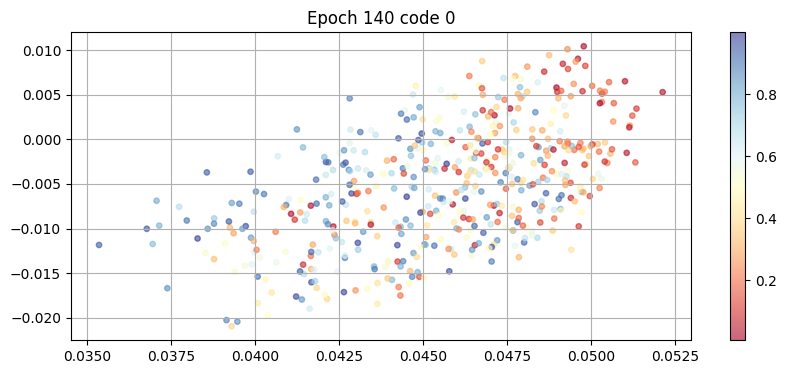

100%|██████████| 31/31 [00:35<00:00,  1.14s/it, G_loss=-.228, D_loss=0.177, MI=1.12] 


epoch: 141, D_loss: 0.1774865331188325, G_loss: -0.227655848187785, MI = 1.1177294638849073


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.224, D_loss=0.175, MI=1.09]


epoch: 142, D_loss: 0.1753044613907414, G_loss: -0.22378991303905363, MI = 1.093459706152639


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.229, D_loss=0.174, MI=1.12]


epoch: 143, D_loss: 0.1739328542063313, G_loss: -0.22858737793660933, MI = 1.1175717346129879


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.231, D_loss=0.169, MI=1.02] 


epoch: 144, D_loss: 0.168907088858466, G_loss: -0.23136397475196468, MI = 1.0162972692520387


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.228, D_loss=0.186, MI=1.03]


epoch: 145, D_loss: 0.1860397280223908, G_loss: -0.22750715863320134, MI = 1.0252513673997694


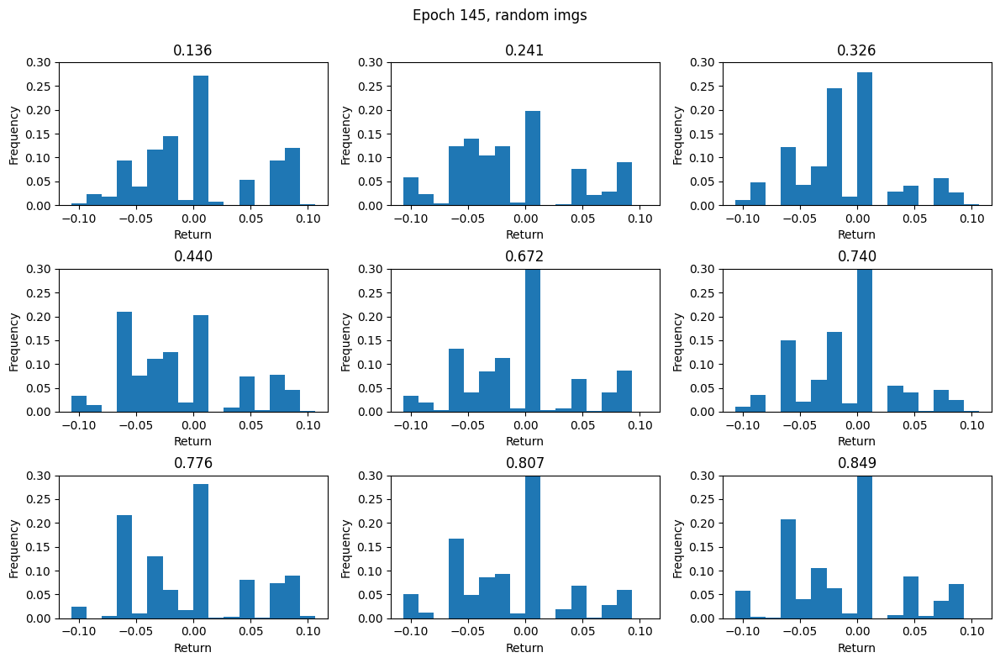

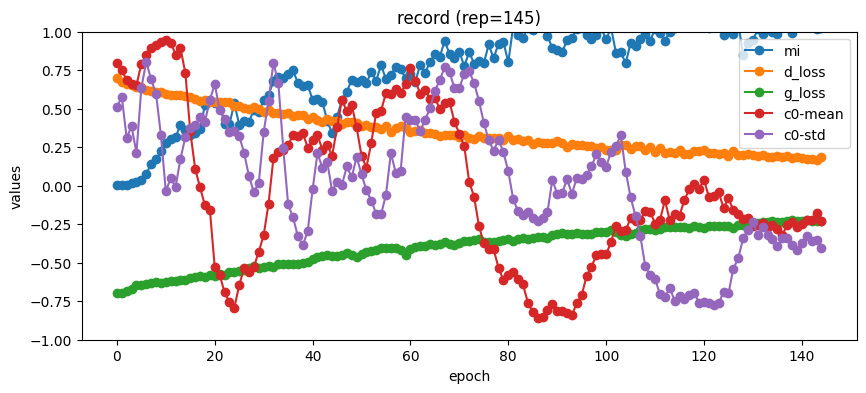

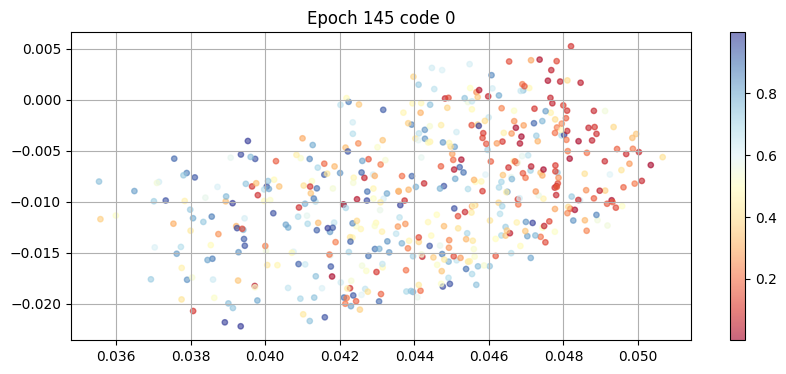

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.221, D_loss=0.154, MI=1.04]


epoch: 146, D_loss: 0.15352900638695685, G_loss: -0.22136391603177594, MI = 1.0398973245774545


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.214, D_loss=0.161, MI=1.16]


epoch: 147, D_loss: 0.16101409422774468, G_loss: -0.2137181326266258, MI = 1.1555843583999141


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.211, D_loss=0.173, MI=1.06] 


epoch: 148, D_loss: 0.17303706969945662, G_loss: -0.2112406761415543, MI = 1.0643670808884405


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.206, D_loss=0.172, MI=1.04]


epoch: 149, D_loss: 0.1716999565401385, G_loss: -0.20620390196000377, MI = 1.0360196405841458


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.206, D_loss=0.157, MI=1.04] 


epoch: 150, D_loss: 0.15729541283461354, G_loss: -0.20618785244803275, MI = 1.0410670734220935


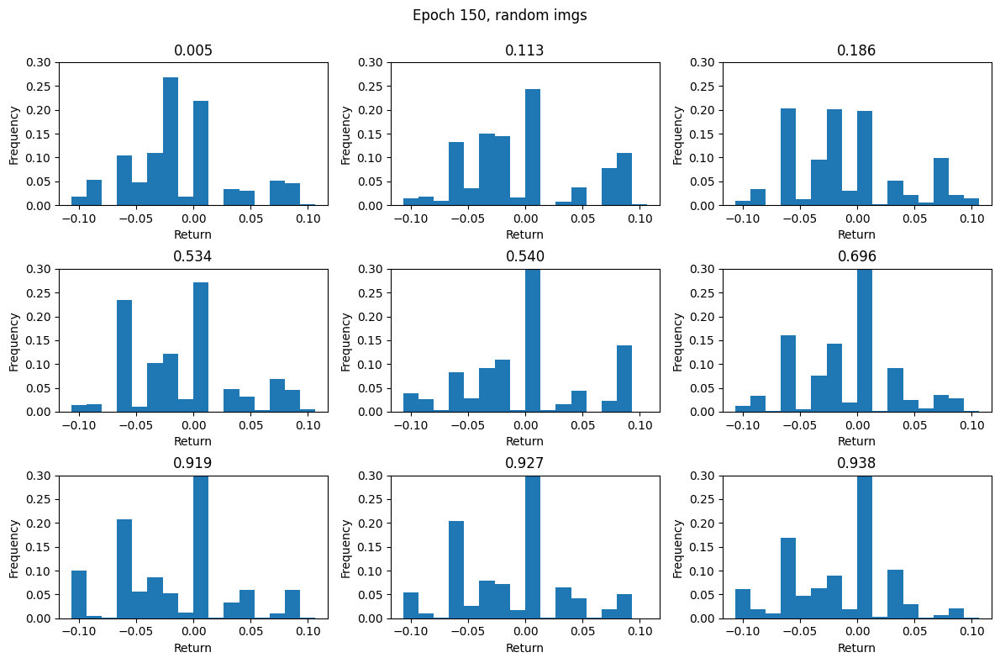

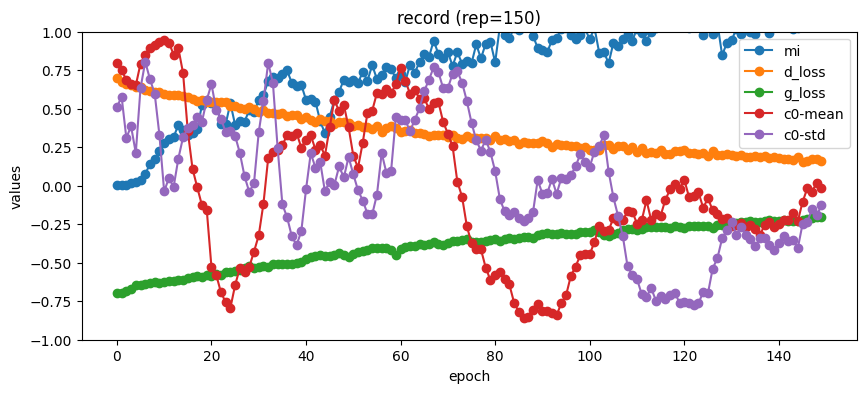

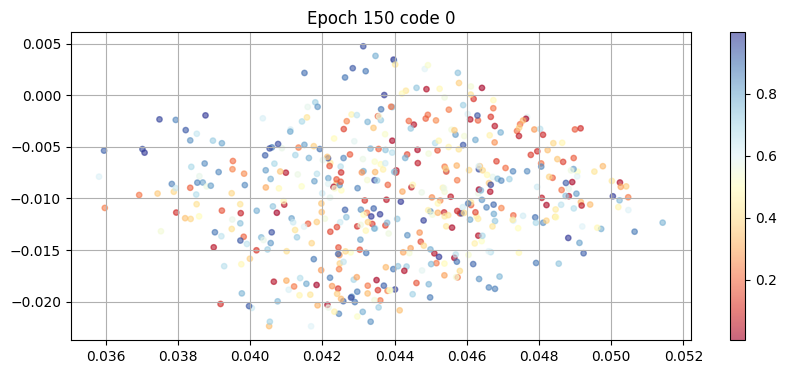

100%|██████████| 31/31 [00:35<00:00,  1.14s/it, G_loss=-.204, D_loss=0.17, MI=1.11] 


epoch: 151, D_loss: 0.1704098998058227, G_loss: -0.2035444542284935, MI = 1.1080271197903542


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.203, D_loss=0.173, MI=1.03]


epoch: 152, D_loss: 0.1725709947847551, G_loss: -0.20273243659926998, MI = 1.032692390103494


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.216, D_loss=0.15, MI=1.09] 


epoch: 153, D_loss: 0.14979908879726164, G_loss: -0.21578457470863097, MI = 1.0871049434907976


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.203, D_loss=0.171, MI=1.01] 


epoch: 154, D_loss: 0.17061932384967804, G_loss: -0.20300635743525722, MI = 1.0129666636067052


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.207, D_loss=0.137, MI=0.958]


epoch: 155, D_loss: 0.13675673858773324, G_loss: -0.20721250484066625, MI = 0.9576388751306841


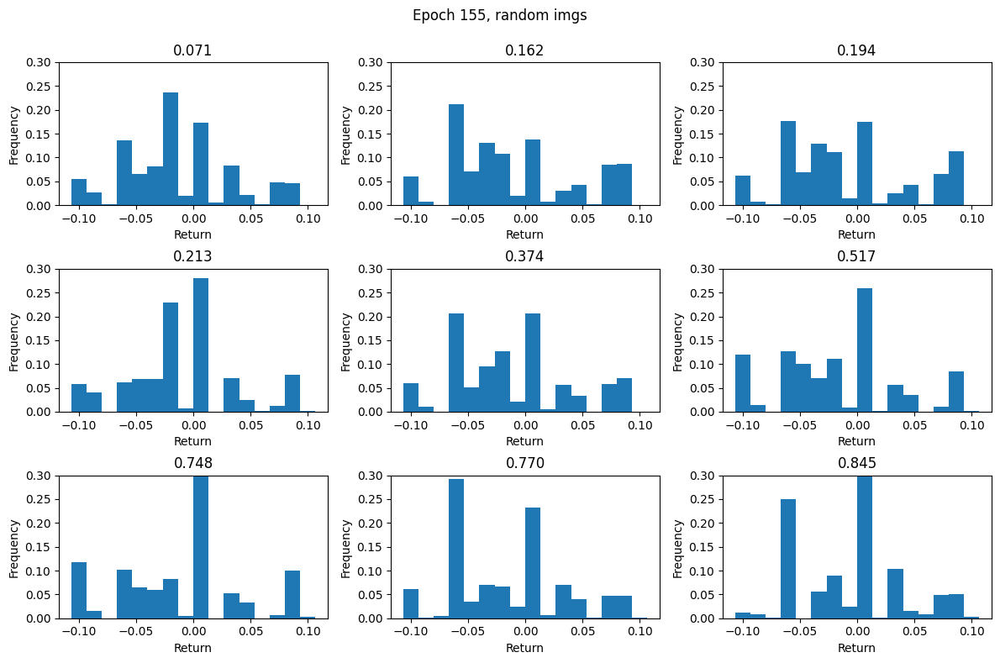

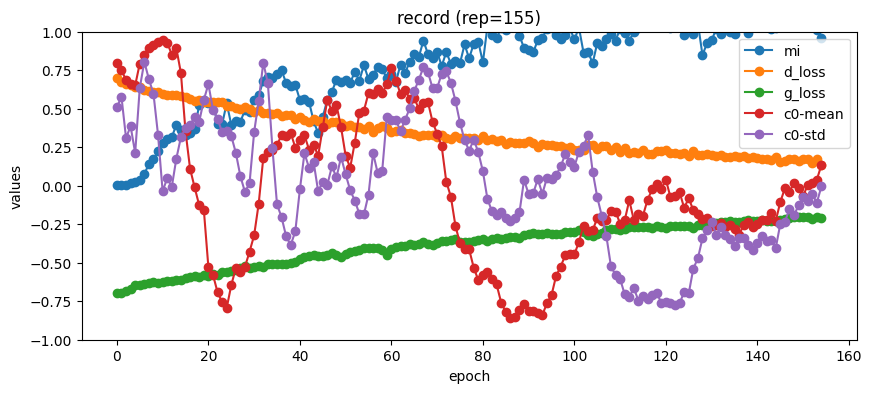

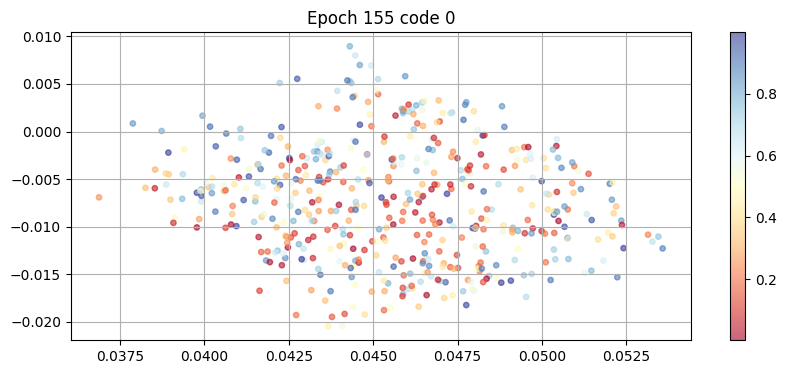

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.212, D_loss=0.167, MI=1.04] 


epoch: 156, D_loss: 0.1672933990916898, G_loss: -0.21195798871978636, MI = 1.038382061066166


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.206, D_loss=0.153, MI=1.04] 


epoch: 157, D_loss: 0.15295714284143141, G_loss: -0.20647630864574062, MI = 1.0407902809881395


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.204, D_loss=0.151, MI=1.05]


epoch: 158, D_loss: 0.15086665749549866, G_loss: -0.20406150577529783, MI = 1.0495181545134513


100%|██████████| 31/31 [00:35<00:00,  1.14s/it, G_loss=-.201, D_loss=0.144, MI=1]    


epoch: 159, D_loss: 0.14380007597707933, G_loss: -0.20073108519277266, MI = 1.001661769805416


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.202, D_loss=0.145, MI=1.04] 


epoch: 160, D_loss: 0.14517266303300858, G_loss: -0.2016762230665453, MI = 1.041260580862722


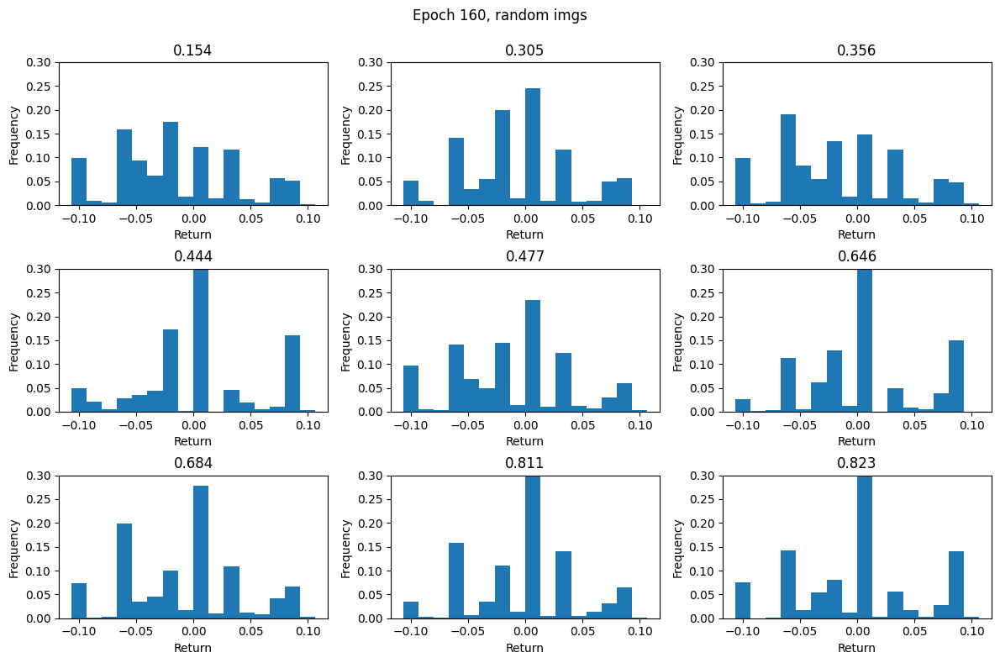

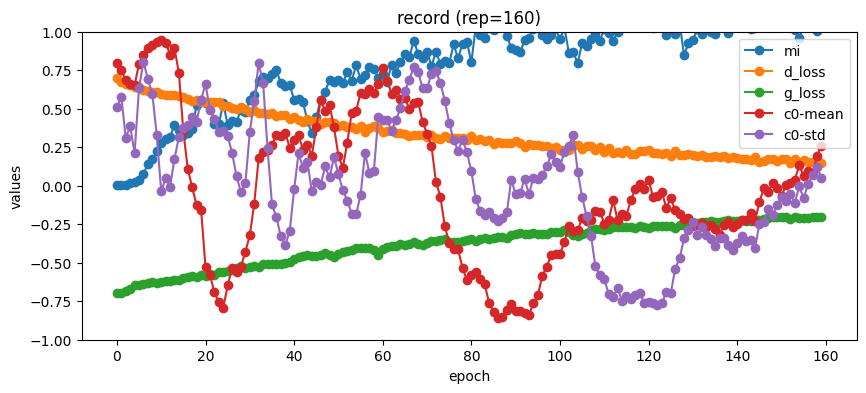

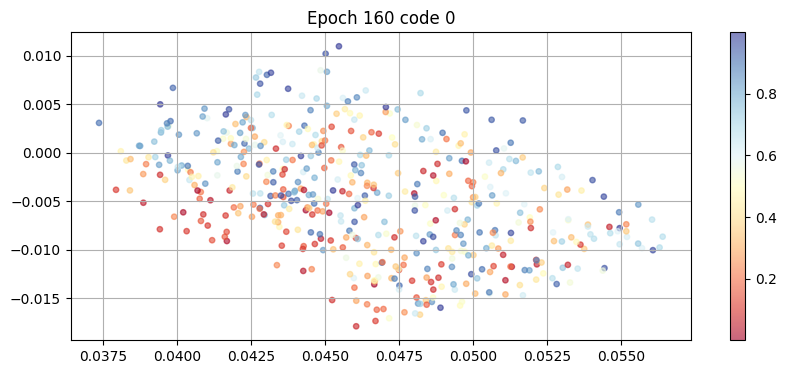

100%|██████████| 31/31 [00:38<00:00,  1.24s/it, G_loss=-.196, D_loss=0.145, MI=1.13]


epoch: 161, D_loss: 0.14497276347491048, G_loss: -0.1956057846546173, MI = 1.1295349021111765


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.198, D_loss=0.161, MI=1.12]


epoch: 162, D_loss: 0.16088882521275552, G_loss: -0.19775781468037637, MI = 1.1205277135295253


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.203, D_loss=0.128, MI=1.12]


epoch: 163, D_loss: 0.1279879327743284, G_loss: -0.20328429100974912, MI = 1.11866920609628


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.207, D_loss=0.143, MI=1.11]


epoch: 164, D_loss: 0.14254798812250938, G_loss: -0.20694000970932744, MI = 1.11439081545799


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.199, D_loss=0.148, MI=0.979]


epoch: 165, D_loss: 0.14820033287809742, G_loss: -0.19930143365936895, MI = 0.9785285649761077


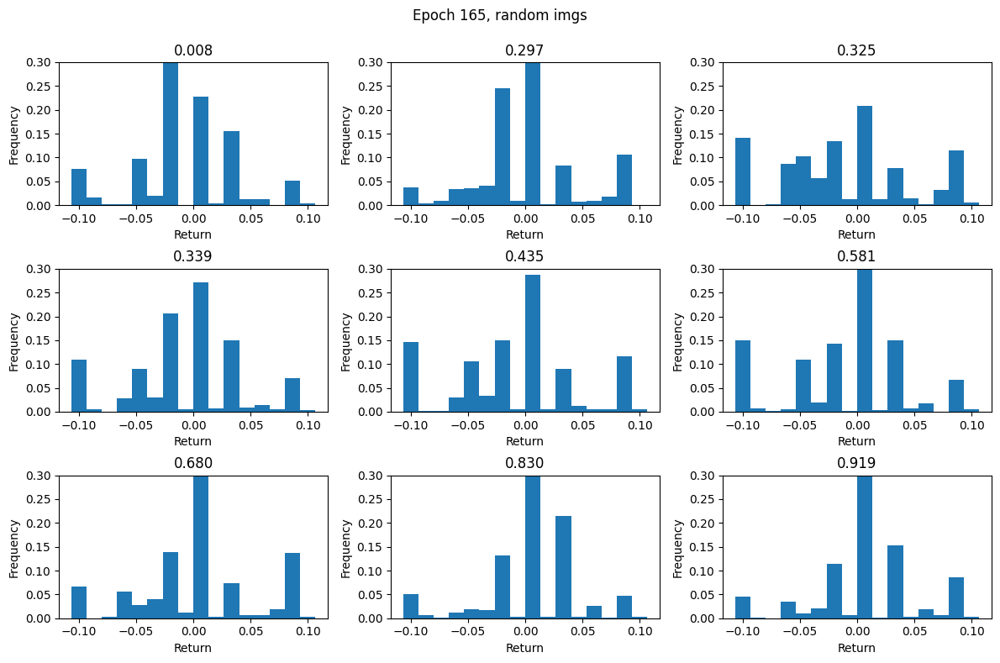

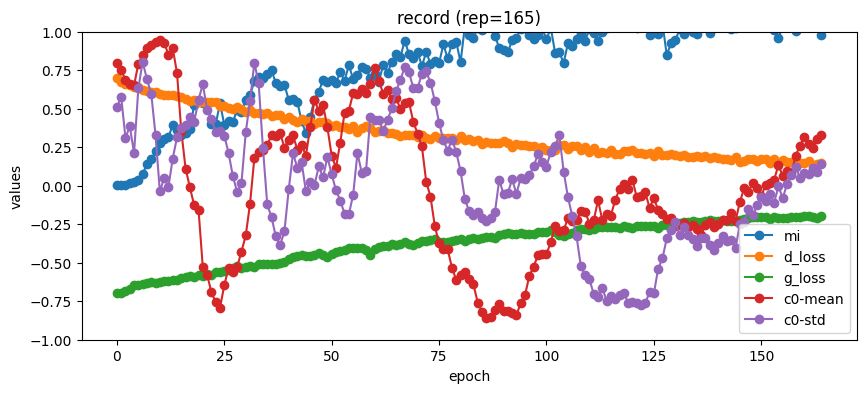

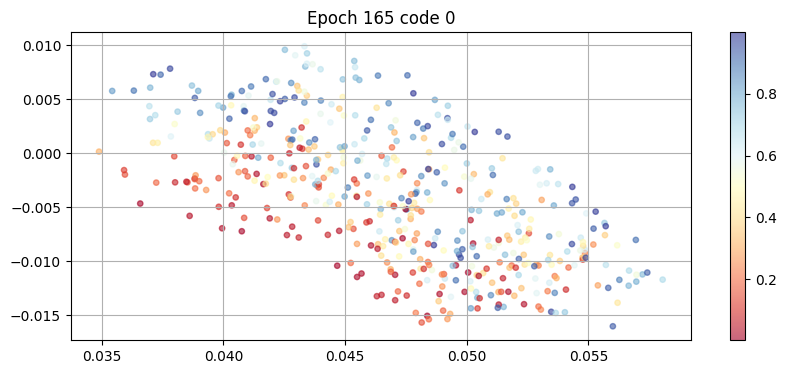

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.201, D_loss=0.157, MI=1.14]


epoch: 166, D_loss: 0.157263993495895, G_loss: -0.20141331418868033, MI = 1.1389532281506447


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.205, D_loss=0.151, MI=1.03] 


epoch: 167, D_loss: 0.15110767055903712, G_loss: -0.2050876982750431, MI = 1.0276078562582693


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.203, D_loss=0.143, MI=1.23]


epoch: 168, D_loss: 0.14335042310337867, G_loss: -0.20312302968194407, MI = 1.231580872689524


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.197, D_loss=0.15, MI=1.13] 


epoch: 169, D_loss: 0.15044900630750963, G_loss: -0.1967672994059901, MI = 1.1263969213731828


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.193, D_loss=0.151, MI=1.06]


epoch: 170, D_loss: 0.15100463647996226, G_loss: -0.19325237745238888, MI = 1.0591691155587473


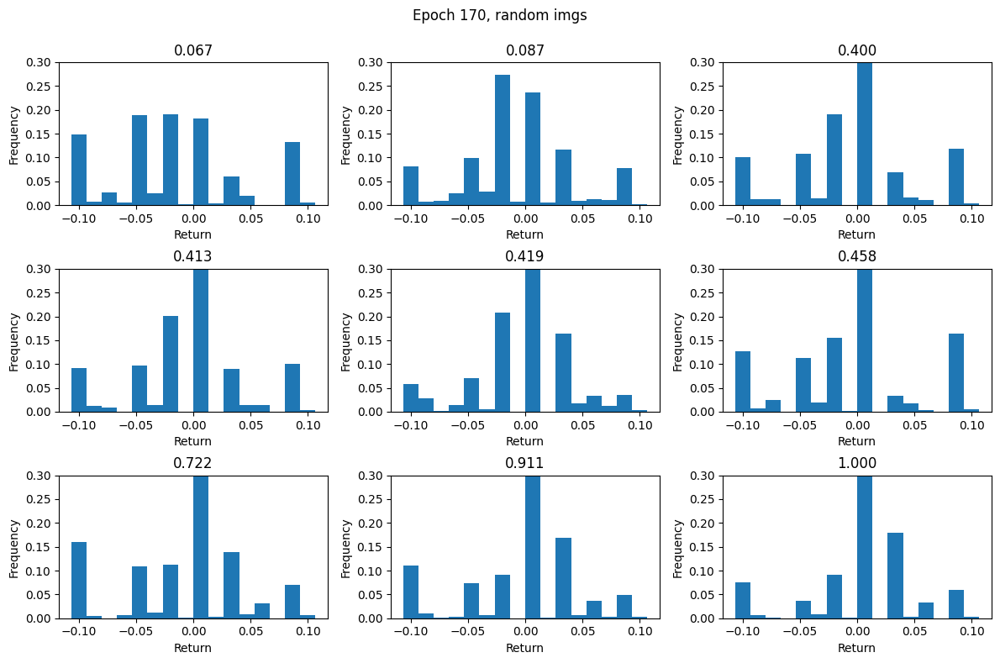

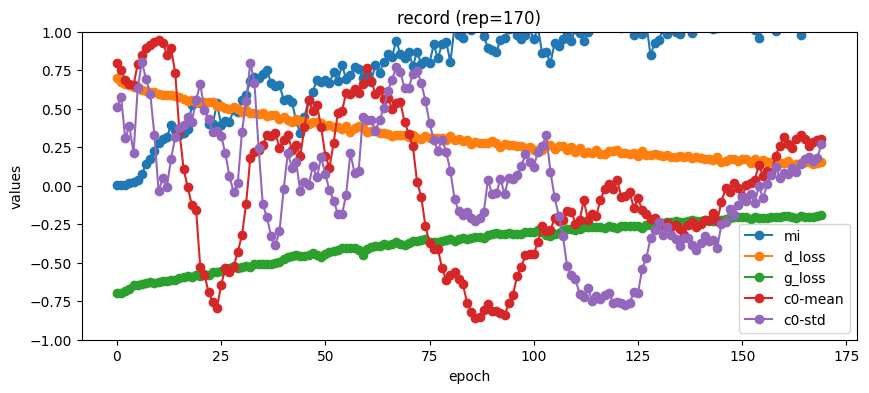

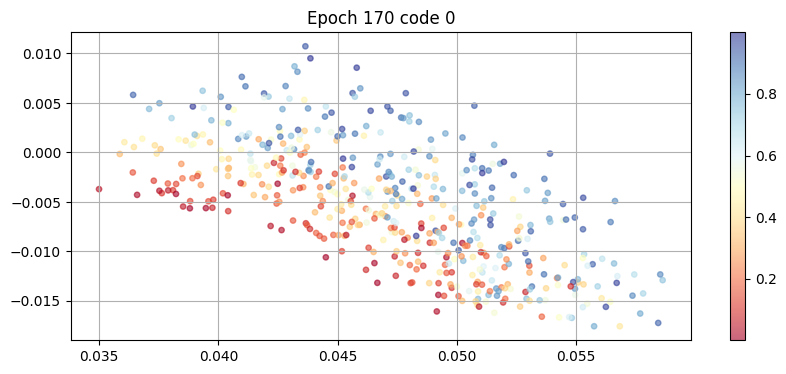

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.202, D_loss=0.142, MI=1.14]


epoch: 171, D_loss: 0.141795068738922, G_loss: -0.2016421349779252, MI = 1.1394215206946097


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.192, D_loss=0.135, MI=1.12]


epoch: 172, D_loss: 0.1349360661641244, G_loss: -0.1919211245352222, MI = 1.1195205219330326


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.191, D_loss=0.134, MI=1]    


epoch: 173, D_loss: 0.13406339023382433, G_loss: -0.19134969576712577, MI = 1.0038202578021633


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.189, D_loss=0.142, MI=1.09]


epoch: 174, D_loss: 0.1424594920489096, G_loss: -0.1887290213377245, MI = 1.0900836875361781


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.184, D_loss=0.131, MI=1.14]


epoch: 175, D_loss: 0.1310900279110478, G_loss: -0.18377616665055674, MI = 1.1382273474047262


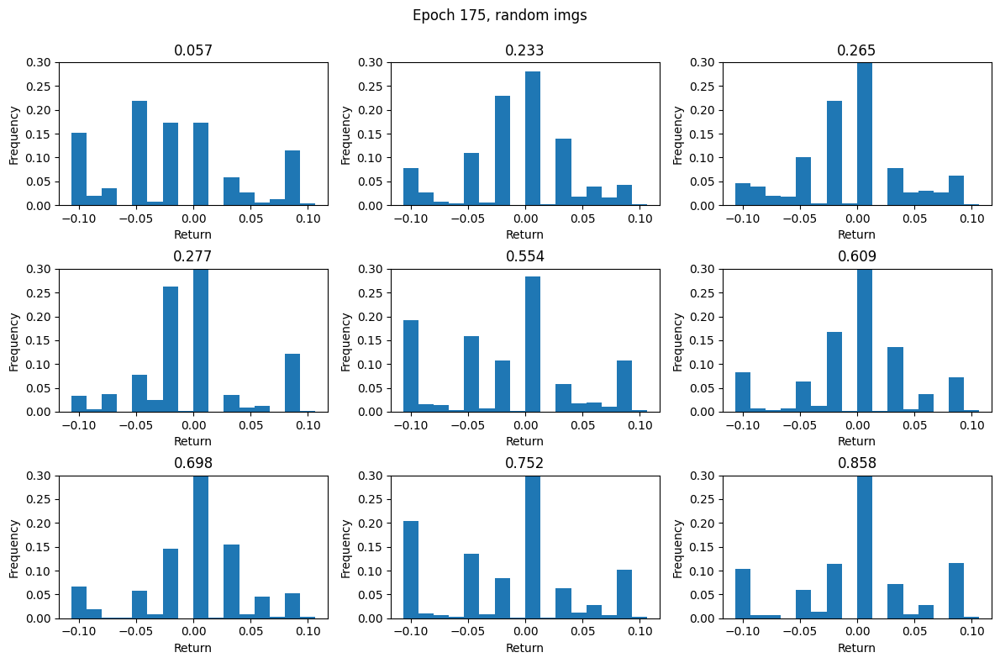

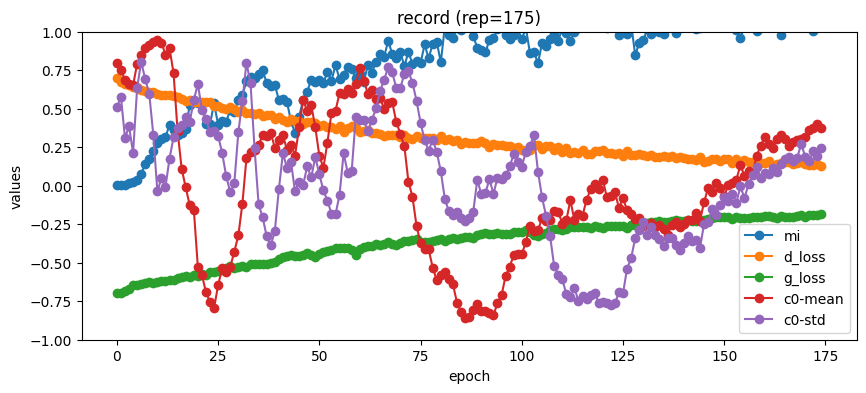

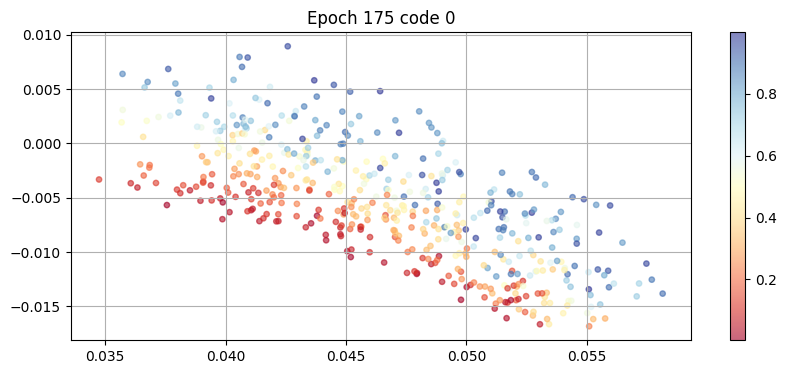

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.183, D_loss=0.143, MI=1]    


epoch: 176, D_loss: 0.14278903603553772, G_loss: -0.18327933453744458, MI = 1.0016880496855705


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.188, D_loss=0.137, MI=1.11]


epoch: 177, D_loss: 0.13740175313526584, G_loss: -0.18786391567799351, MI = 1.1064915964680333


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.187, D_loss=0.124, MI=1.24]


epoch: 178, D_loss: 0.1239093917031442, G_loss: -0.18698638244982688, MI = 1.237697882037009


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.183, D_loss=0.126, MI=1.11]


epoch: 179, D_loss: 0.12595235652500583, G_loss: -0.18315709454398002, MI = 1.1097802788980546


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.184, D_loss=0.127, MI=1.15]


epoch: 180, D_loss: 0.12718692758390981, G_loss: -0.1838785179199711, MI = 1.152736517690843


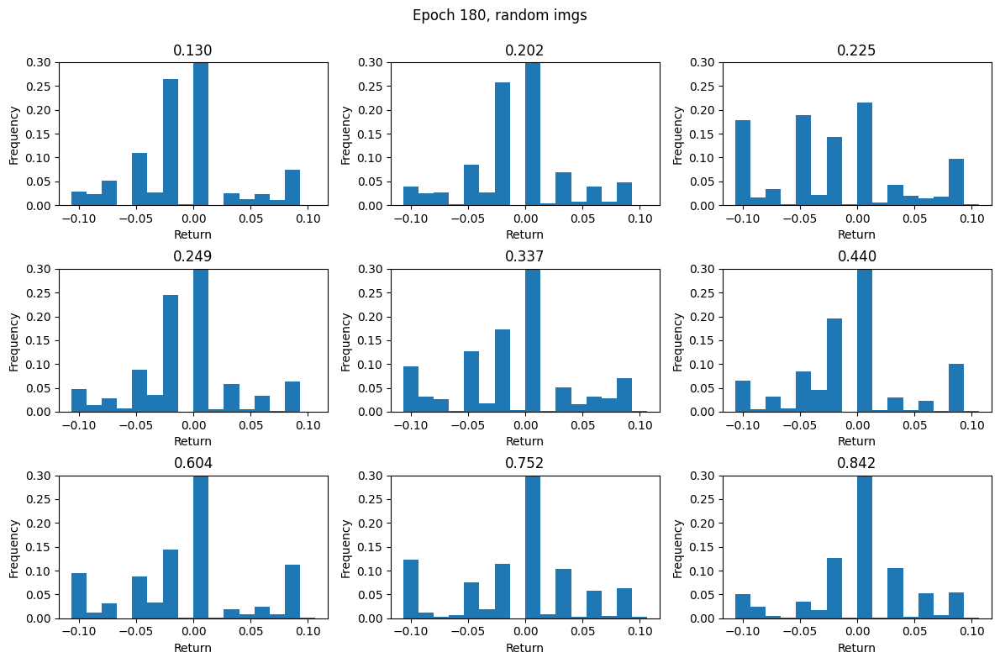

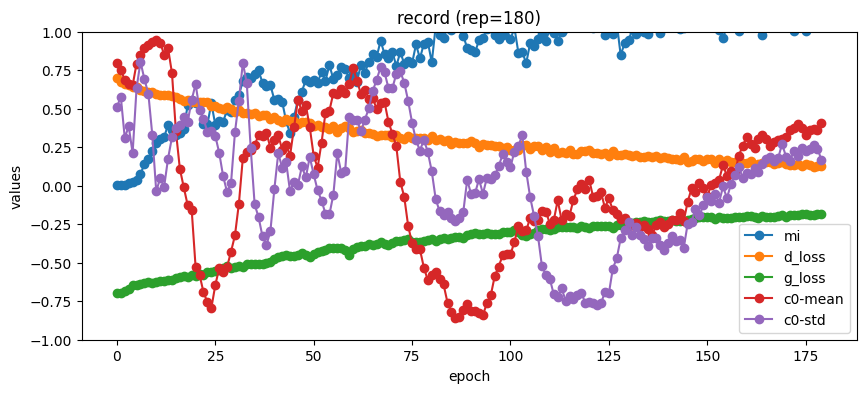

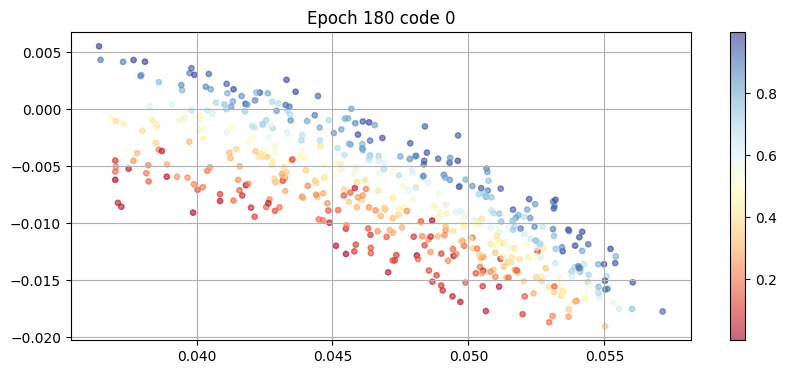

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.178, D_loss=0.134, MI=1.21]


epoch: 181, D_loss: 0.1343276844389977, G_loss: -0.17802121514274227, MI = 1.208139750265306


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.182, D_loss=0.13, MI=1.09]  


epoch: 182, D_loss: 0.12996016394707463, G_loss: -0.18240658746611688, MI = 1.0916221295633624


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.178, D_loss=0.129, MI=1.21]


epoch: 183, D_loss: 0.12939503957186976, G_loss: -0.17809759657229146, MI = 1.2088767097842308


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.181, D_loss=0.123, MI=1.08] 


epoch: 184, D_loss: 0.12324650561617266, G_loss: -0.18055063293826196, MI = 1.075178280953438


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.181, D_loss=0.123, MI=1.1] 


epoch: 185, D_loss: 0.12260273555594106, G_loss: -0.18051248404287523, MI = 1.096939952142777


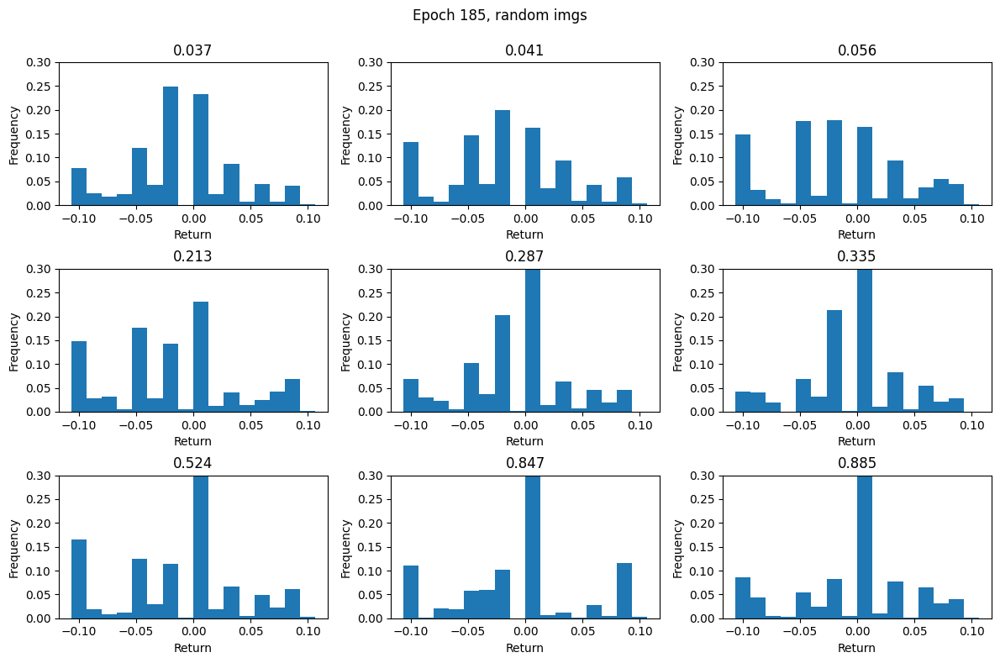

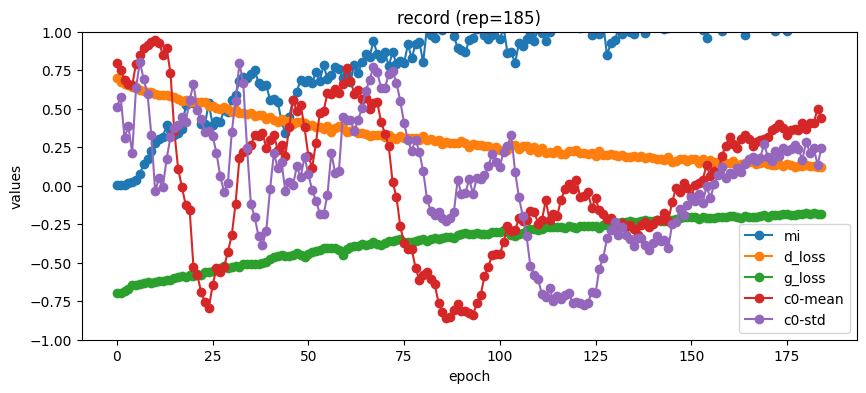

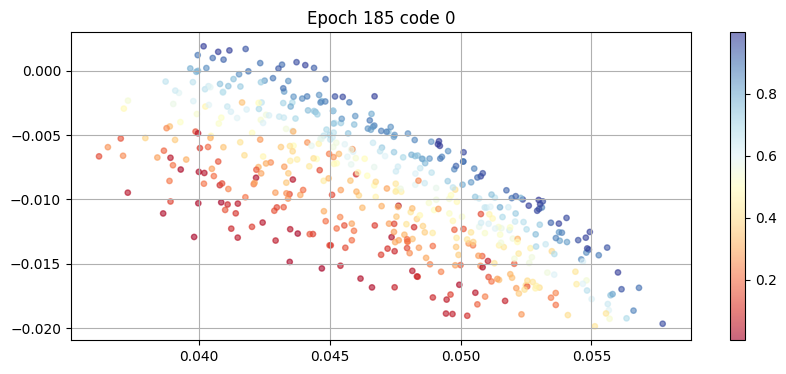

100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.176, D_loss=0.117, MI=1.11]


epoch: 186, D_loss: 0.11712822726657314, G_loss: -0.17644576968685274, MI = 1.107572167150436


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.171, D_loss=0.118, MI=1.13]


epoch: 187, D_loss: 0.11760812613271898, G_loss: -0.17106581839822954, MI = 1.1335676004809718


100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.177, D_loss=0.124, MI=1.11]


epoch: 188, D_loss: 0.12417587685969568, G_loss: -0.1766659208843785, MI = 1.1139401658888786


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.17, D_loss=0.119, MI=1.12] 


epoch: 189, D_loss: 0.11914094225052864, G_loss: -0.17046060100678476, MI = 1.1165445389286164


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.179, D_loss=0.139, MI=1.12]


epoch: 190, D_loss: 0.1390419628831648, G_loss: -0.17947241519728013, MI = 1.1179632294562556


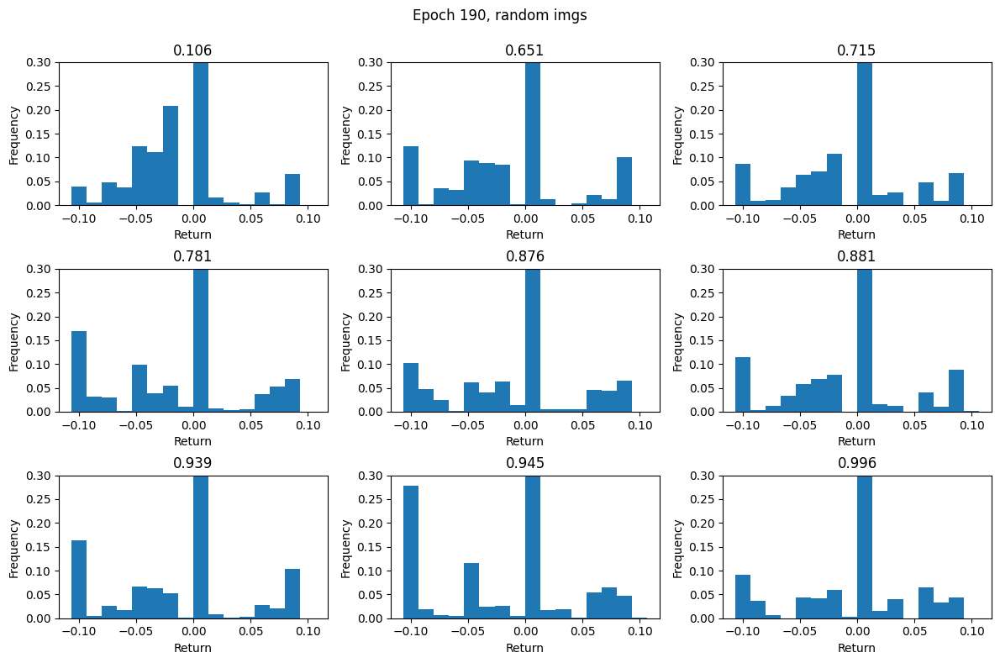

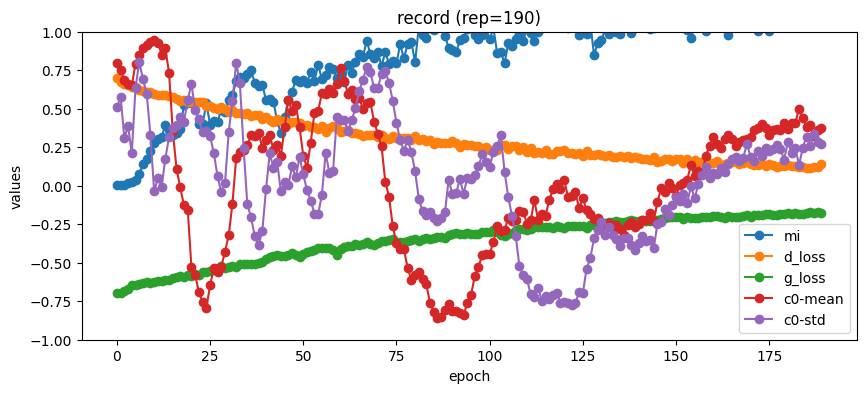

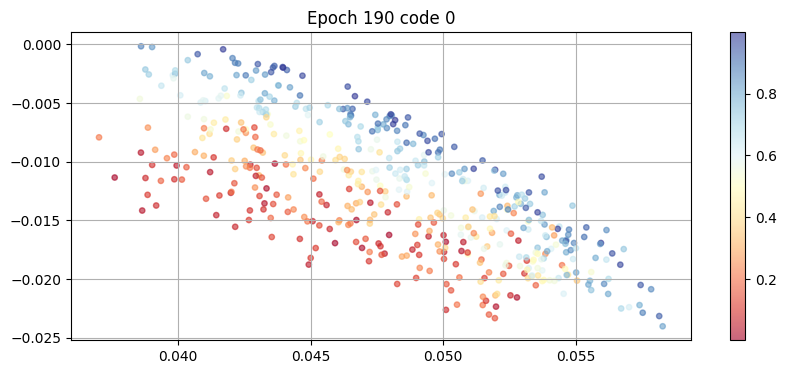

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.19, D_loss=0.117, MI=1.22]  


epoch: 191, D_loss: 0.11677535358936555, G_loss: -0.19031835707925981, MI = 1.2233325473723873


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.18, D_loss=0.119, MI=1.12] 


epoch: 192, D_loss: 0.11930348796229209, G_loss: -0.1796048129758527, MI = 1.1216678061792928


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.178, D_loss=0.126, MI=1.16]


epoch: 193, D_loss: 0.12573406701126405, G_loss: -0.17792393122949907, MI = 1.155946135520935


100%|██████████| 31/31 [00:36<00:00,  1.18s/it, G_loss=-.181, D_loss=0.13, MI=1.21] 


epoch: 194, D_loss: 0.13003377063620475, G_loss: -0.18099733129624399, MI = 1.2070975995832873


100%|██████████| 31/31 [00:35<00:00,  1.14s/it, G_loss=-.181, D_loss=0.127, MI=1.2] 


epoch: 195, D_loss: 0.1268671751022339, G_loss: -0.18072623879678787, MI = 1.2039002526190974


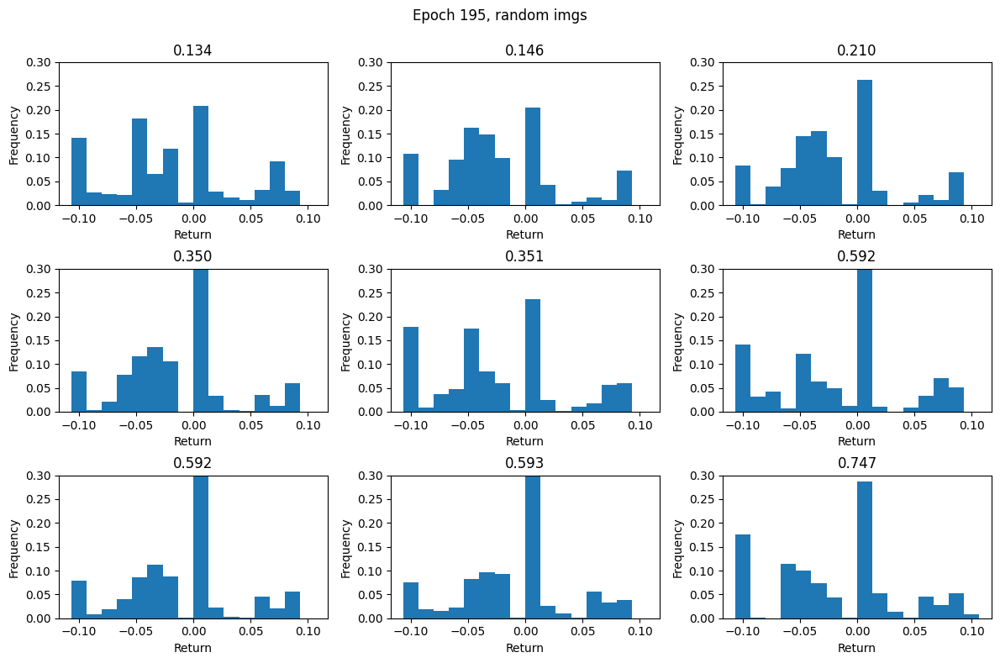

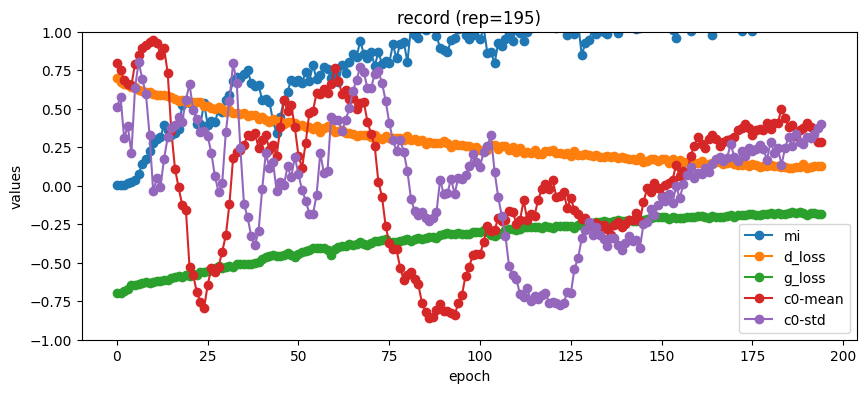

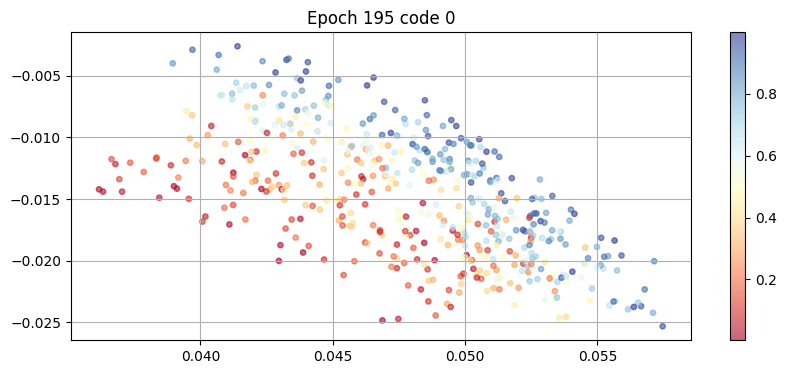

100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.188, D_loss=0.14, MI=1.22] 


epoch: 196, D_loss: 0.13954314036715415, G_loss: -0.18752454605794722, MI = 1.2227457607946088


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.181, D_loss=0.119, MI=1.3] 


epoch: 197, D_loss: 0.11933473257287856, G_loss: -0.18091790570366767, MI = 1.2974957343070739


100%|██████████| 31/31 [00:36<00:00,  1.16s/it, G_loss=-.186, D_loss=0.124, MI=1.12]


epoch: 198, D_loss: 0.12411917866237702, G_loss: -0.1859275972650897, MI = 1.1216946071194065


100%|██████████| 31/31 [00:35<00:00,  1.16s/it, G_loss=-.174, D_loss=0.129, MI=1.21]


epoch: 199, D_loss: 0.12924038017949752, G_loss: -0.17445732989618856, MI = 1.2086913066525613


100%|██████████| 31/31 [00:35<00:00,  1.15s/it, G_loss=-.181, D_loss=0.125, MI=1.2] 


epoch: 200, D_loss: 0.1252551886343187, G_loss: -0.18072018267646914, MI = 1.202370855116075


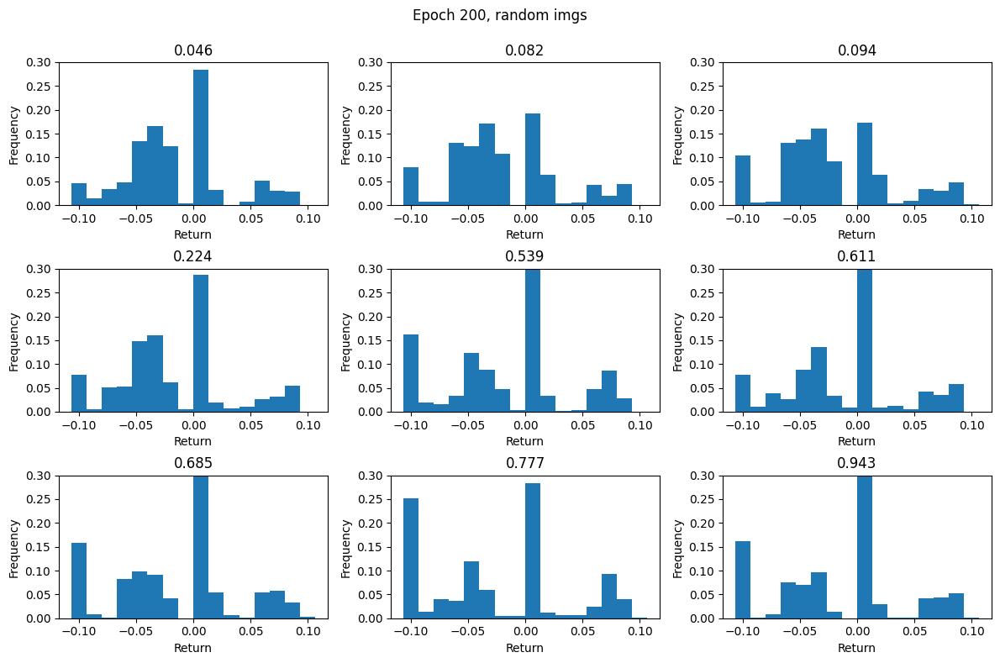

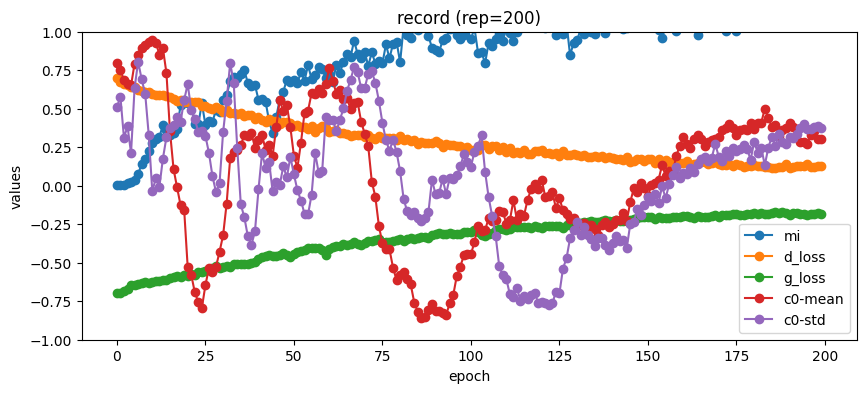

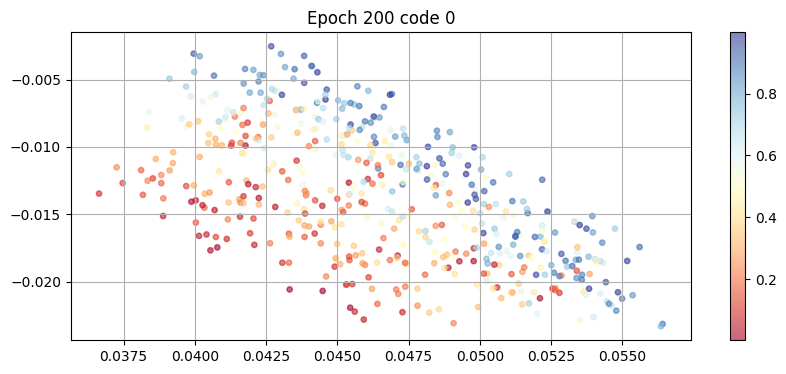

100%|██████████| 31/31 [00:36<00:00,  1.17s/it, G_loss=-.178, D_loss=0.127, MI=1.22]


epoch: 201, D_loss: 0.1269084001260419, G_loss: -0.1783923650941541, MI = 1.2179459160374058


100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.178, D_loss=0.113, MI=1.21]


epoch: 202, D_loss: 0.1128529072288544, G_loss: -0.17807996273040771, MI = 1.2052266367020146


100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.171, D_loss=0.123, MI=1.03]


epoch: 203, D_loss: 0.12254097817405578, G_loss: -0.17145112541414076, MI = 1.0269498440527147


100%|██████████| 31/31 [00:52<00:00,  1.70s/it, G_loss=-.18, D_loss=0.116, MI=1.13]  


epoch: 204, D_loss: 0.11623414293412239, G_loss: -0.1800133768589266, MI = 1.1335778890117523


100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.174, D_loss=0.126, MI=1.04] 


epoch: 205, D_loss: 0.12621143316068956, G_loss: -0.17418604464300216, MI = 1.0419602394104004


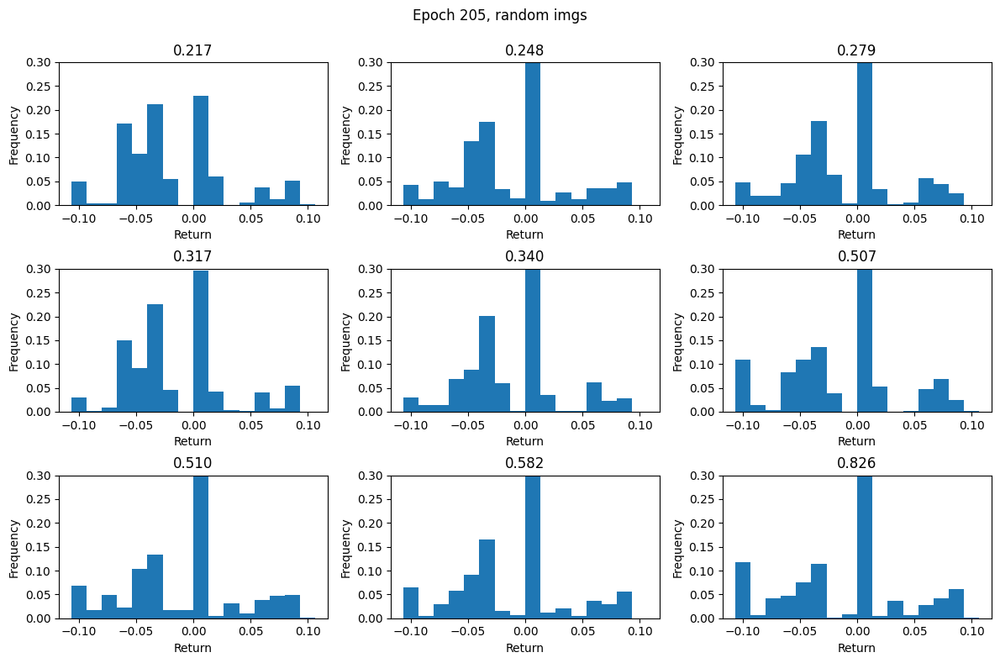

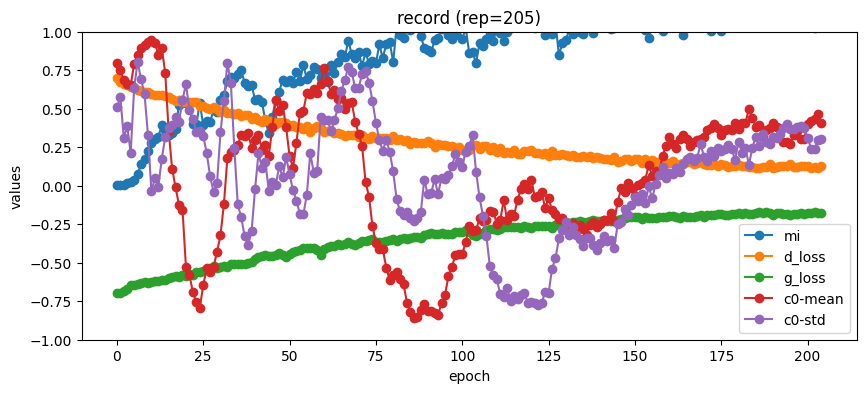

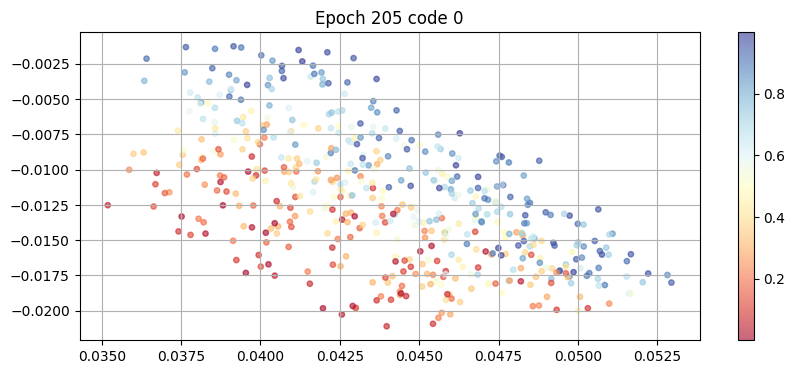

100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.171, D_loss=0.114, MI=1.15] 


epoch: 206, D_loss: 0.11360070734254775, G_loss: -0.17104805765613432, MI = 1.1538052039761697


100%|██████████| 31/31 [00:53<00:00,  1.71s/it, G_loss=-.179, D_loss=0.11, MI=1.1]   


epoch: 207, D_loss: 0.10993585615388808, G_loss: -0.17875746709685172, MI = 1.0997587423170767


100%|██████████| 31/31 [00:52<00:00,  1.70s/it, G_loss=-.176, D_loss=0.129, MI=1.03] 


epoch: 208, D_loss: 0.12927391259900986, G_loss: -0.17605300343805744, MI = 1.0257846078565043


100%|██████████| 31/31 [00:54<00:00,  1.74s/it, G_loss=-.179, D_loss=0.125, MI=1.14]


epoch: 209, D_loss: 0.12494703334185385, G_loss: -0.17874834950893156, MI = 1.139927258414607


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.181, D_loss=0.135, MI=1.08]


epoch: 210, D_loss: 0.13496886313922943, G_loss: -0.18082716003541024, MI = 1.0772933094732222


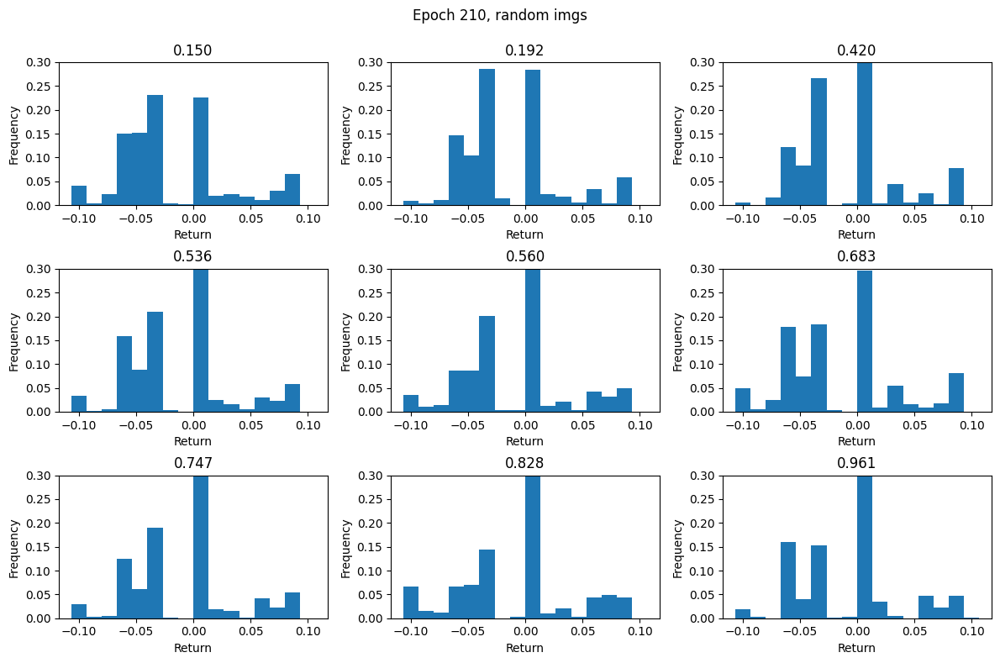

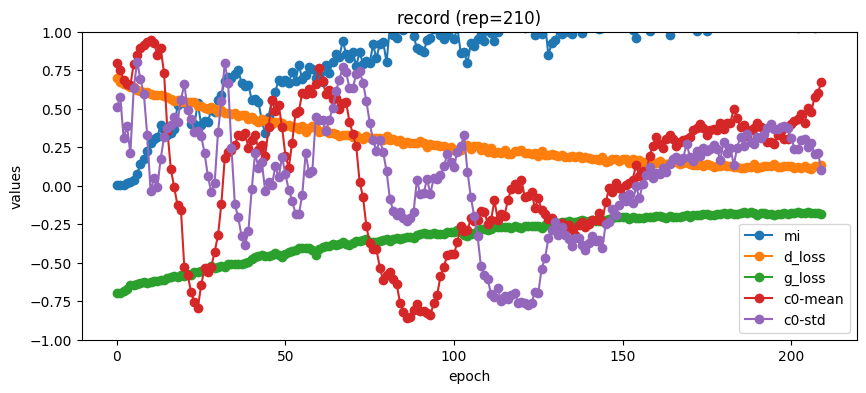

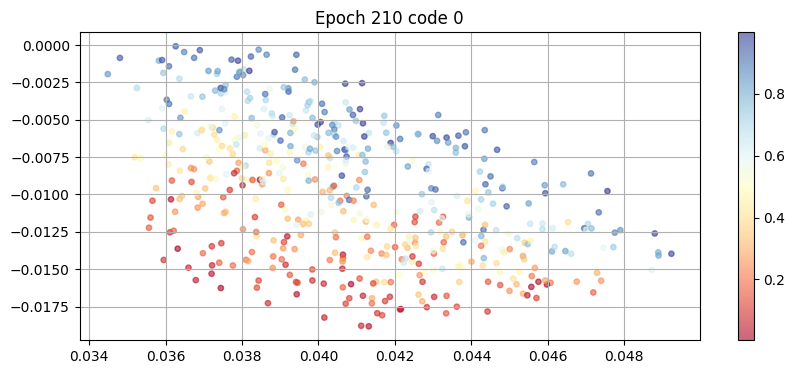

100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.188, D_loss=0.116, MI=1.09] 


epoch: 211, D_loss: 0.1159423616143965, G_loss: -0.187967348483301, MI = 1.088106426500505


100%|██████████| 31/31 [00:52<00:00,  1.71s/it, G_loss=-.174, D_loss=0.122, MI=1.2] 


epoch: 212, D_loss: 0.1217003452681726, G_loss: -0.17449143096323935, MI = 1.2048382912912676


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.173, D_loss=0.129, MI=1.02] 


epoch: 213, D_loss: 0.12948336115767878, G_loss: -0.17288270063938632, MI = 1.024911344051361


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.18, D_loss=0.13, MI=1.11]   


epoch: 214, D_loss: 0.1300067976117134, G_loss: -0.1796941146735222, MI = 1.1128646308375942


100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.175, D_loss=0.127, MI=1.01] 


epoch: 215, D_loss: 0.12650785282734903, G_loss: -0.17535996292867967, MI = 1.0086967945098877


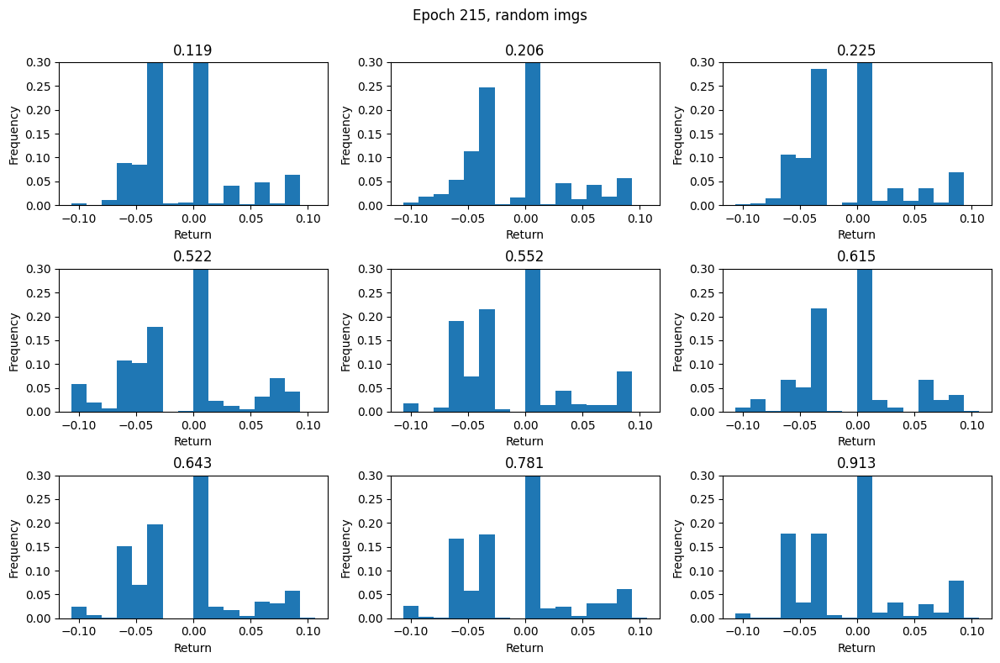

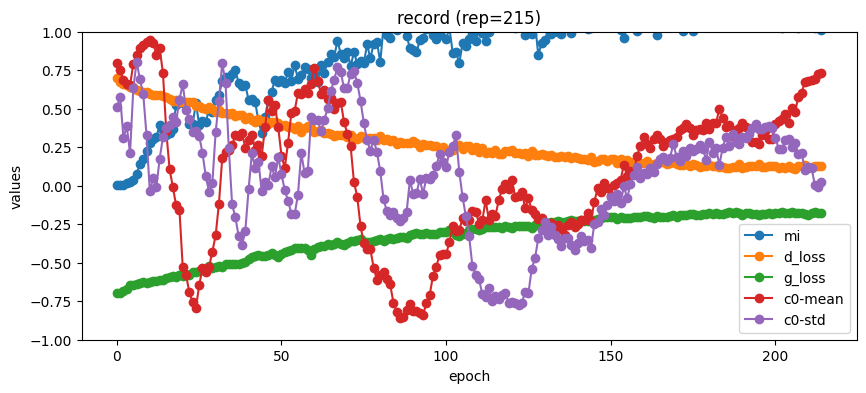

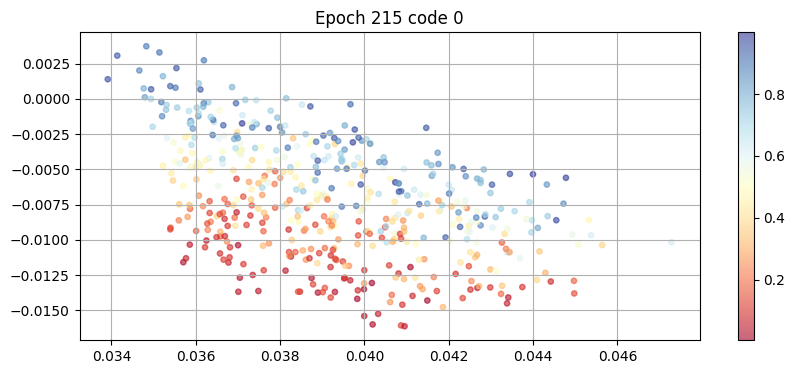

100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.173, D_loss=0.116, MI=1.11]


epoch: 216, D_loss: 0.11576191504155436, G_loss: -0.1730172917727501, MI = 1.1077845942589544


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.174, D_loss=0.128, MI=1.16]


epoch: 217, D_loss: 0.12832742160366428, G_loss: -0.17395843517395757, MI = 1.1616380906874133


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.183, D_loss=0.135, MI=1.28]


epoch: 218, D_loss: 0.13505877193904692, G_loss: -0.18303416140617862, MI = 1.2763105650101938


100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.167, D_loss=0.117, MI=1.06]


epoch: 219, D_loss: 0.11679036795131621, G_loss: -0.16739666798422415, MI = 1.0629525646086662


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.172, D_loss=0.116, MI=1.07]


epoch: 220, D_loss: 0.11599004124441455, G_loss: -0.17182765228133048, MI = 1.0684584744514958


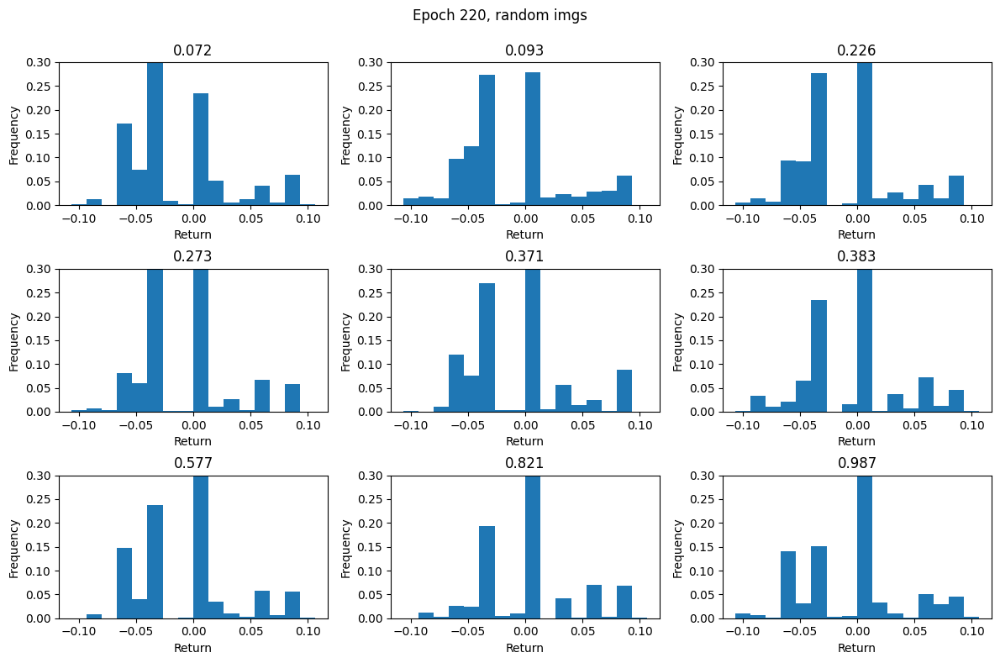

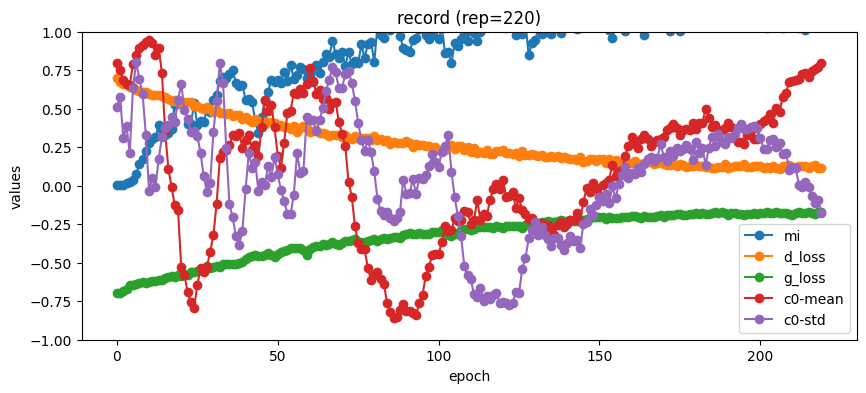

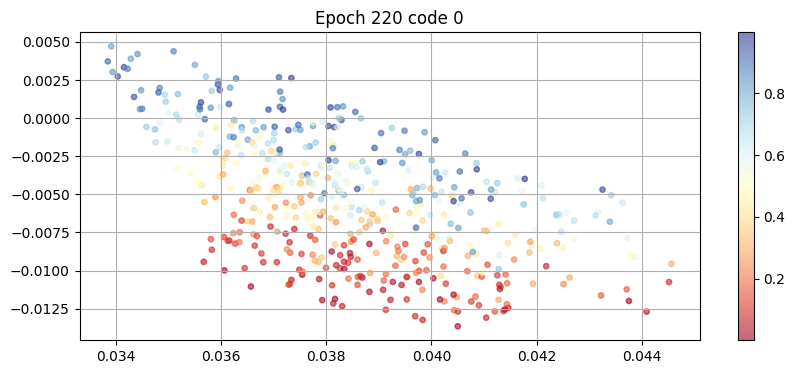

100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.168, D_loss=0.112, MI=1.13] 


epoch: 221, D_loss: 0.11182930969422863, G_loss: -0.1679656385414062, MI = 1.1334195560024631


100%|██████████| 31/31 [00:54<00:00,  1.74s/it, G_loss=-.172, D_loss=0.108, MI=1.11]


epoch: 222, D_loss: 0.10781776232104148, G_loss: -0.17237378368454595, MI = 1.1055047069826434


100%|██████████| 31/31 [00:54<00:00,  1.77s/it, G_loss=-.166, D_loss=0.125, MI=1.13]


epoch: 223, D_loss: 0.12482532594473131, G_loss: -0.16562379127548588, MI = 1.1265455888163658


100%|██████████| 31/31 [00:52<00:00,  1.70s/it, G_loss=-.17, D_loss=0.108, MI=1.14] 


epoch: 224, D_loss: 0.10845691254062037, G_loss: -0.1697371736649544, MI = 1.1380100980881722


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.172, D_loss=0.107, MI=1.16]


epoch: 225, D_loss: 0.10678724463908904, G_loss: -0.17172810146885534, MI = 1.163052745403782


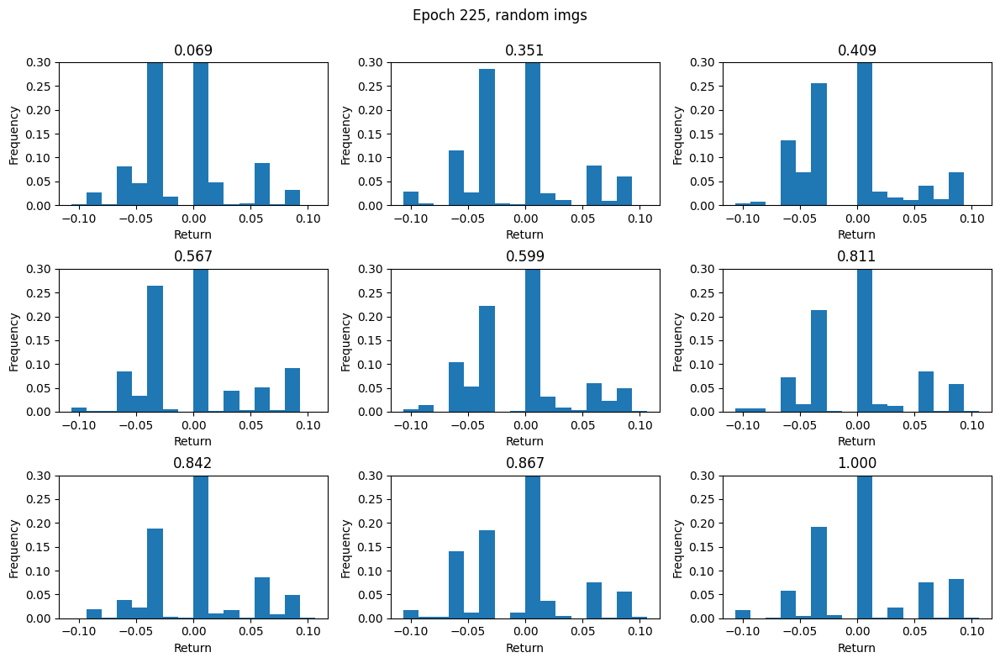

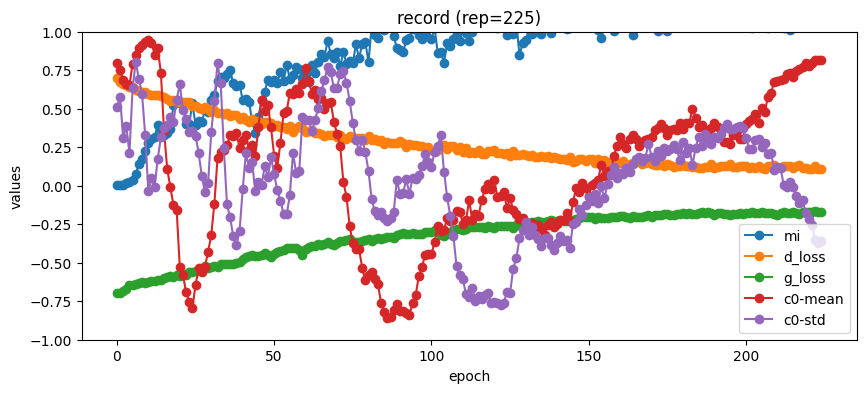

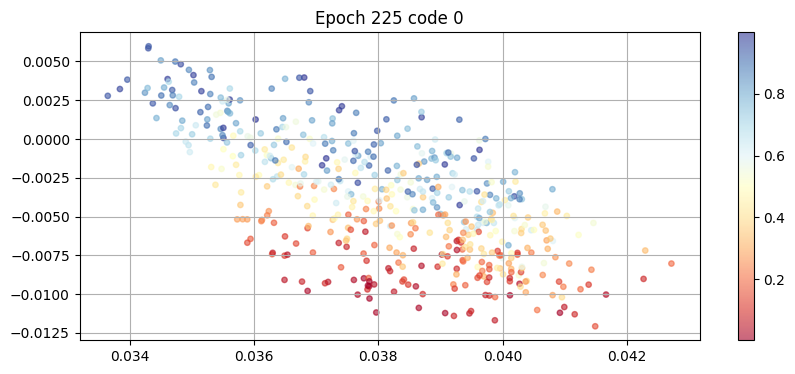

100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.172, D_loss=0.129, MI=1.15]


epoch: 226, D_loss: 0.1288807661302628, G_loss: -0.17188440263271332, MI = 1.1541304049953338


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.174, D_loss=0.129, MI=1.1] 


epoch: 227, D_loss: 0.12857546272777742, G_loss: -0.17388886093131958, MI = 1.1015384197235107


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.176, D_loss=0.122, MI=1.03] 


epoch: 228, D_loss: 0.1216689018953231, G_loss: -0.17648629796120427, MI = 1.0273608046193277


100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.176, D_loss=0.125, MI=1.07]


epoch: 229, D_loss: 0.12505560536538401, G_loss: -0.17618443095876324, MI = 1.0697395532361922


100%|██████████| 31/31 [00:53<00:00,  1.72s/it, G_loss=-.173, D_loss=0.121, MI=0.998]


epoch: 230, D_loss: 0.12105920790664611, G_loss: -0.173435436621789, MI = 0.9982370426577907


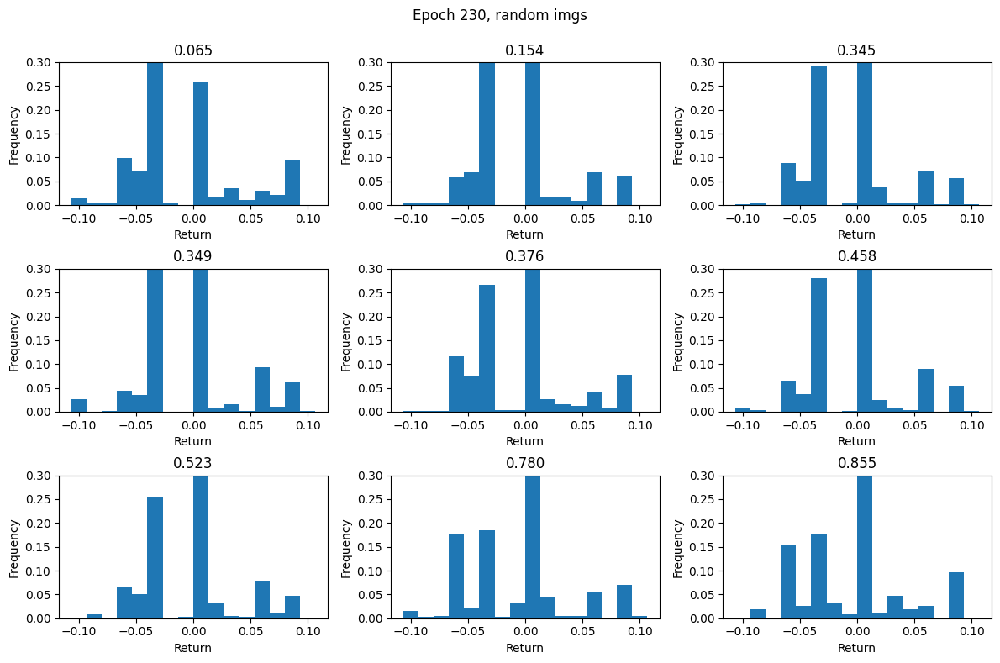

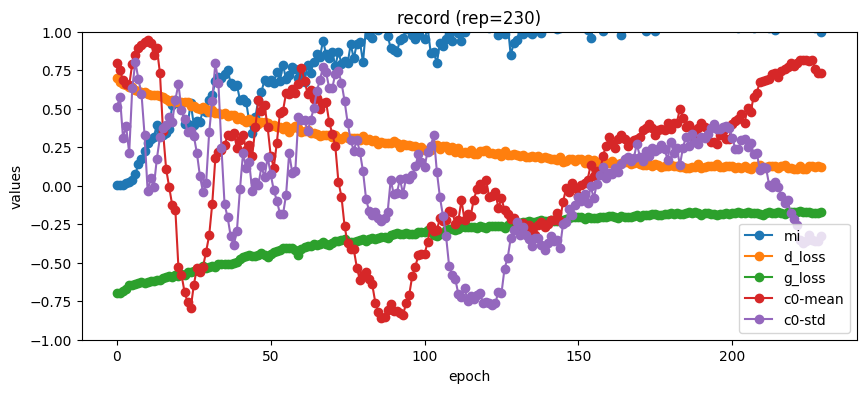

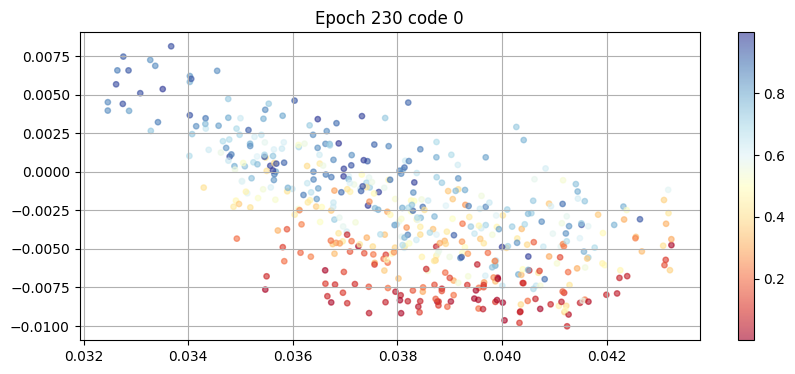

100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.169, D_loss=0.119, MI=0.981]


epoch: 231, D_loss: 0.1187296766907938, G_loss: -0.16896993162170534, MI = 0.9810510066247755


100%|██████████| 31/31 [00:55<00:00,  1.80s/it, G_loss=-.172, D_loss=0.105, MI=1.13] 


epoch: 232, D_loss: 0.10490688321090513, G_loss: -0.17208006257011044, MI = 1.1338228756381619


100%|██████████| 31/31 [00:54<00:00,  1.74s/it, G_loss=-.168, D_loss=0.111, MI=1.22]


epoch: 233, D_loss: 0.11065920057796663, G_loss: -0.16788349685169035, MI = 1.2154847114316878


100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.172, D_loss=0.112, MI=1.14]


epoch: 234, D_loss: 0.11174328000314775, G_loss: -0.172217900233884, MI = 1.140810449277201


100%|██████████| 31/31 [00:54<00:00,  1.77s/it, G_loss=-.17, D_loss=0.118, MI=1.18] 


epoch: 235, D_loss: 0.1180268290542787, G_loss: -0.1699047689476321, MI = 1.1779126563379843


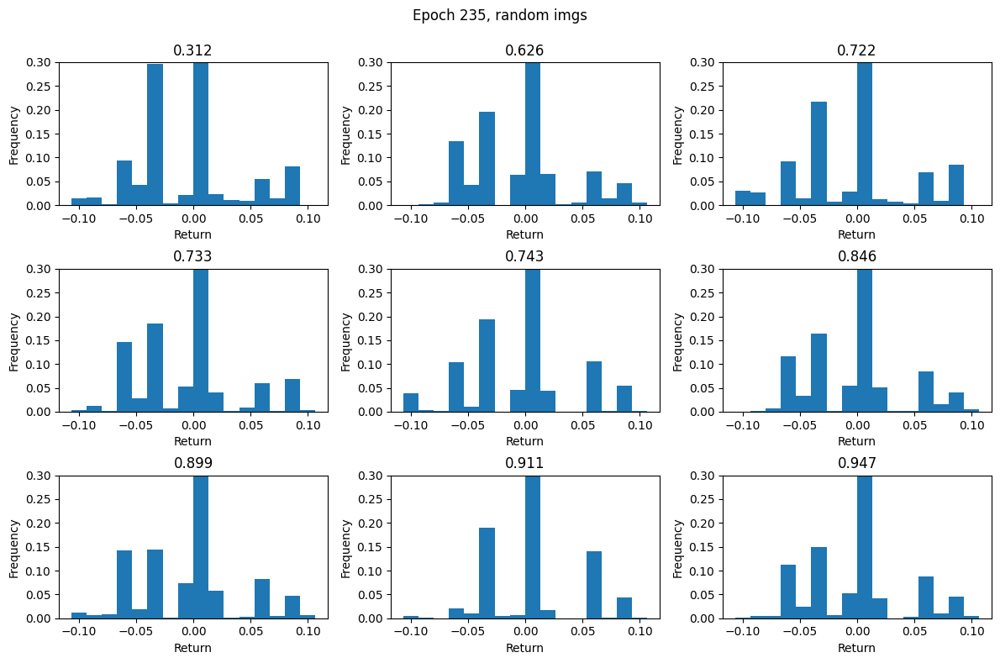

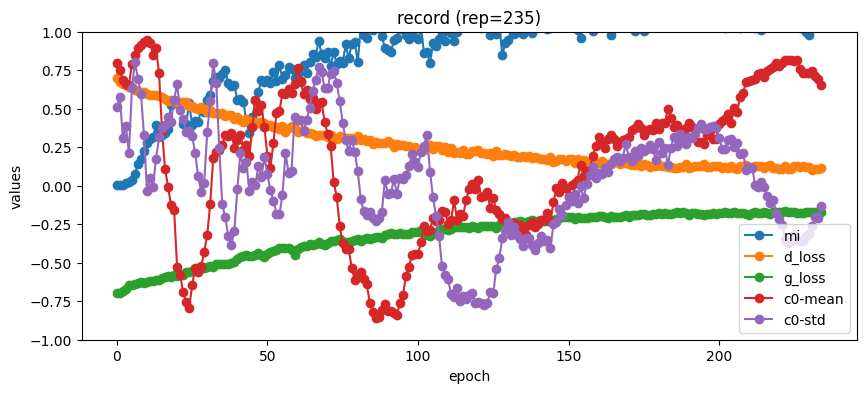

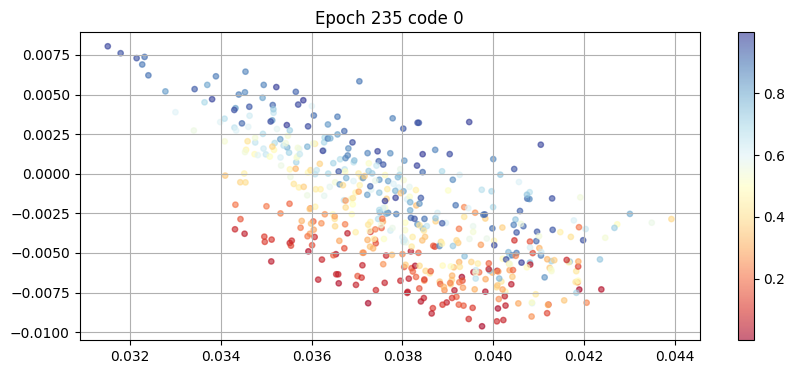

100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.17, D_loss=0.139, MI=1.19]  


epoch: 236, D_loss: 0.13934008524783195, G_loss: -0.16981339839196974, MI = 1.1938593579876808


100%|██████████| 31/31 [00:54<00:00,  1.74s/it, G_loss=-.174, D_loss=0.123, MI=1.07]


epoch: 237, D_loss: 0.12289627088654426, G_loss: -0.1741049034941581, MI = 1.071821689605713


100%|██████████| 31/31 [00:52<00:00,  1.71s/it, G_loss=-.167, D_loss=0.0973, MI=1.18]


epoch: 238, D_loss: 0.09730801791433365, G_loss: -0.1668332887272681, MI = 1.180527440963253


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.166, D_loss=0.0975, MI=1.02] 


epoch: 239, D_loss: 0.09747395424112197, G_loss: -0.16570250449642057, MI = 1.0181611007259739


100%|██████████| 31/31 [00:53<00:00,  1.74s/it, G_loss=-.16, D_loss=0.109, MI=1.25]  


epoch: 240, D_loss: 0.10940269813422233, G_loss: -0.16005147969530475, MI = 1.248091584251773


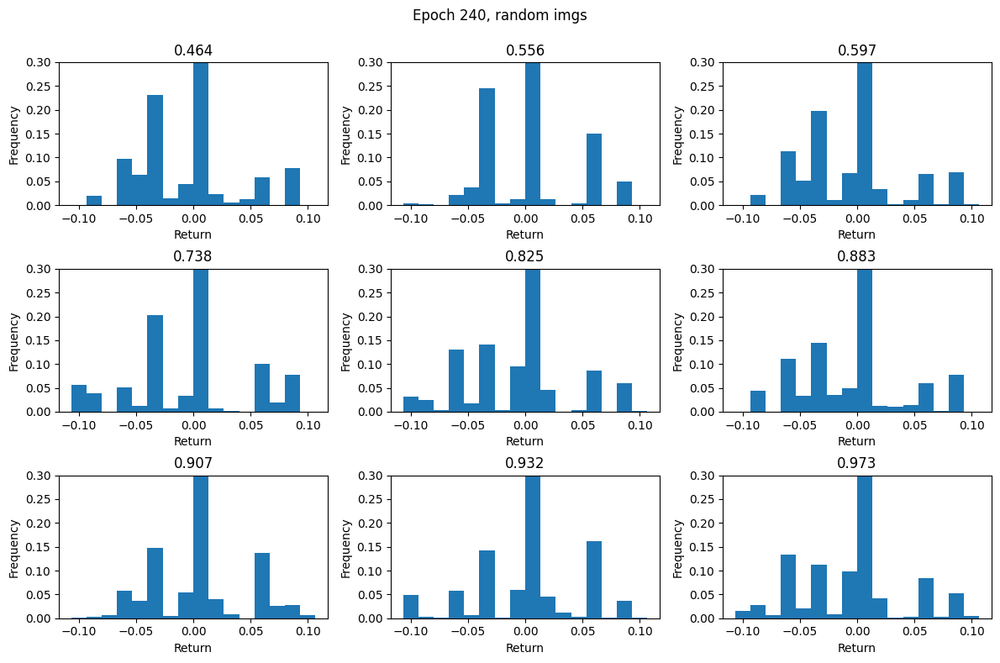

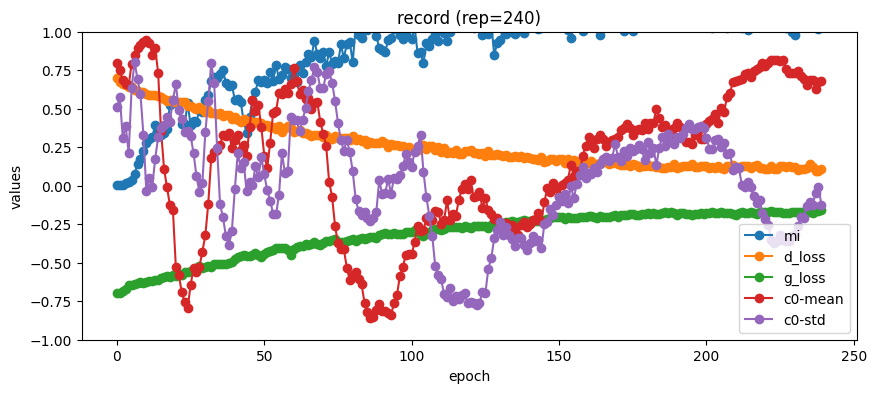

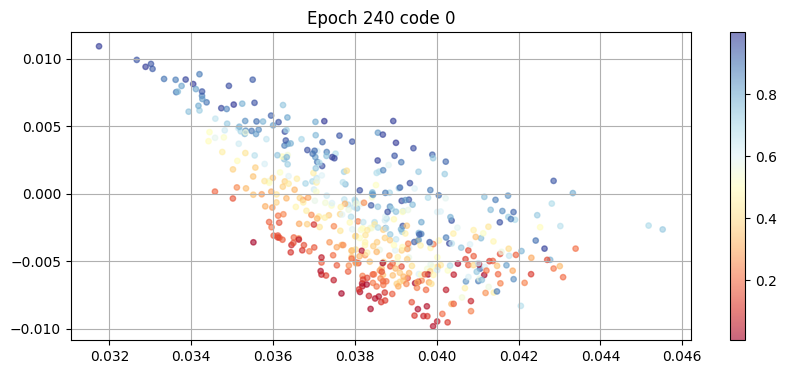

100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.165, D_loss=0.106, MI=1.06] 


epoch: 241, D_loss: 0.10558995364173766, G_loss: -0.16544089201957948, MI = 1.0551475690257164


100%|██████████| 31/31 [00:53<00:00,  1.73s/it, G_loss=-.158, D_loss=0.104, MI=1.13] 


epoch: 242, D_loss: 0.10382659709261309, G_loss: -0.15788282309809037, MI = 1.127580633086543


100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.156, D_loss=0.0985, MI=1.09]


epoch: 243, D_loss: 0.09845037397838408, G_loss: -0.15593083106702374, MI = 1.0928206693741582


100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.157, D_loss=0.104, MI=1.11]


epoch: 244, D_loss: 0.10376707440422427, G_loss: -0.1571924494158837, MI = 1.1124724764977731


100%|██████████| 31/31 [00:54<00:00,  1.77s/it, G_loss=-.16, D_loss=0.107, MI=0.996] 


epoch: 245, D_loss: 0.1070909192485194, G_loss: -0.1595407272538831, MI = 0.9956426293619217


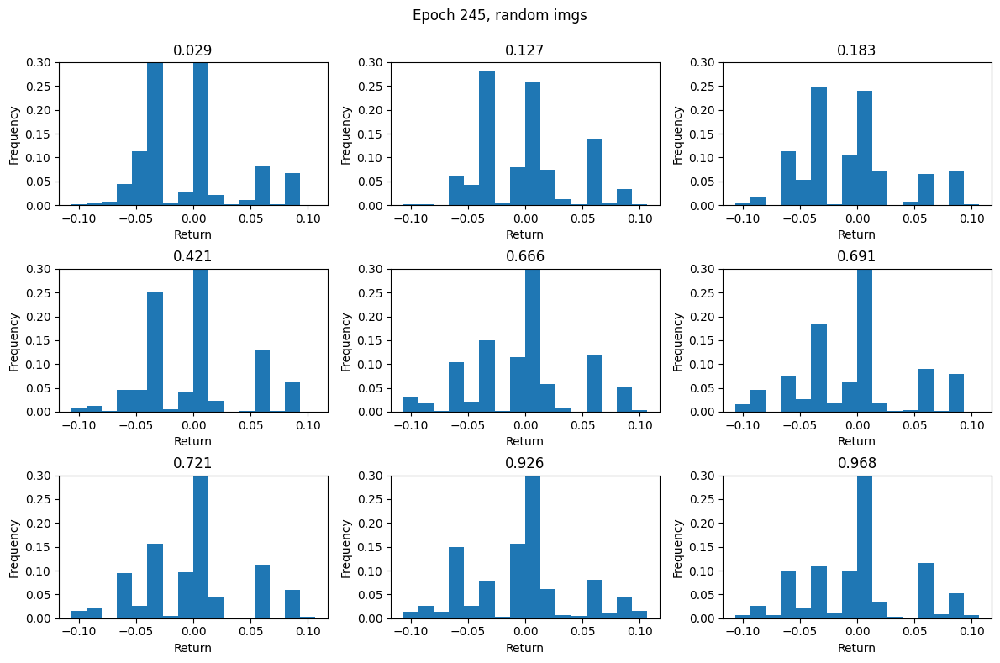

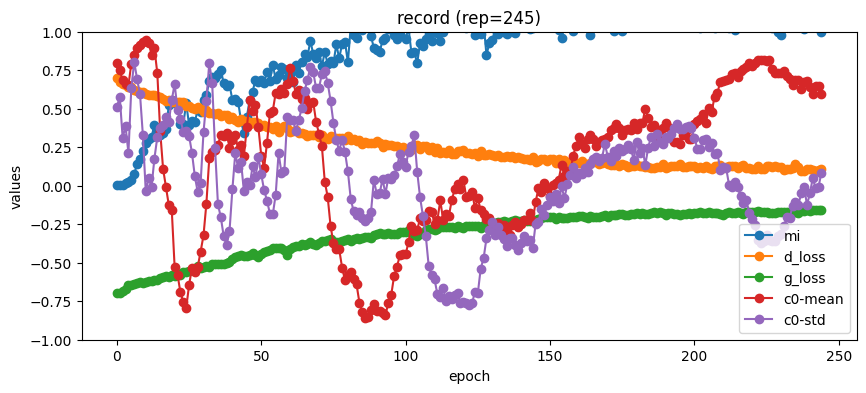

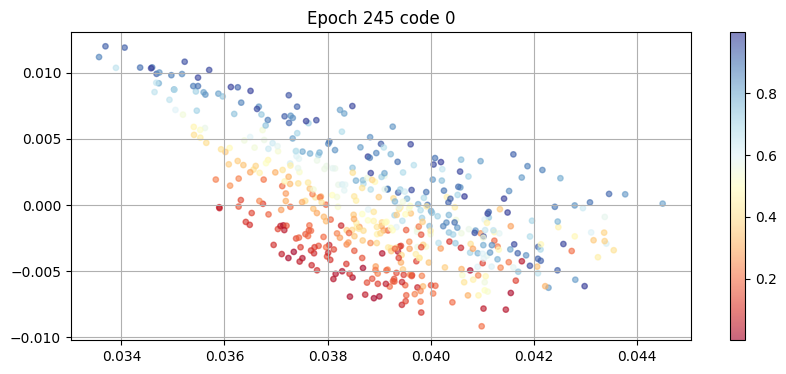

100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.151, D_loss=0.107, MI=1.05] 


epoch: 246, D_loss: 0.10734096205522937, G_loss: -0.15066083088036505, MI = 1.0504945324313255


100%|██████████| 31/31 [00:54<00:00,  1.76s/it, G_loss=-.155, D_loss=0.111, MI=1.09]


epoch: 247, D_loss: 0.11065269285632719, G_loss: -0.15521719282673252, MI = 1.0865534813173356


100%|██████████| 31/31 [00:55<00:00,  1.79s/it, G_loss=-.152, D_loss=0.0937, MI=1.05] 


epoch: 248, D_loss: 0.09372108501772727, G_loss: -0.15220483656852477, MI = 1.0476620601069542


100%|██████████| 31/31 [00:55<00:00,  1.79s/it, G_loss=-.15, D_loss=0.101, MI=1.06]   


epoch: 249, D_loss: 0.10123837270563649, G_loss: -0.15039346679564444, MI = 1.0599442739640512


100%|██████████| 31/31 [00:54<00:00,  1.75s/it, G_loss=-.152, D_loss=0.101, MI=1.01]  


epoch: 250, D_loss: 0.10132596281266981, G_loss: -0.15244768199420744, MI = 1.006255265205137


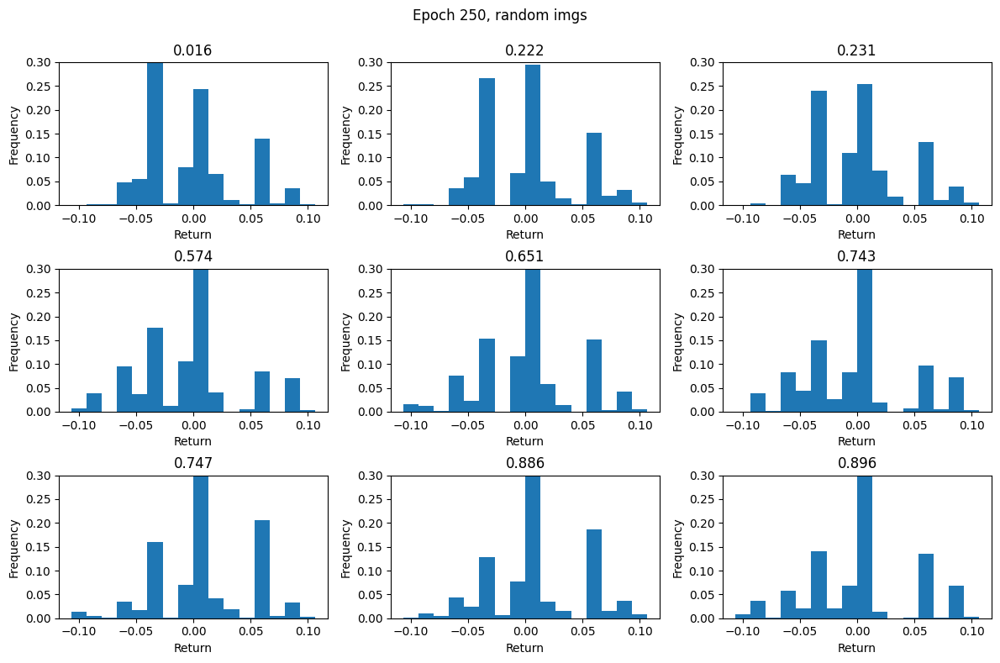

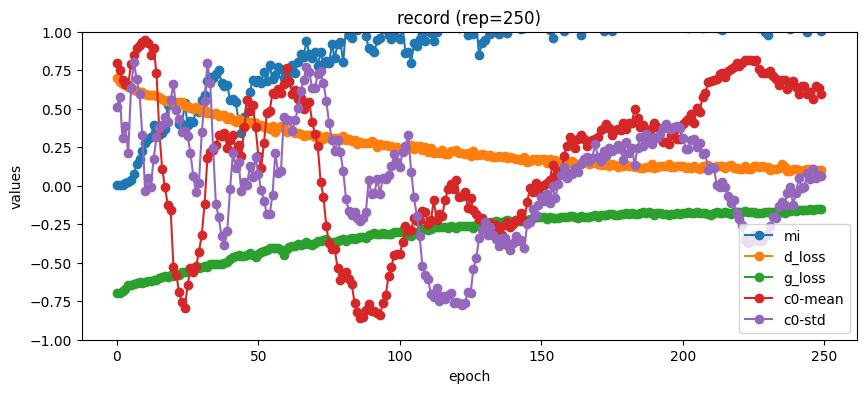

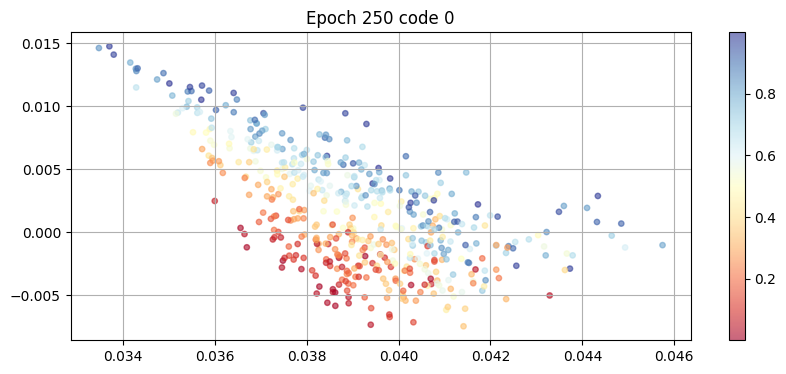

100%|██████████| 31/31 [01:28<00:00,  2.85s/it, G_loss=-.152, D_loss=0.122, MI=1.02] 


epoch: 251, D_loss: 0.12207991221258717, G_loss: -0.15199896452888365, MI = 1.0203583932692004


100%|██████████| 31/31 [02:13<00:00,  4.32s/it, G_loss=-.143, D_loss=0.104, MI=1.03] 


epoch: 252, D_loss: 0.10367977018317868, G_loss: -0.14250276502101653, MI = 1.0310220410746913


100%|██████████| 31/31 [02:15<00:00,  4.38s/it, G_loss=-.146, D_loss=0.0936, MI=1.05] 


epoch: 253, D_loss: 0.09363830245790943, G_loss: -0.14592212222276196, MI = 1.0459324256066354


100%|██████████| 31/31 [02:16<00:00,  4.41s/it, G_loss=-.146, D_loss=0.0896, MI=1.06]


epoch: 254, D_loss: 0.08955650127703144, G_loss: -0.1456757240718411, MI = 1.0593721385925048


 87%|████████▋ | 27/31 [01:58<00:16,  4.23s/it, G_loss=-.143, D_loss=0.0974, MI=1.15]

In [45]:
import openpyxl
epoch = 400

recorder_keywords = ['d_loss', 'g_loss', 'mi']
for i in range(code_qubits):
    recorder_keywords.append(f'c{i}-mean')
    recorder_keywords.append(f'c{i}-std')
recorder = {k: [] for k in recorder_keywords}
final_rep = 0

for rep in range(1, epoch+1):
    np.random.shuffle(dataset)
    iter_num = int(len(dataset) * 0.25 //BATCH_SIZE) # 매번 50% 추출해서 학습. 셔플하니까 자투리 생기는건 무시.

    G_loss_sum = 0.0
    D_loss_sum = 0.0
    mi_sum = 0.0

    log_gen_outputs = []
    log_gen_codes = []
    pbar = tqdm(range(iter_num))

    for i in pbar:
        batch = torch.FloatTensor(dataset[BATCH_SIZE * i : BATCH_SIZE * i + BATCH_SIZE])

        # train generator
        generator_seed = torch.rand((BATCH_SIZE, n_qubits))
        generator_output, generator_loss = generator_train_step(generator_params, generator_seed, use_mine=use_mine)
        G_opt.zero_grad()
        generator_loss.requires_grad_(True)
        generator_loss.backward()
        G_opt.step()

        # train discriminator
        fake_input = generator_output.detach().to(torch.float32)
        disc_loss = disc_cost_fn(batch, fake_input, smoothing=False)
        D_opt.zero_grad()
        disc_loss.requires_grad_(True)
        disc_loss.backward()
        D_opt.step()

        # train mine
        code_input = generator_seed[:, -code_qubits:] 
        pred_xy = mine(code_input, fake_input)
        code_input_shuffle = code_input[torch.randperm(BATCH_SIZE)]
        pred_x_y = mine(code_input_shuffle, fake_input)
        mi = -torch.mean(pred_xy) + torch.log(torch.mean(torch.exp(pred_x_y)))
        M_opt.zero_grad()
        mi.requires_grad_(True)
        mi.backward()
        M_opt.step()

        D_loss_sum += disc_loss.item()
        G_loss_sum += generator_loss.item()
        mi_sum -= mi.item() # (-1)곱해져 있어서 빼야함.

        pbar.set_postfix({'G_loss': G_loss_sum/(i+1), 'D_loss': D_loss_sum/(i+1), 'MI': mi_sum/(i+1)})
        log_gen_outputs.append(fake_input.numpy())
        log_gen_codes.append(code_input.numpy())

    G_scheduler.step()
    D_scheduler.step()
    M_scheduler.step()

    recorder['d_loss'].append(D_loss_sum/iter_num)
    recorder['g_loss'].append(G_loss_sum/iter_num)
    recorder['mi'].append(mi_sum/iter_num)

    print("epoch: {}, D_loss: {}, G_loss: {}, MI = {}".format(rep, D_loss_sum/iter_num, G_loss_sum/iter_num, mi_sum/iter_num))
    
    log_gen_outputs = np.concatenate(log_gen_outputs, axis=0)
    log_gen_codes = np.concatenate(log_gen_codes, axis=0)
    
    mean_corrs, std_corrs, means, stds = calculate_corr(log_gen_outputs, log_gen_codes)
    for i in range(code_qubits):
        recorder[f'c{i}-mean'].append(mean_corrs[i])
        recorder[f'c{i}-std'].append(std_corrs[i])

    visualize_output(log_gen_outputs, log_gen_codes, means, stds, title, rep, recorder)


    with open(f'result/{title}/discriminator_{rep}.pkl', 'wb') as file:
        pickle.dump(discriminator, file)
    with open(f'result/{title}/generator_{rep}.pkl', 'wb') as file:
        pickle.dump(generator_params, file)

    df = pd.DataFrame(recorder)
    output_filename = f'result/{title}/recorder.xlsx'
    df.to_excel(output_filename, index=False)

    final_rep = rep